## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_quantile_14"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "quantile"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


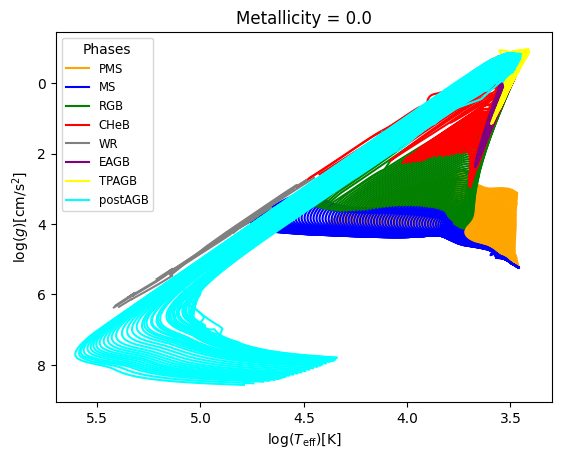

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.00,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.00,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.00,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.05,4.482577,4.350883,0.0,-0.25,12.925175,0.596074
4,5.05,4.485667,4.349692,0.0,-0.25,13.105490,0.600130
...,...,...,...,...,...,...,...
519286,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
519287,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
519288,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
519289,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


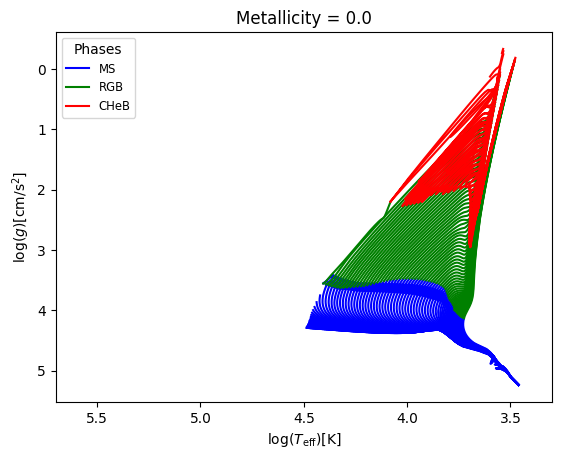

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], 'star_mass':('<', 14)})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4629, Median : 8.5

log_Teff  : Range : 3.34 - 4.6345, Mean : 3.9346, Median : 3.8644

log_g  : Range : -1.08 - 5.4331, Mean : 3.5485, Median : 3.9492

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 13.9995, Mean : 3.398, Median : 2.0471

log_R  : Range : -1.0 - 3.0828, Mean : 0.6067, Median : 0.5386



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 4.634489491902143
Median value in train data for the log_Teff parameter: 3.8641118622993966
Mean value in train data for the log_Teff parameter: 3.9345581069095505

Range in train data for the log_g parameter : -1.0828963170617296 - 5.433094523832443
Median value in train data for the log_g parameter: 3.9484790508590737
Mean value in train data for the log_g parameter: 3.548006174763417

Range in train data for the log_R parameter : -0.9974747647513328 - 3.082068881511837
Median value in train data for the log_R parameter: 0.5381900688843242
Mean value in train data for the log_R parameter: 0.6069651248403705

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 4.633956017110521
Median value in test data for the log_Teff parameter: 3.865317881638998
Mean value in test data for the log_Teff parameter: 3.9346904482232112

Range in test data for the log_g p

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.8634436078944733
  RMSE :  0.132402813341606
  MAE :  0.11641530615838605
  MedAE :  0.12381030703917562
  CORR :  0.9353486587156487
  MAX_ER :  0.6435510797696309
  Percentiles : 
    75th percentile :  0.15872036900845465
    90th percentile :  0.1886054196117332
    95th percentile :  0.2064726007973908
    99th percentile :  0.24688427942431931

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.6617594103468045
  RMSE :  0.15491957152551375
  MAE :  0.11649179026976875
  MedAE :  0.09138615335557443
  CORR :  0.818255301206073
  MAX_ER :  0.6219902752461417
  Percentiles : 
    75th percentile :  0.15386035117836694
    90th percentile :  0.24763030265688232
    

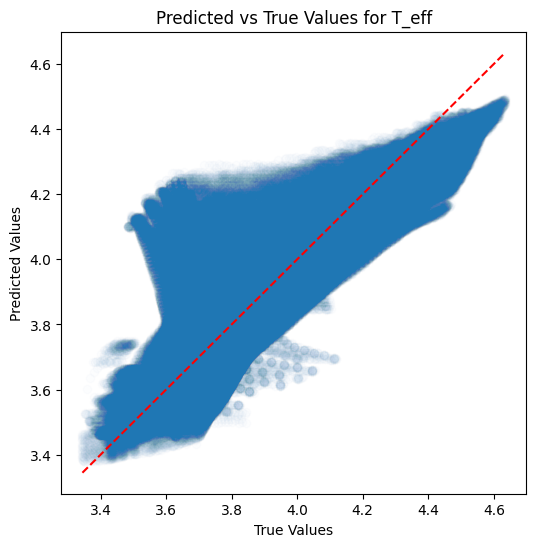

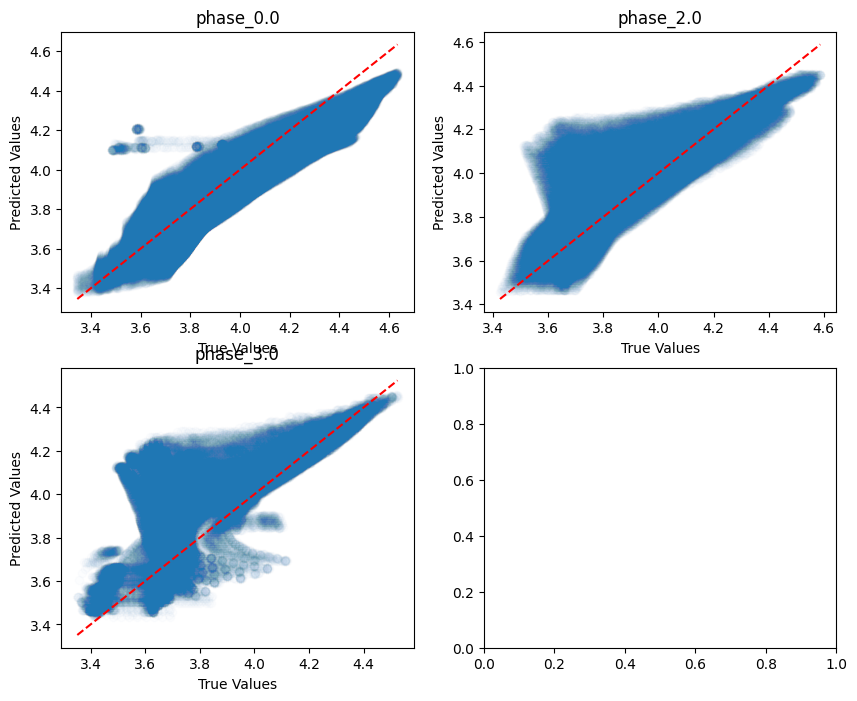

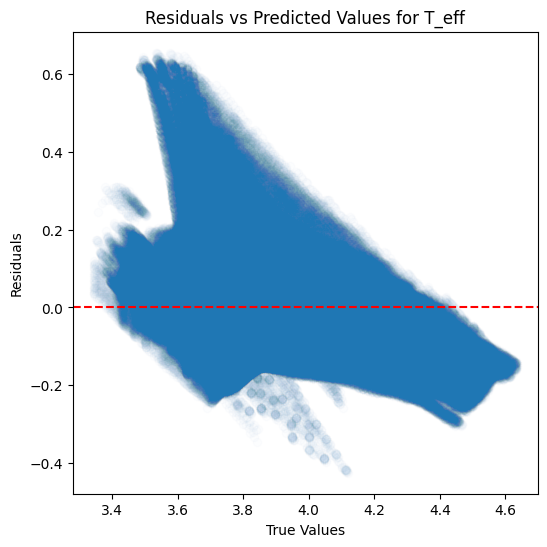

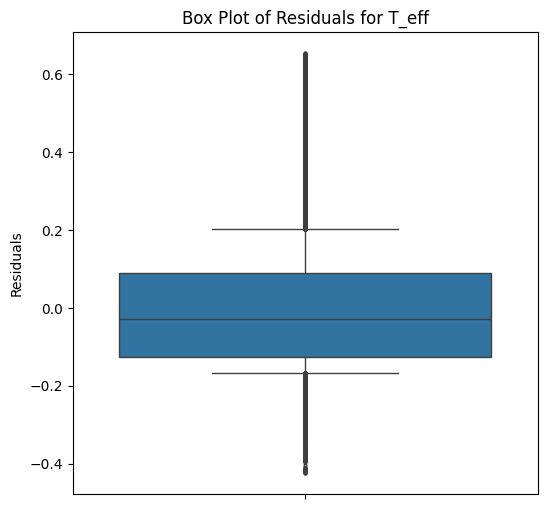

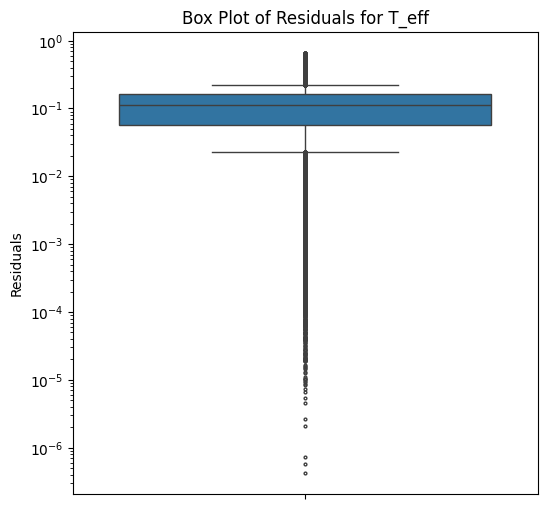

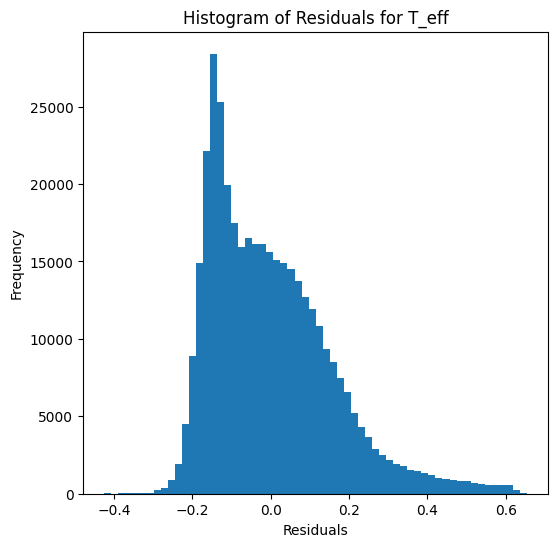

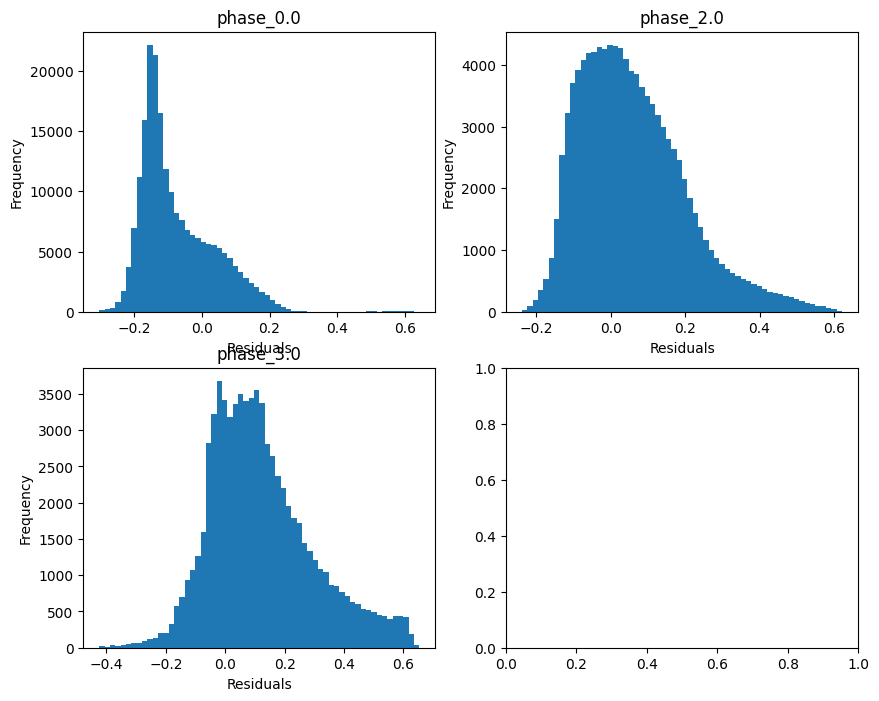

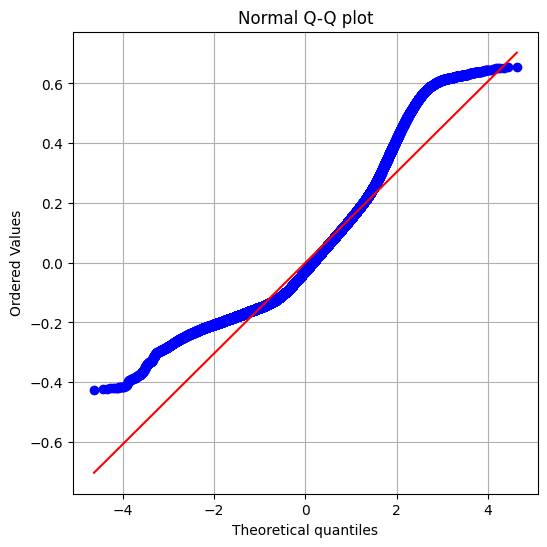

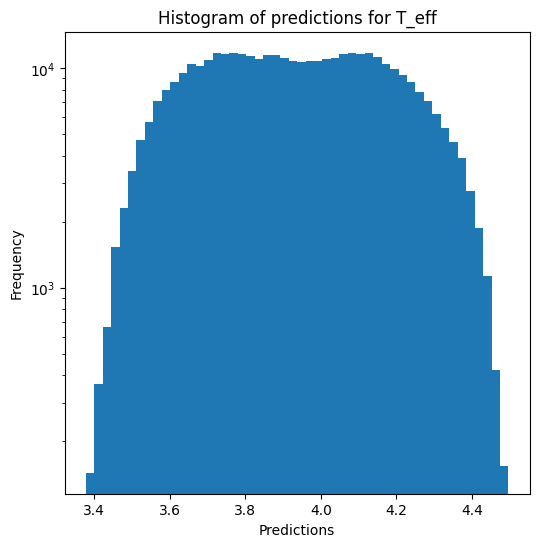

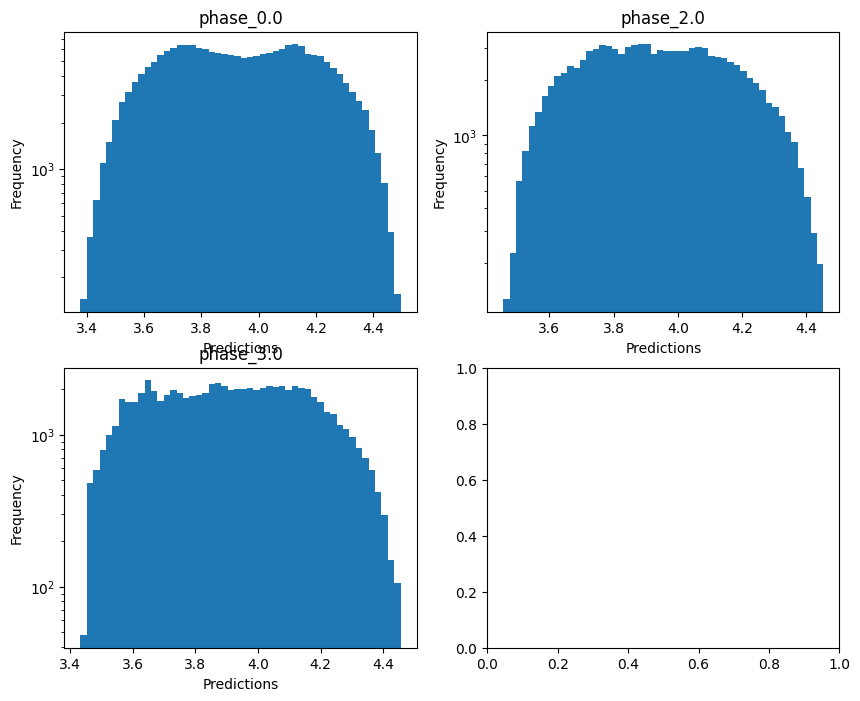

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -1.0861402799108815
  RMSE :  0.8383861641377329
  MAE :  0.7400200184881318
  MedAE :  0.775260128685809
  CORR :  0.6202748767048867
  MAX_ER :  3.4951960023827384
  Percentiles : 
    75th percentile :  0.9477280252565867
    90th percentile :  1.207749806597684
    95th percentile :  1.4226614979314345
    99th percentile :  1.7595759151207968

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.13673955528101178
  RMSE :  0.944589323182159
  MAE :  0.721812791143833
  MedAE :  0.5516186097863172
  CORR :  0.3701334939650304
  MAX_ER :  2.935752557133918
  Percentiles : 
    75th percentile :  1.0047067664485287
    90th percentile :  1.666638853378633
    95th percentile :  2.047231948316779
    99th percentile :  2.517080406562878

log_g results for the phase categor

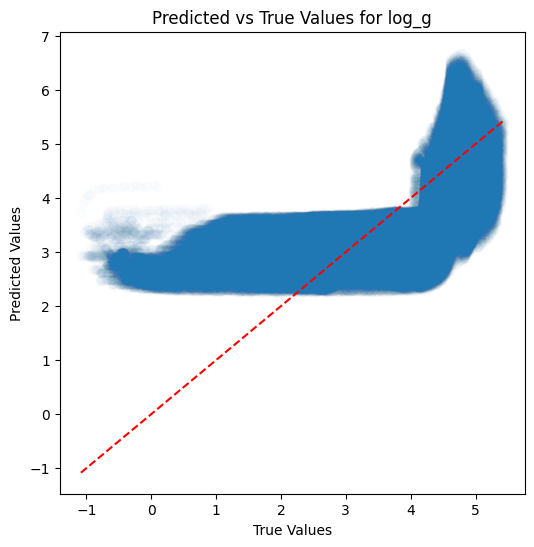

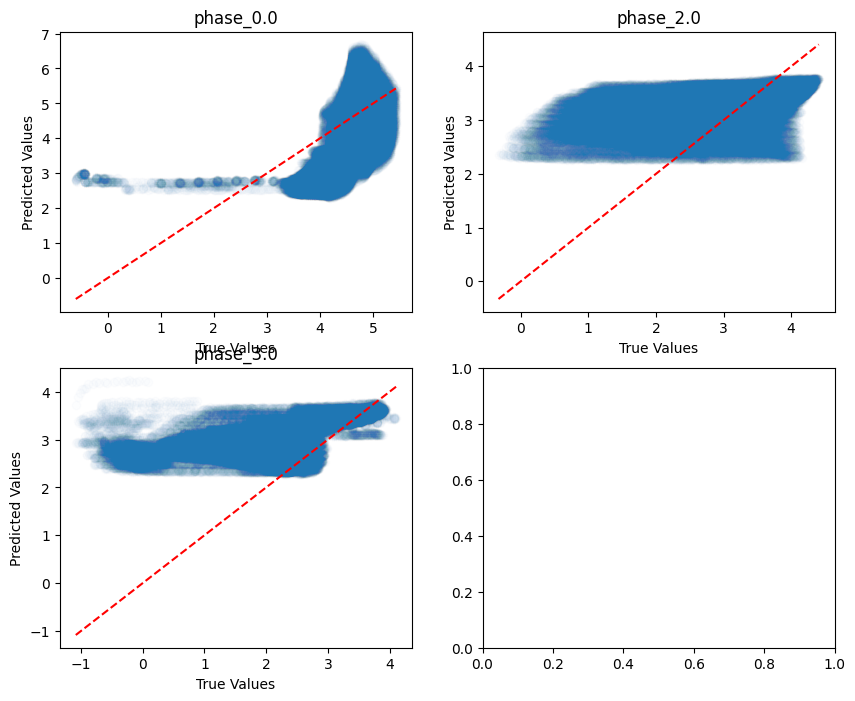

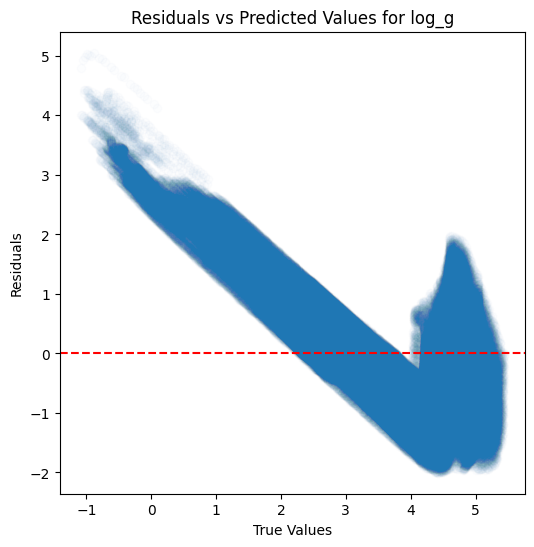

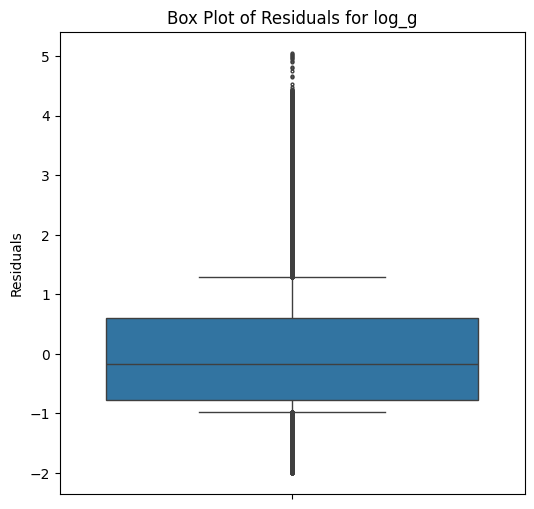

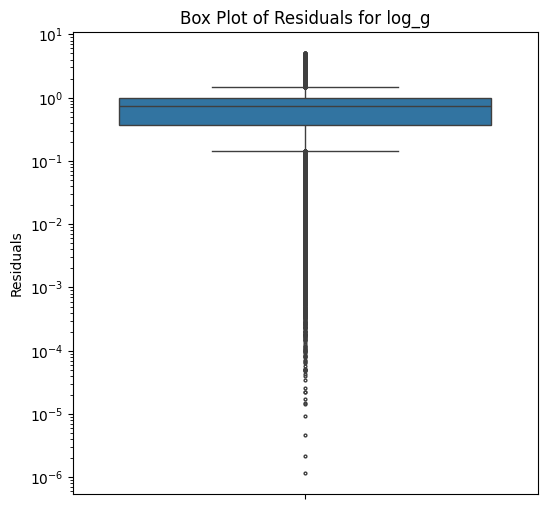

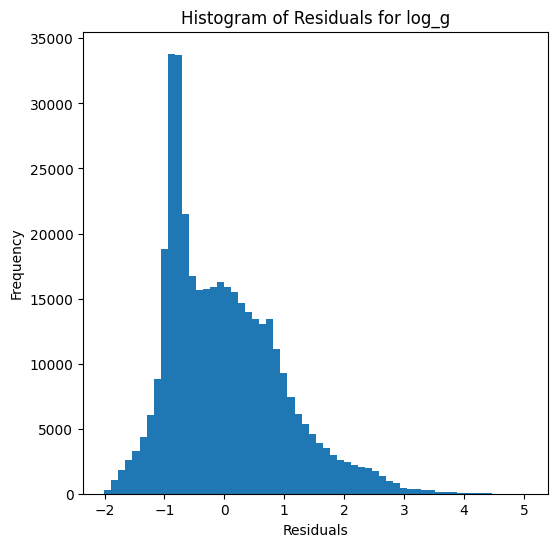

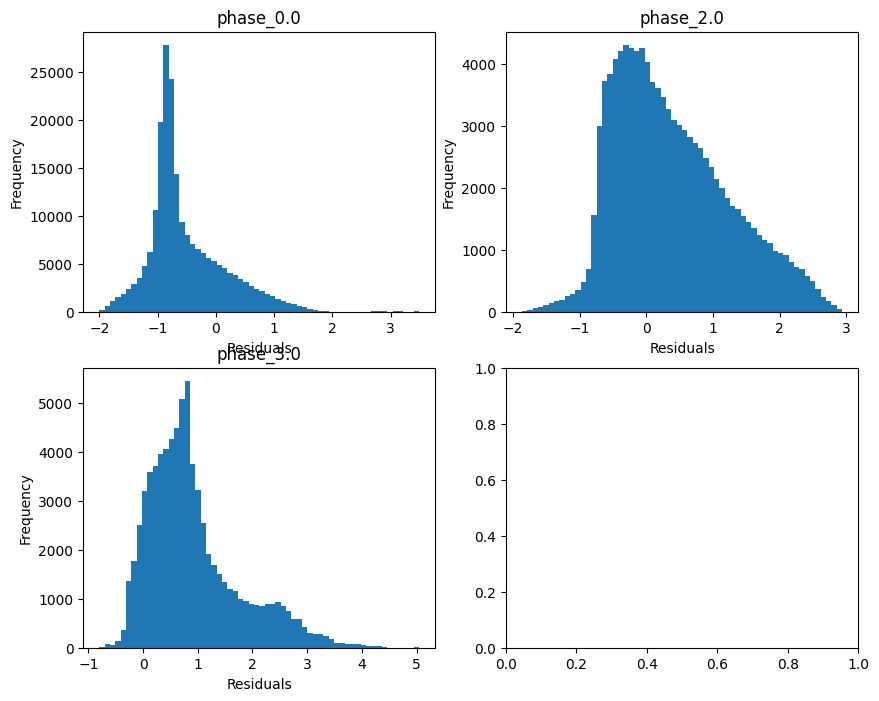

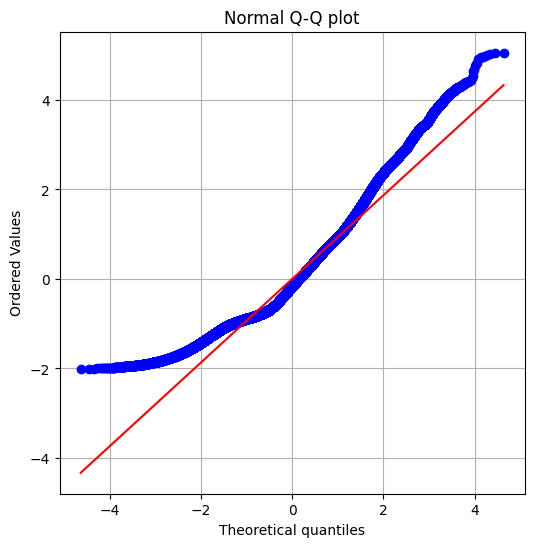

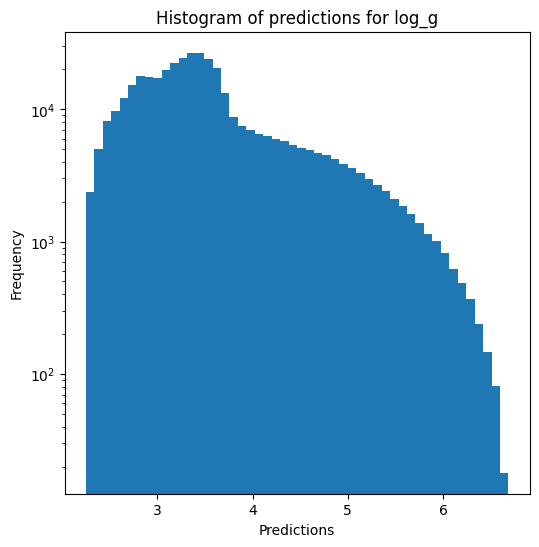

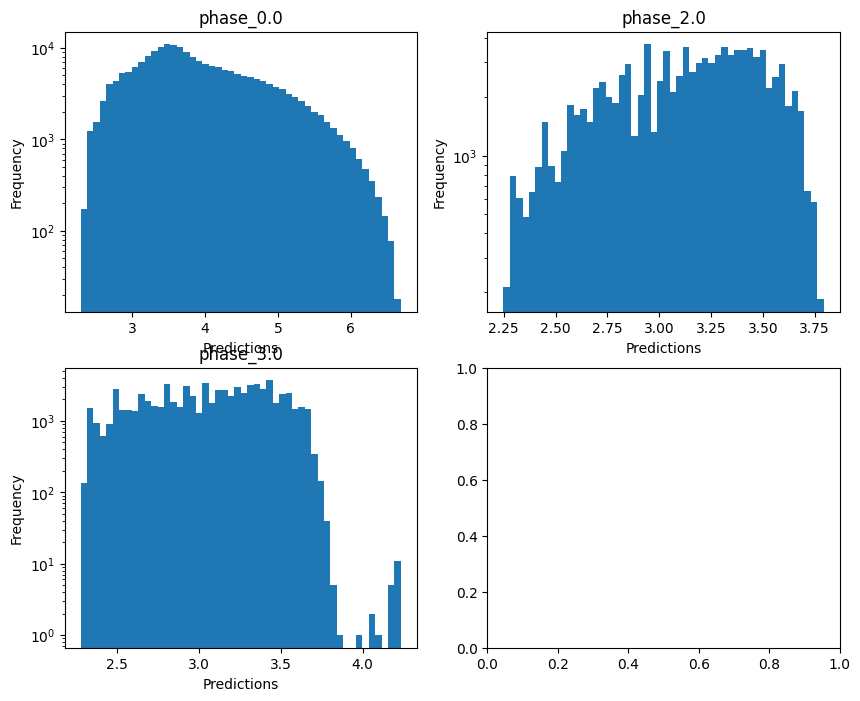


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.3327902323618531
  RMSE :  0.43214193347690094
  MAE :  0.37989461771267835
  MedAE :  0.39296345777845554
  CORR :  0.7833030233260342
  MAX_ER :  1.762541450272531
  Percentiles : 
    75th percentile :  0.4800244154323914
    90th percentile :  0.6308703205662354
    95th percentile :  0.7503230042951383
    99th percentile :  0.9338406403332933

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.119761551848793
  RMSE :  0.4782249160471143
  MAE :  0.36395132409751474
  MedAE :  0.2771783786321801
  CORR :  0.3905138194460046
  MAX_ER :  1.511992127648499
  Percentiles : 
    75th percentile :  0.50223205811321
    90th percentile :  0.8438963946465367
    95th percentile :  1.0420551327732612
    99th percentile :  1.2907734984829202

radius results for the phase category with a val

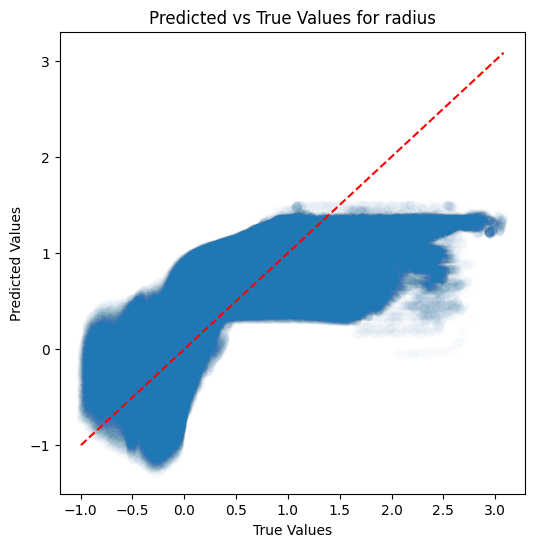

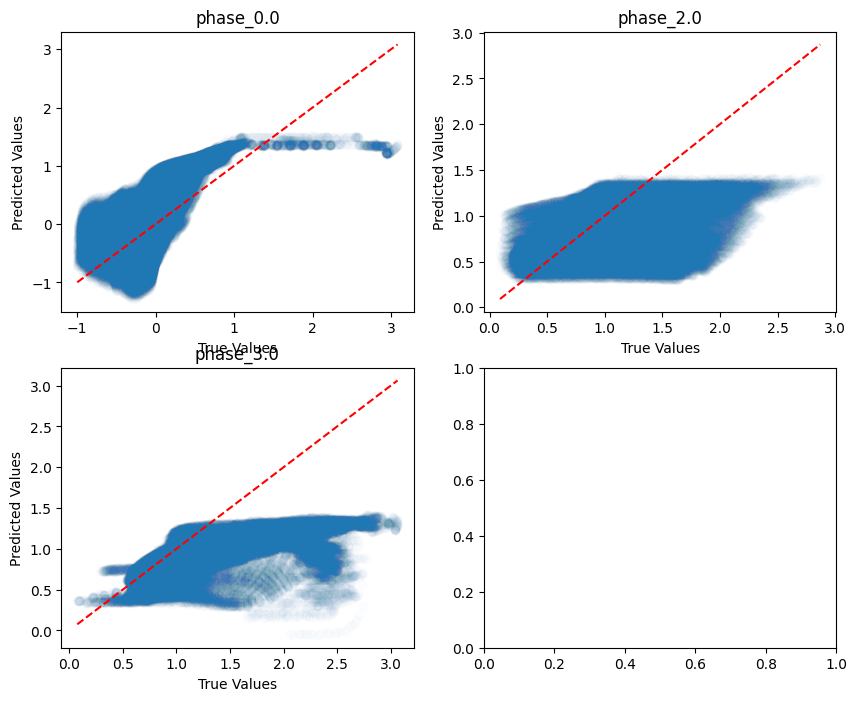

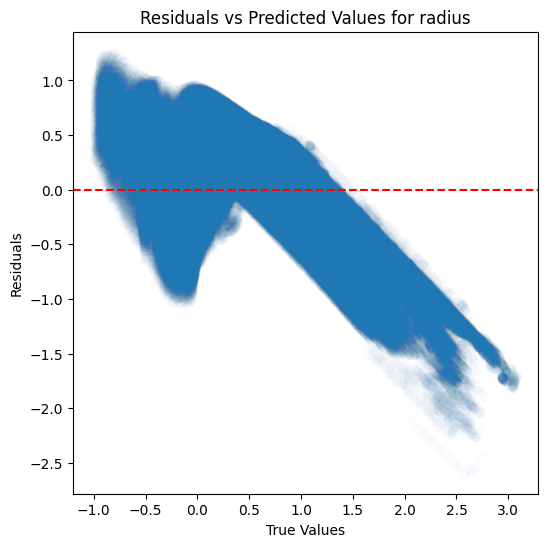

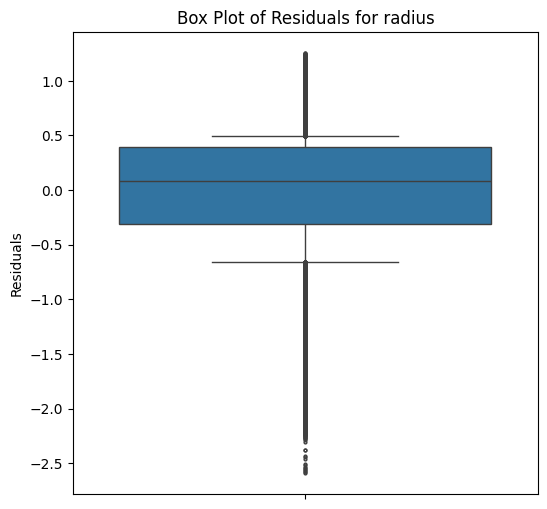

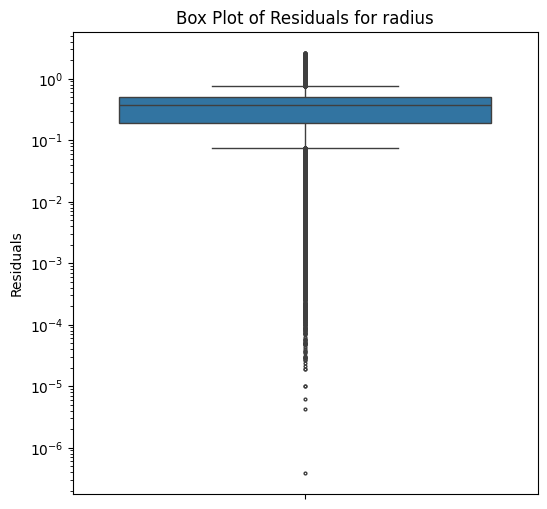

...

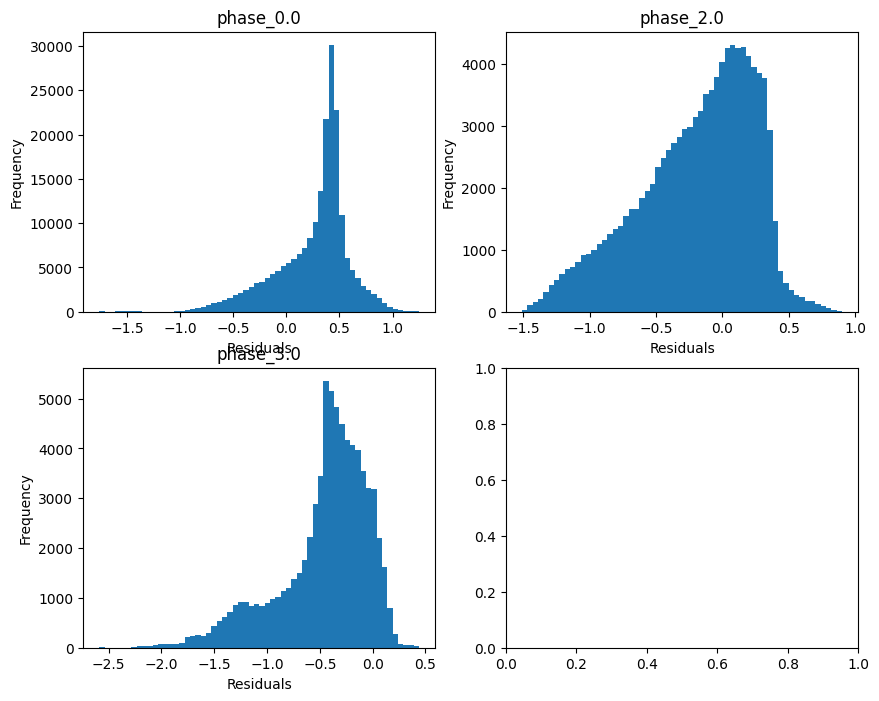

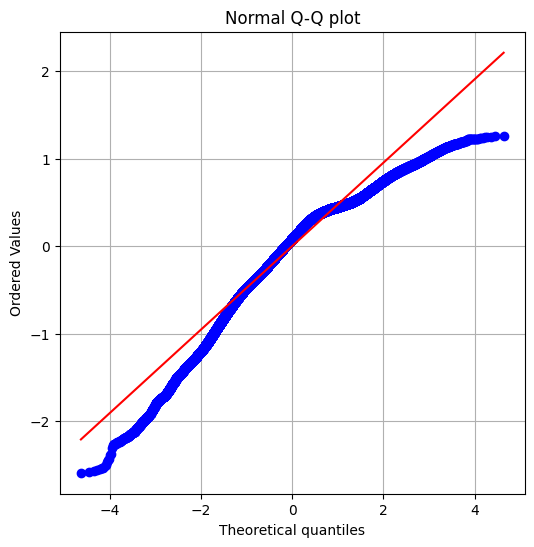

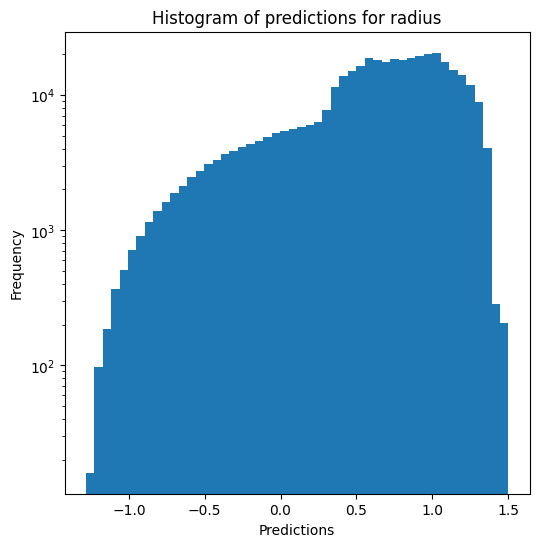

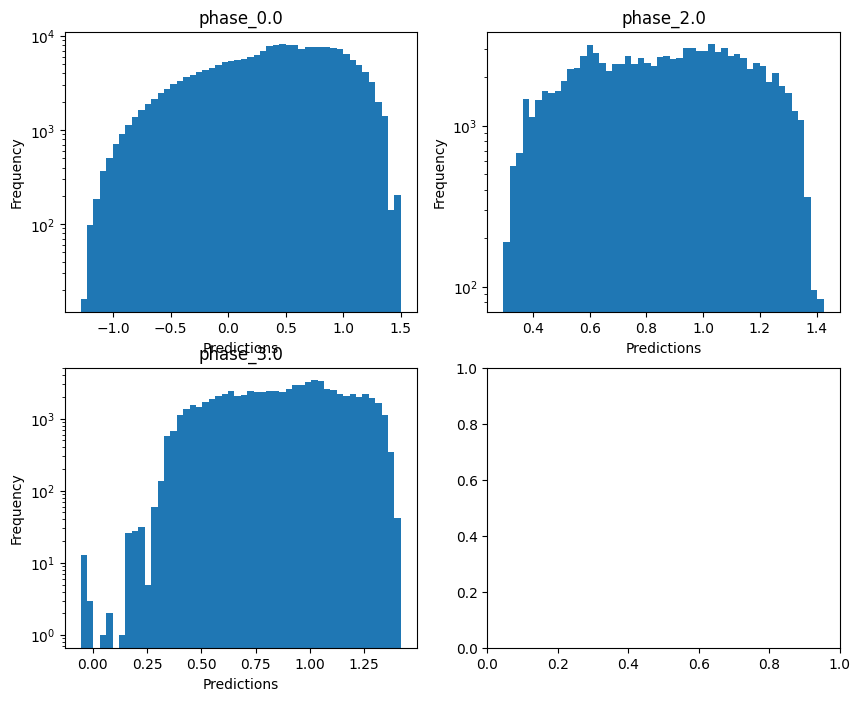

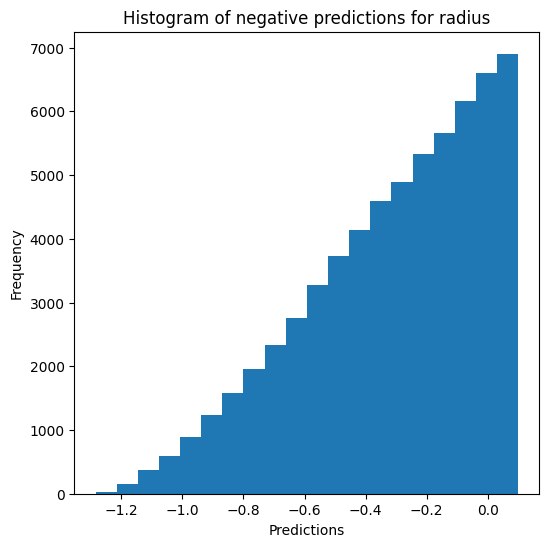

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9710262849610231
  RMSE :  0.0508825709102251
  MAE :  0.007002243394453843
  MedAE :  0.0010208910245363967
  CORR :  0.9857153056966356
  MAX_ER :  0.9170521162841481
  Percentiles : 
    75th percentile :  0.0022380661962508874
    90th percentile :  0.003991489778628044
    95th percentile :  0.007287687627875677
    99th percentile :  0.19439144592964772

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.929044226126217
  RMSE :  0.06543485260977966
  MAE :  0.02671263805022341
  MedAE :  0.0037044993869805865
  CORR :  0.9642601918269426
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.014468775905297715
    90th percentile :  0.093811958

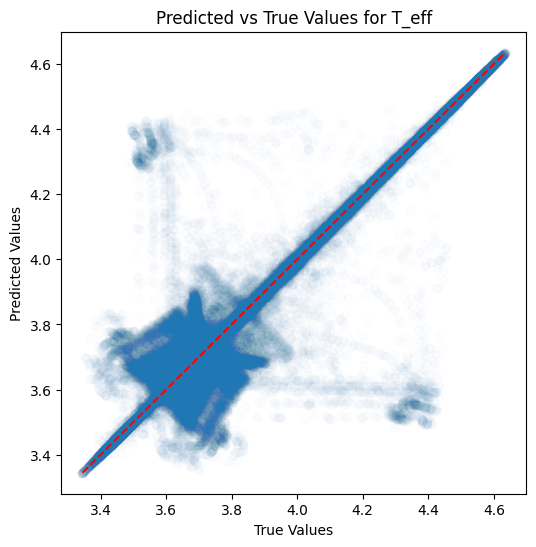

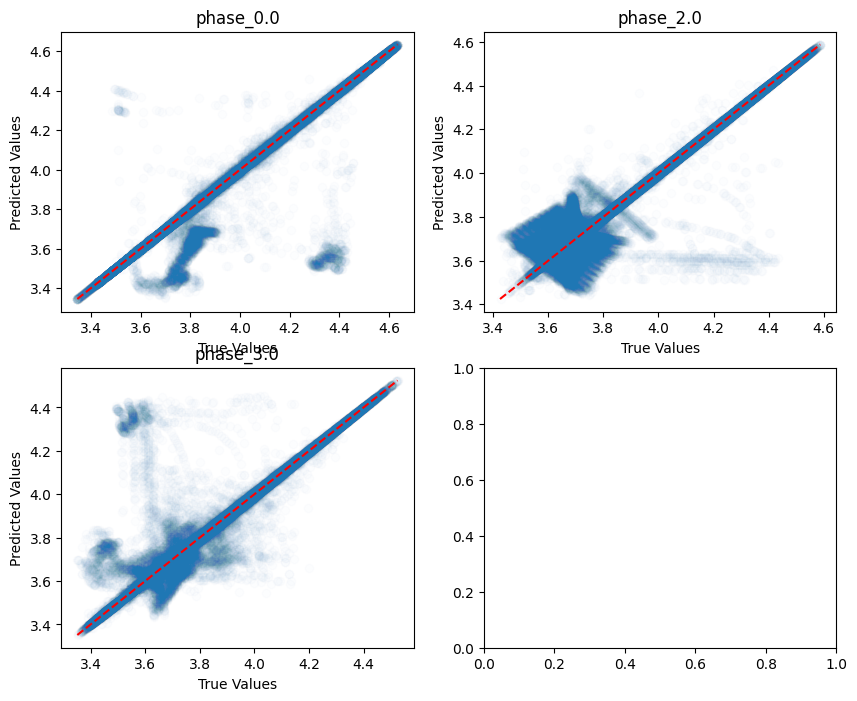

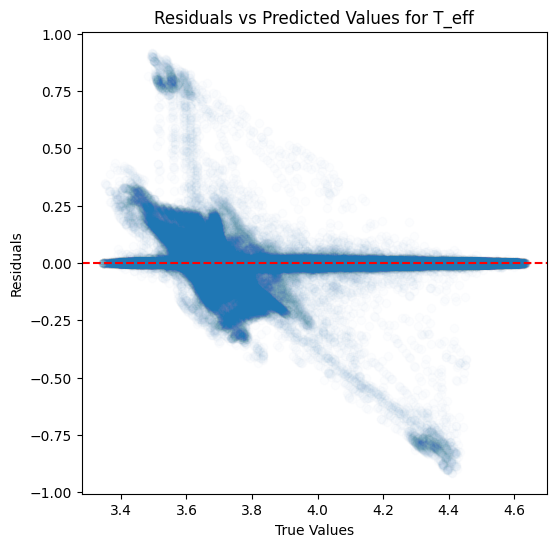

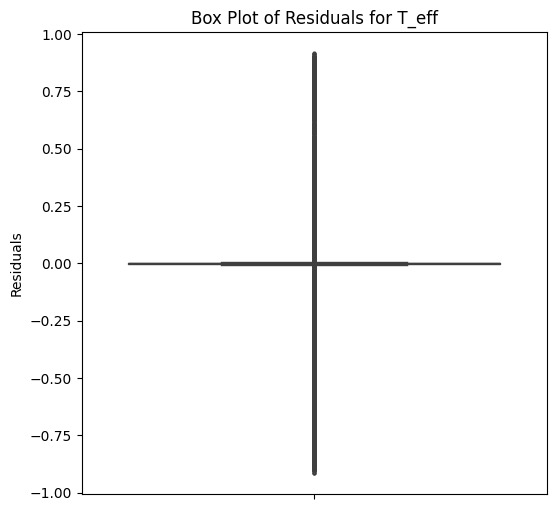

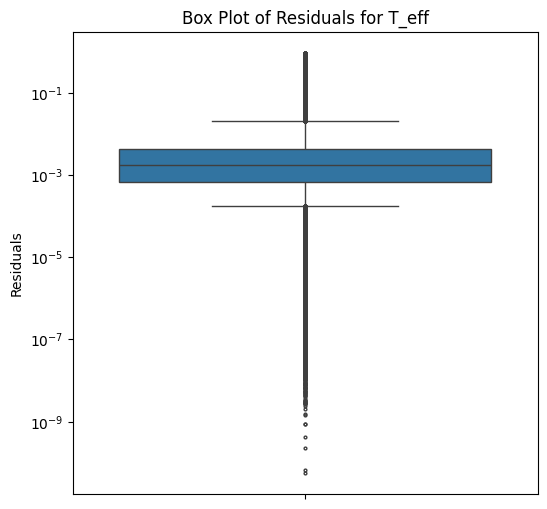

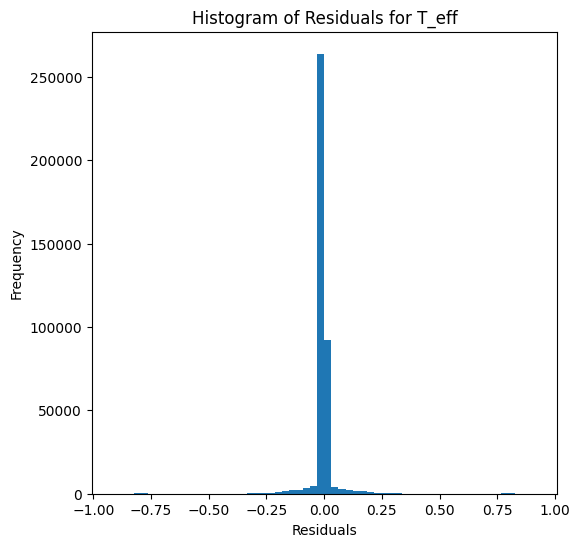

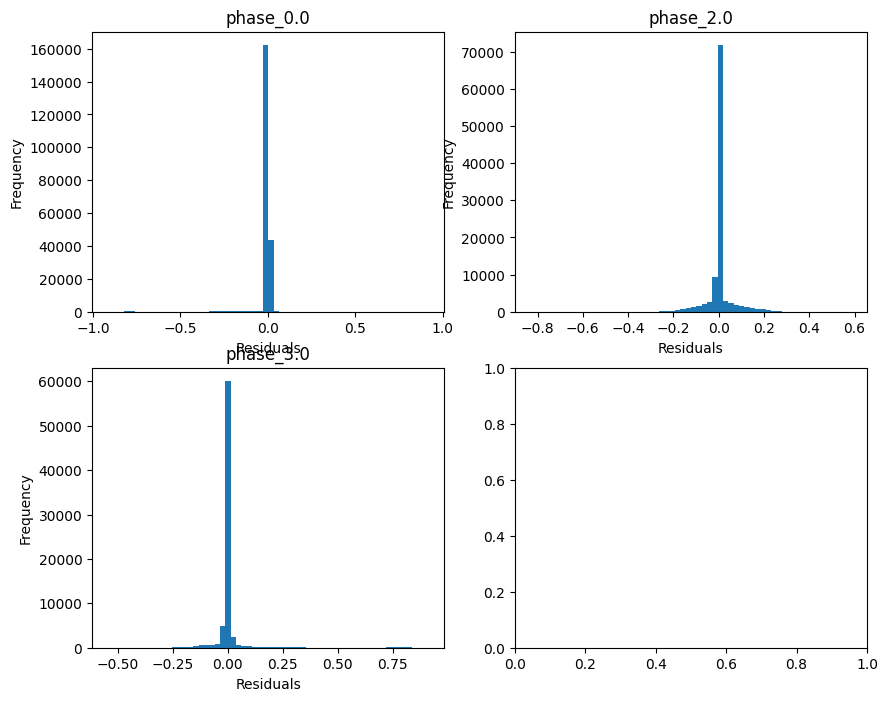

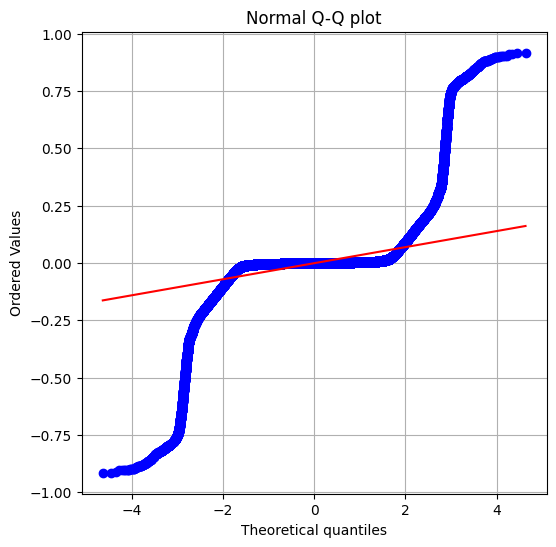

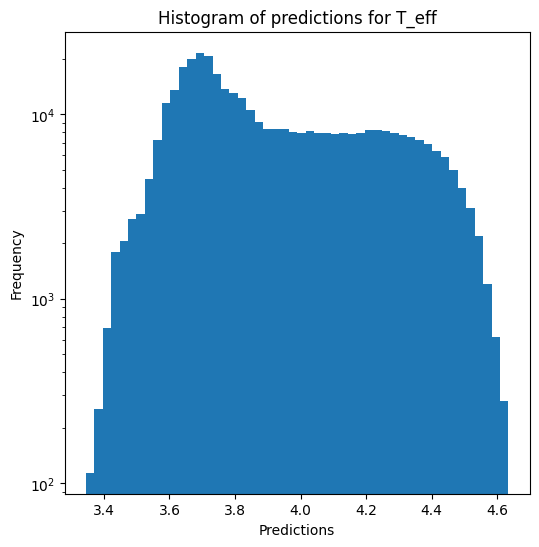

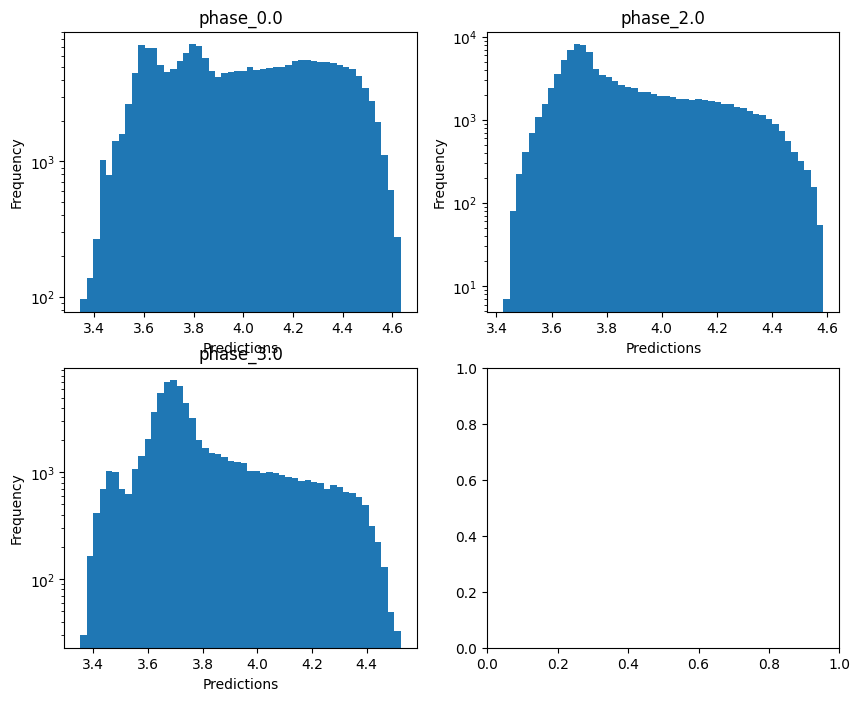


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.06265875602362425
  RMSE :  0.4442342885309716
  MAE :  0.05947586111181425
  MedAE :  0.0036250728756606065
  CORR :  0.7395727638559106
  MAX_ER :  5.693303843114662
  Percentiles : 
    75th percentile :  0.0072181956688712745
    90th percentile :  0.012540957942496617
    95th percentile :  0.021212698567306783
    99th percentile :  3.169912682537005

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.03416274894127236
  RMSE :  0.943606134345276
  MAE :  0.4190502422606607
  MedAE :  0.0182822568121066
  CORR :  0.48053981548538843
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.24482457986602257
    90th percentile :  1.7519915970101299
    95th percentile :  2.525716655151933
    99th percentile :  3.541556862920444

log_g results for the phase category w

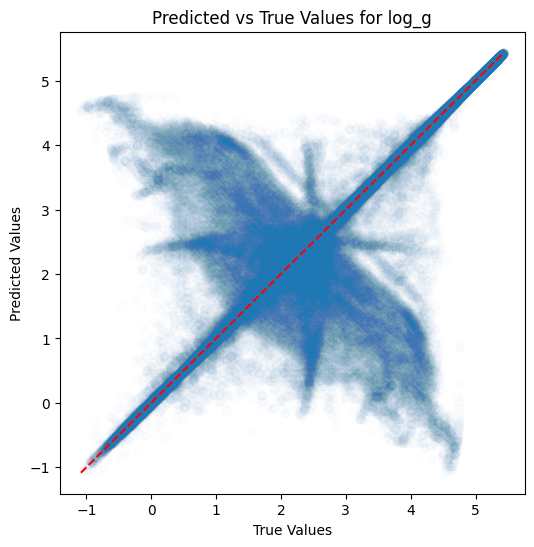

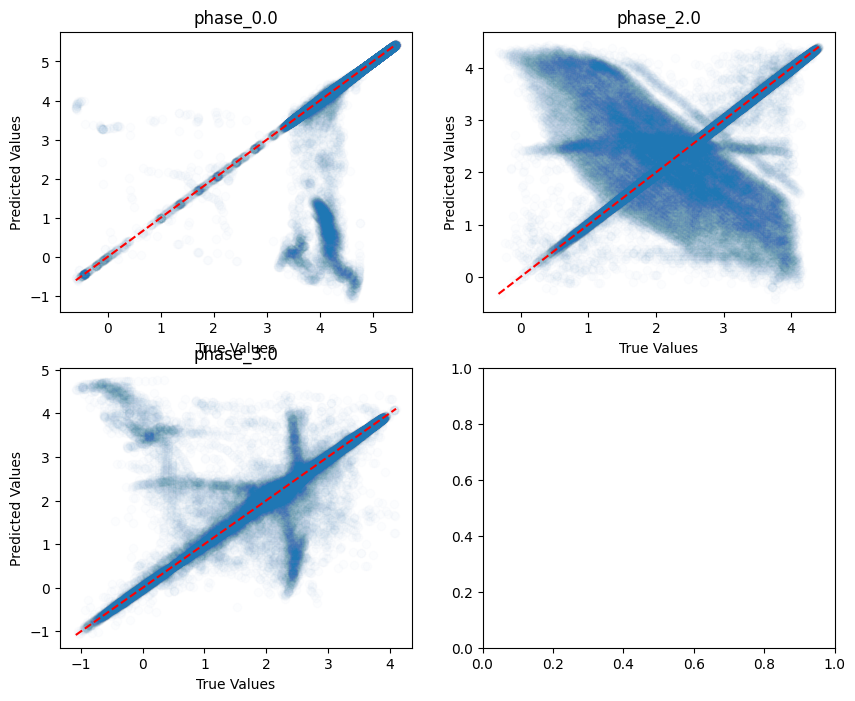

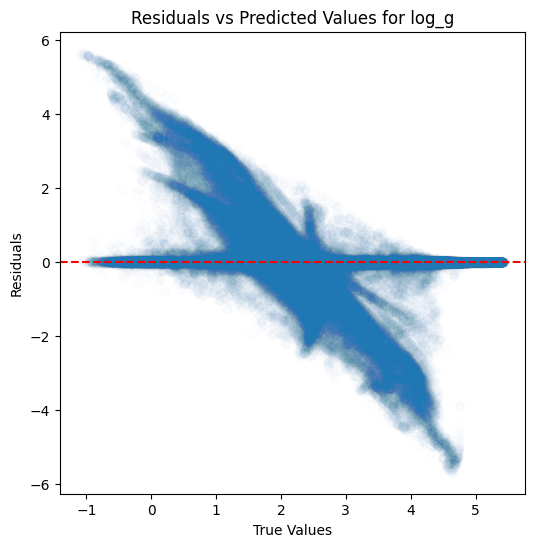

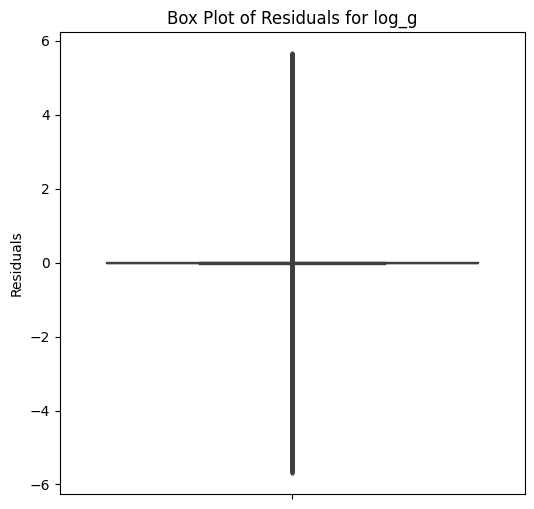

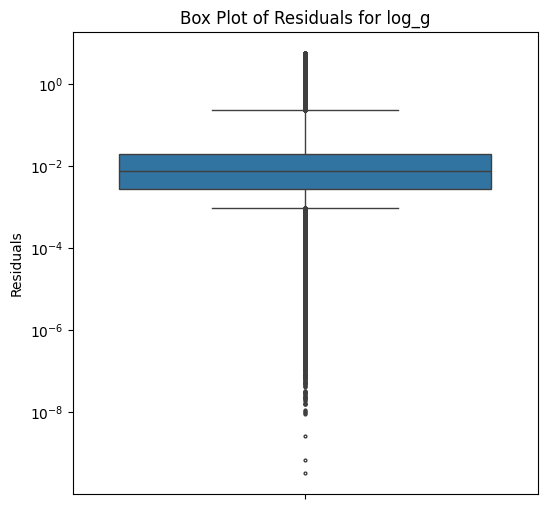

...

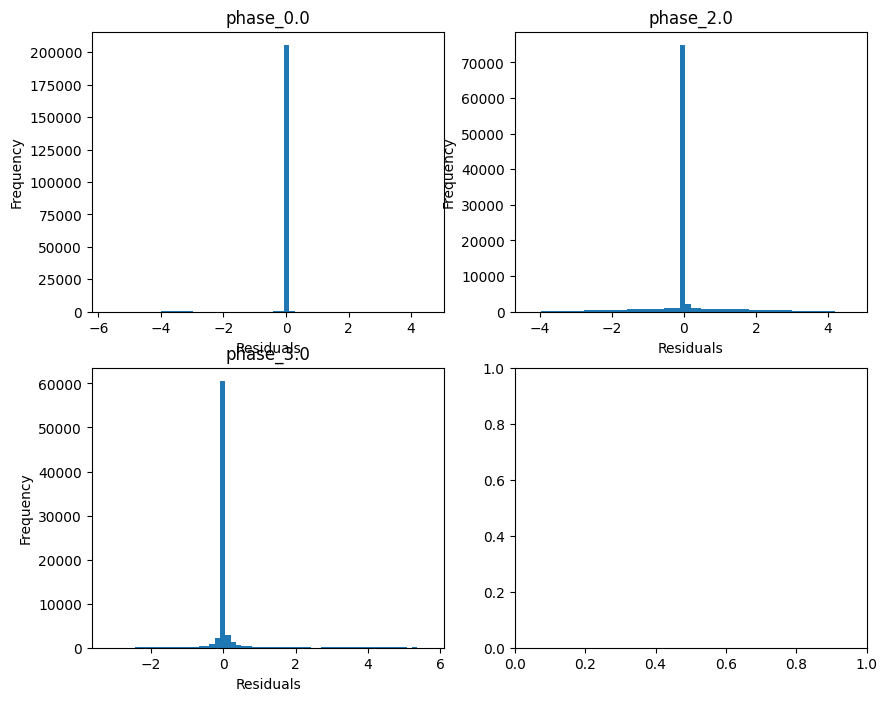

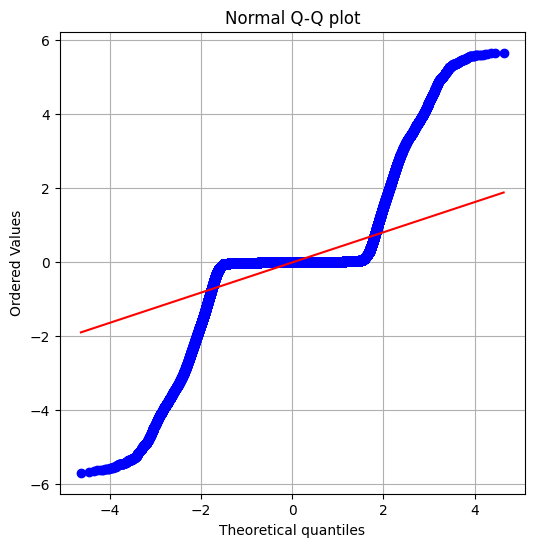

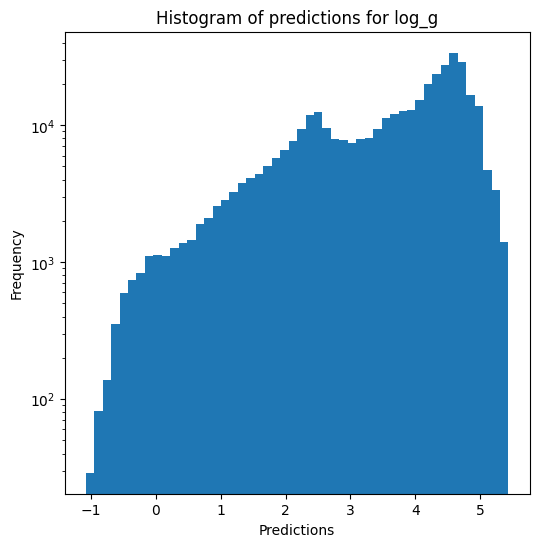

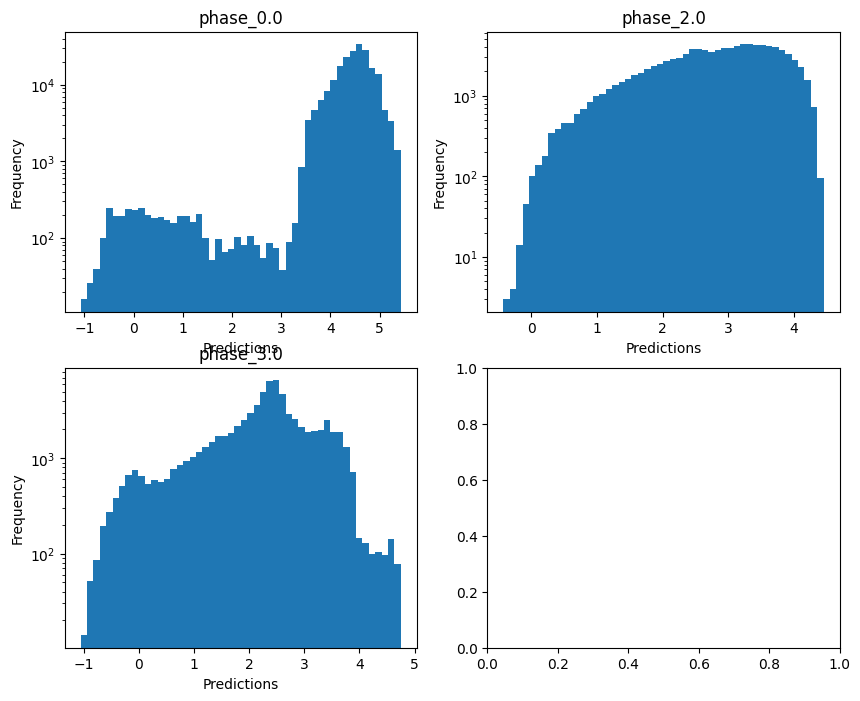

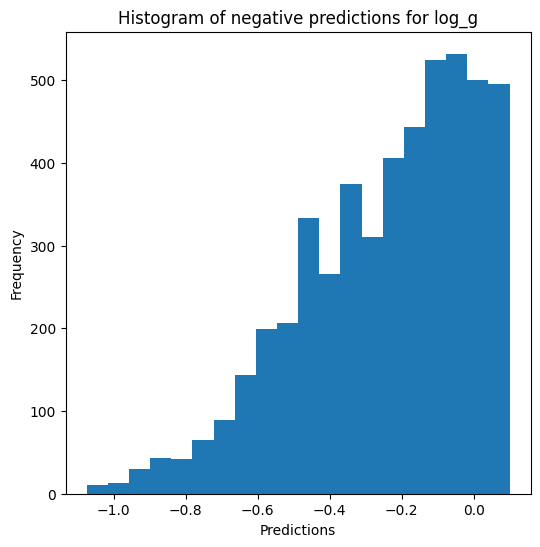


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7255763202960319
  RMSE :  0.2221465239410094
  MAE :  0.030445541781551008
  MedAE :  0.0024848066147118986
  CORR :  0.8876920606645436
  MAX_ER :  2.84673517851732
  Percentiles : 
    75th percentile :  0.004662554106937389
    90th percentile :  0.007972905210513003
    95th percentile :  0.012263793219443996
    99th percentile :  1.5847168265375686

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  -0.027570484542175366
  RMSE :  0.4717923049085102
  MAE :  0.2095318097931198
  MedAE :  0.009154636685064665
  CORR :  0.49855777985109406
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.1224417989566065
    90th percentile :  0.8759794306573212
    95th percentile :  1.2628573223222421
    99th percentile :  1.770740373407309

radius results for the phase cate

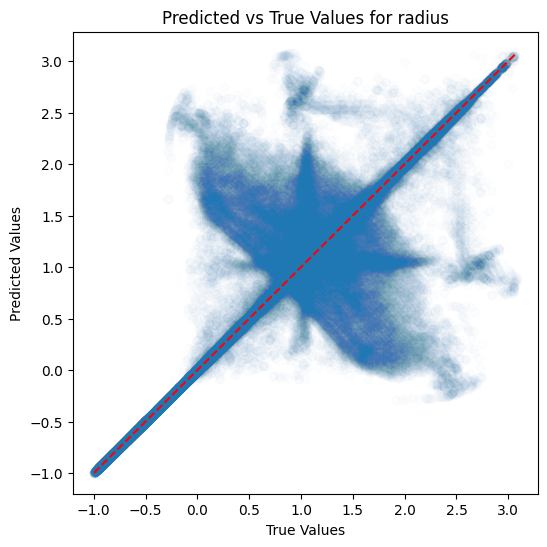

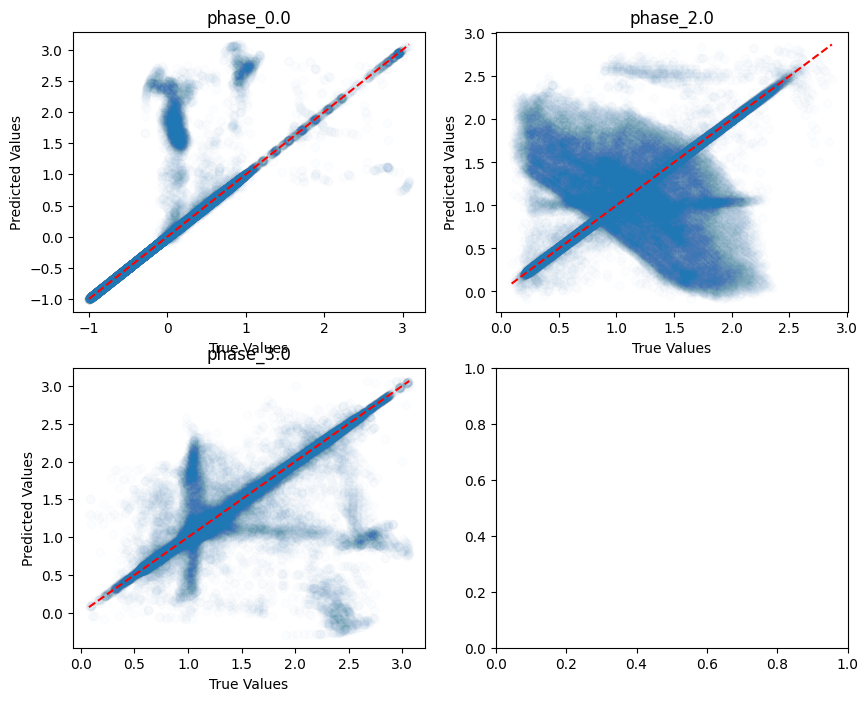

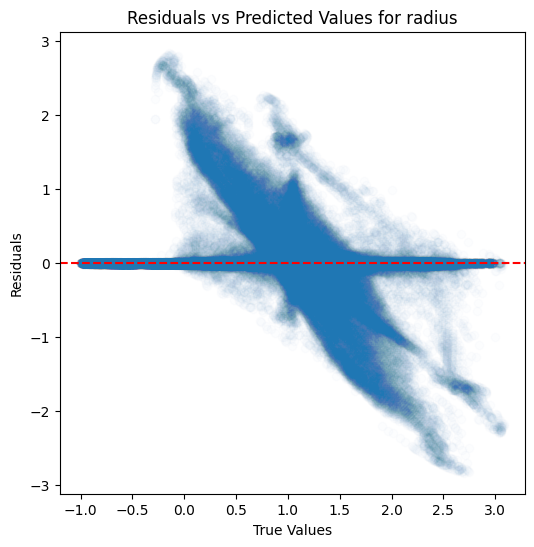

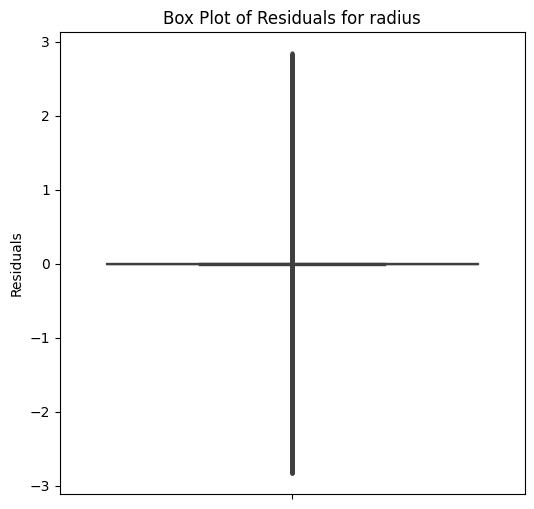

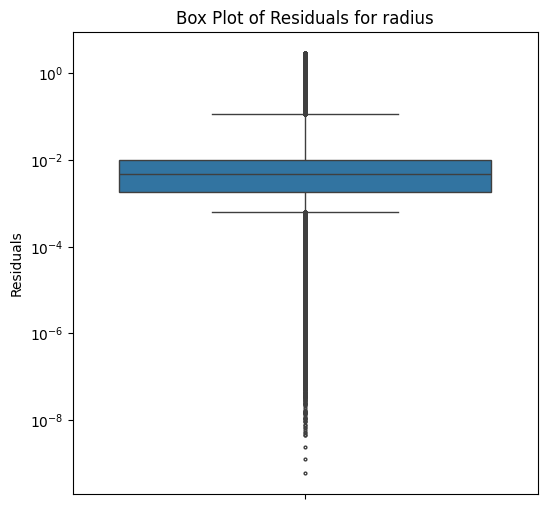

...

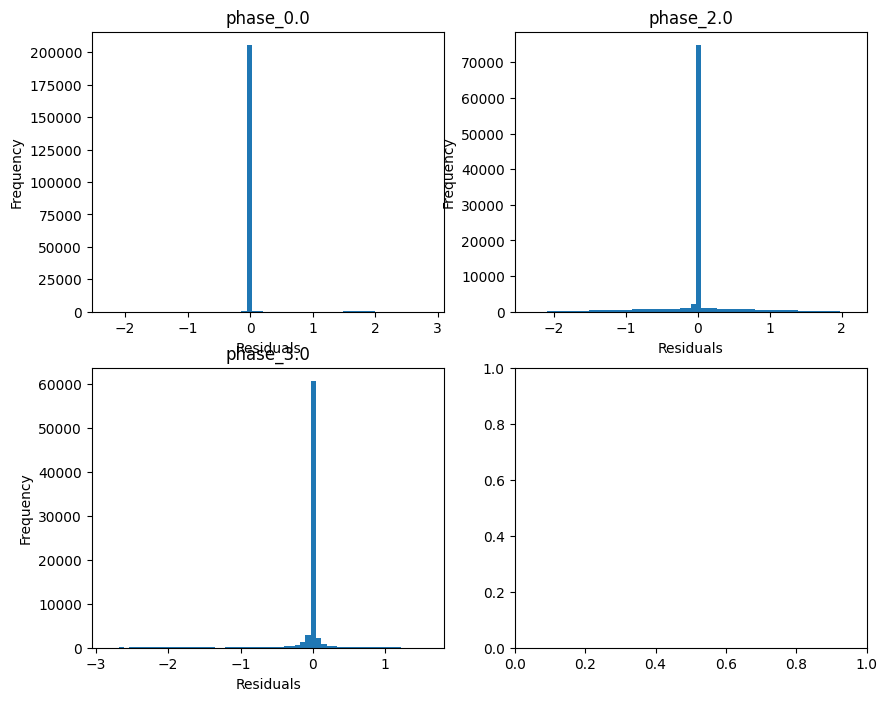

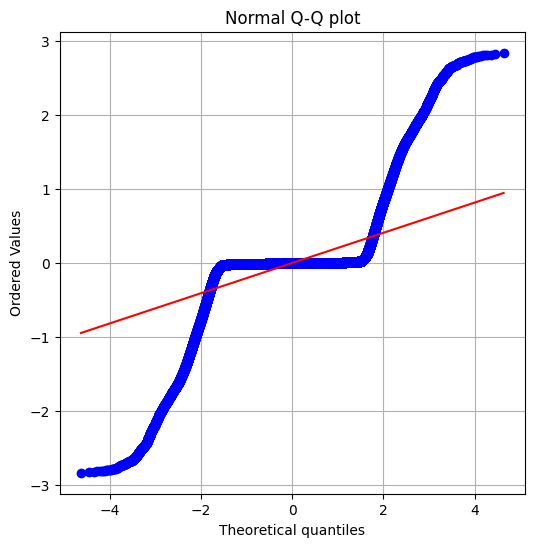

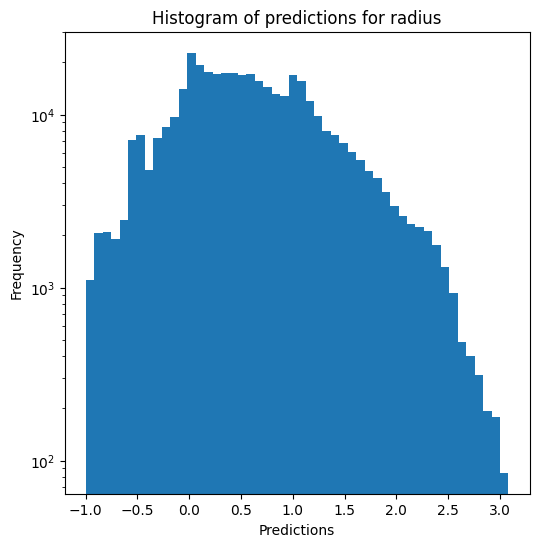

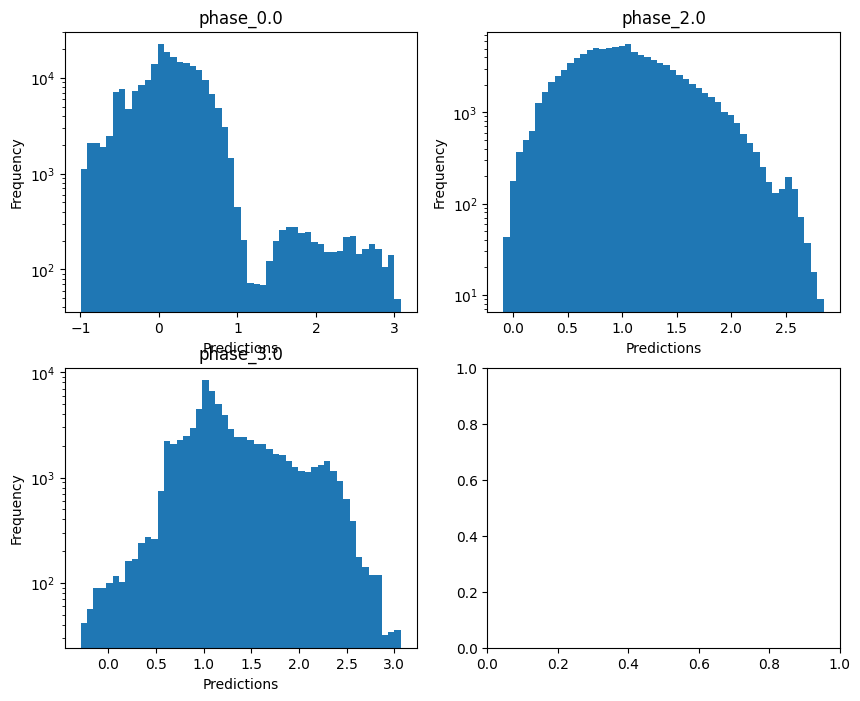

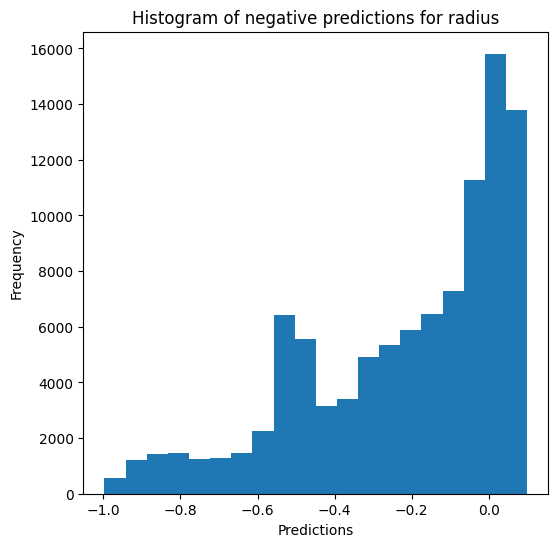

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9852715749955437
  RMSE :  0.03629787659970061
  MAE :  0.005556853938737078
  MedAE :  0.0010661866947105914
  CORR :  0.9926730633282947
  MAX_ER :  0.9159855246266679
  Percentiles : 
    75th percentile :  0.0022552196956353576
    90th percentile :  0.004191651060084212
    95th percentile :  0.006614986105067987
    99th percentile :  0.12031007487042183

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9725064082574403
  RMSE :  0.04073924635548519
  MAE :  0.01831366230424546
  MedAE :  0.002723380142410914
  CORR :  0.9861727539493113
  MAX_ER :  0.6260565282565982
  Percentiles : 
    75th percentile :  0.015577207168808838
    90th percentile :  0.06193883

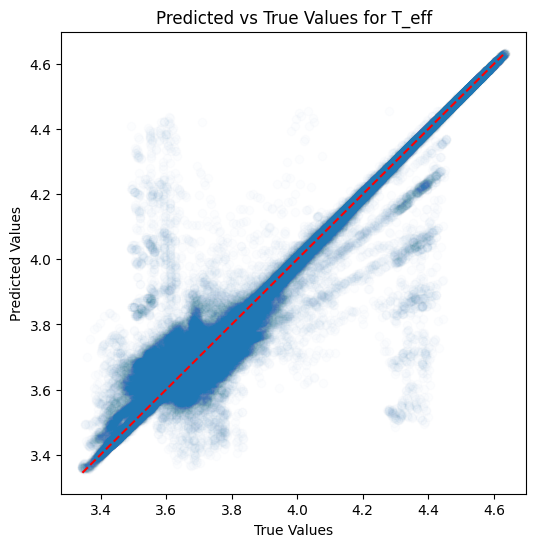

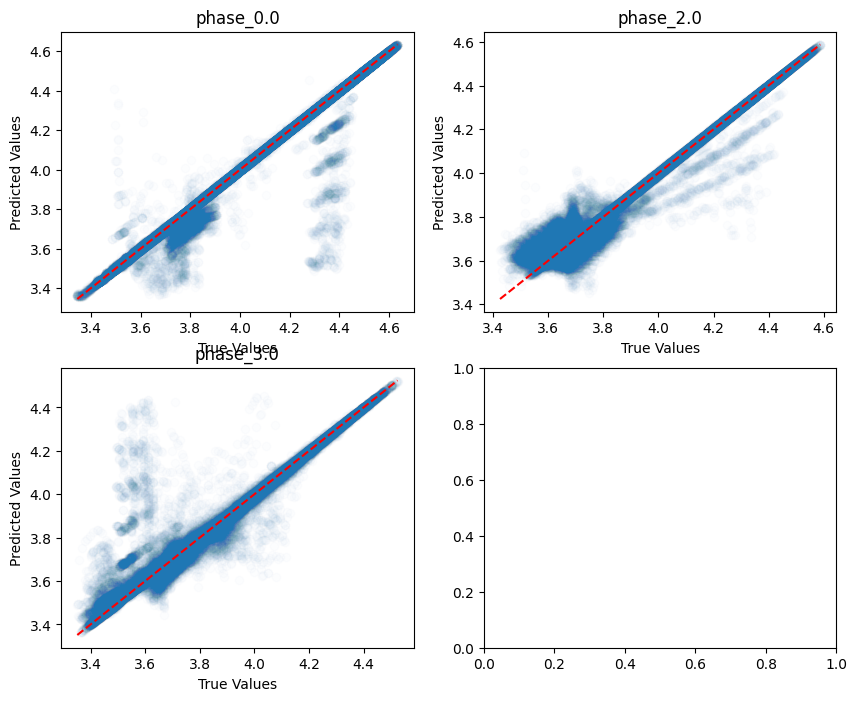

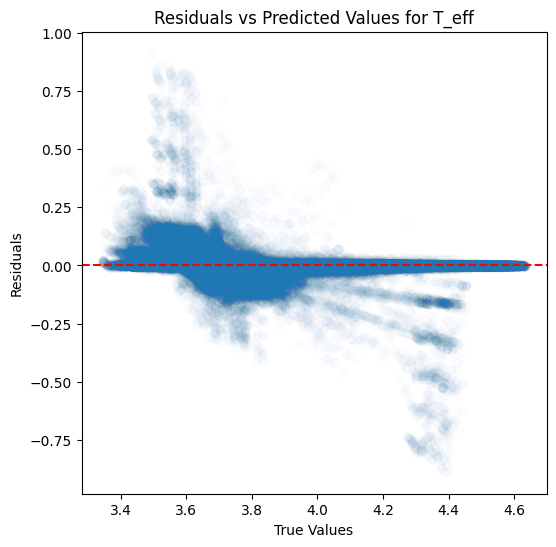

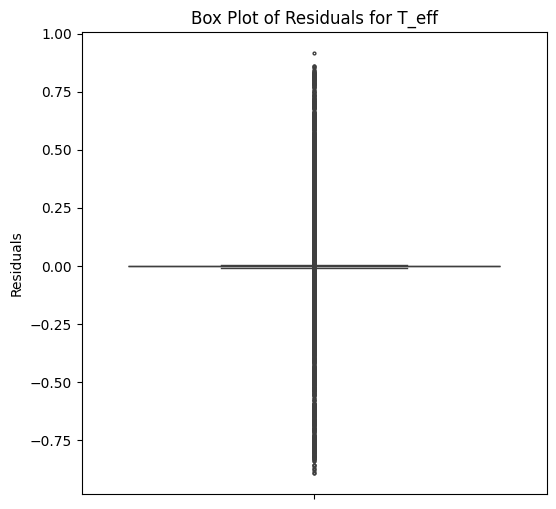

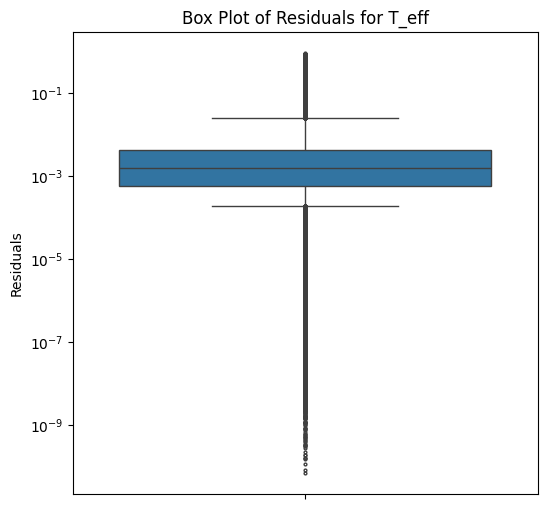

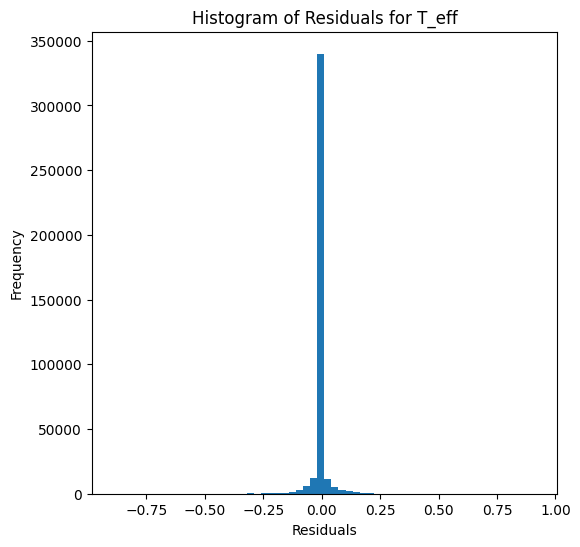

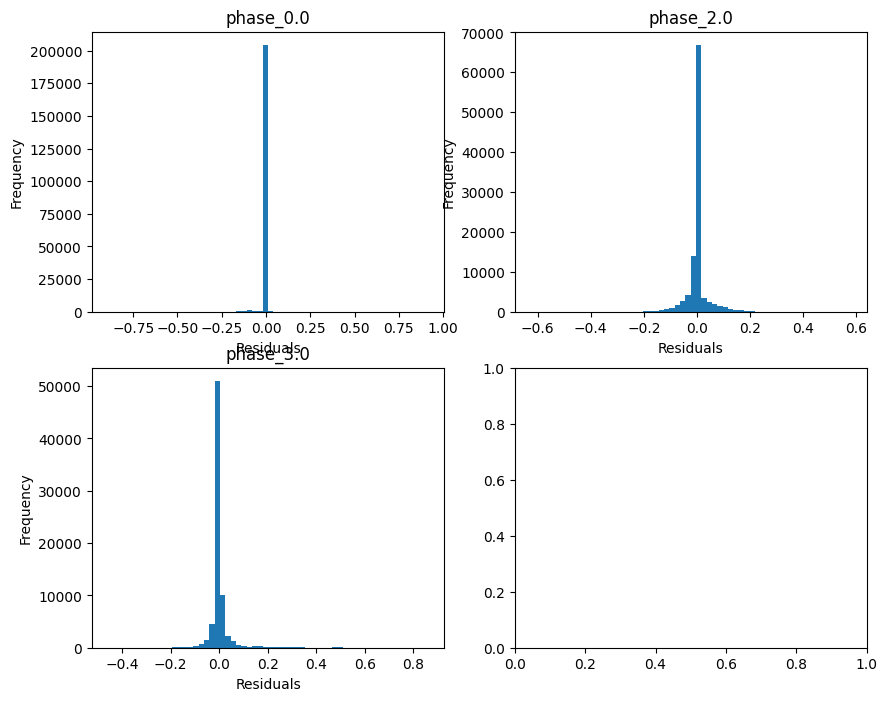

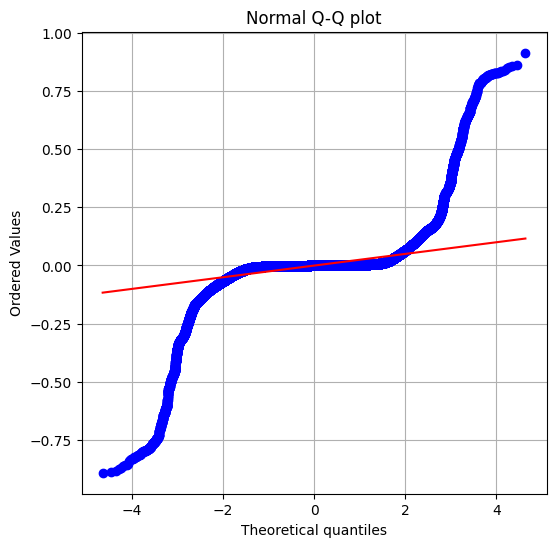

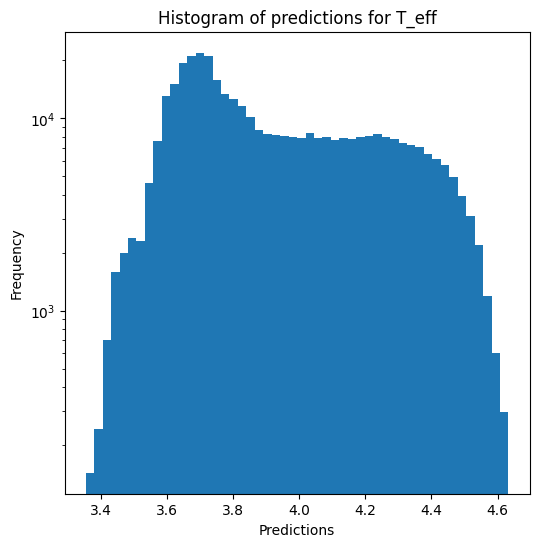

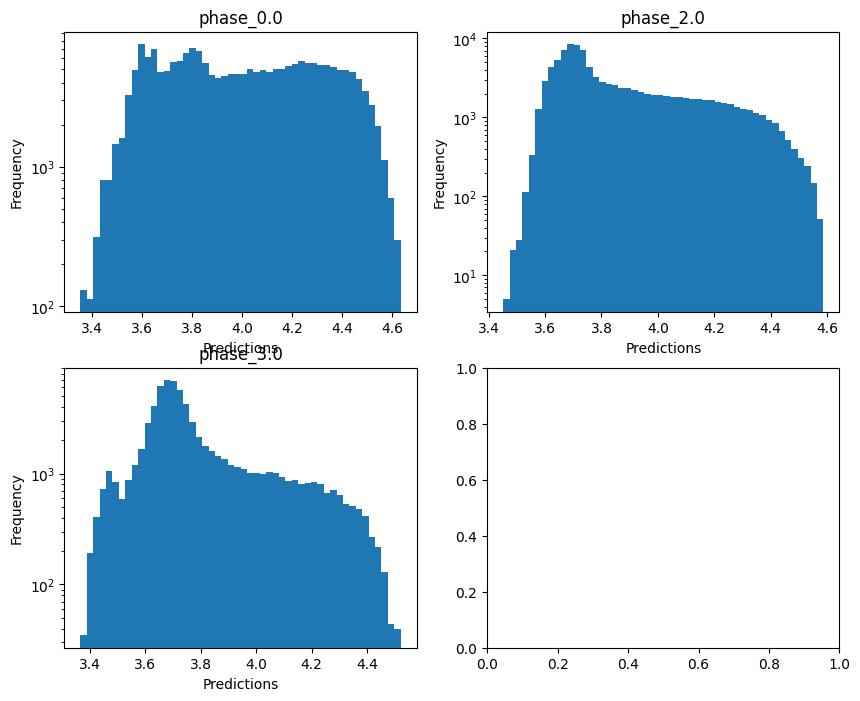


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.5222735355353647
  RMSE :  0.3177077800919606
  MAE :  0.047155192690774395
  MedAE :  0.002574077634212024
  CORR :  0.8359767909428795
  MAX_ER :  5.545795164845766
  Percentiles : 
    75th percentile :  0.0061760334614948675
    90th percentile :  0.013225796382077172
    95th percentile :  0.021628282664161523
    99th percentile :  1.730503958985545

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5318308983356431
  RMSE :  0.6352055672545351
  MAE :  0.29374778469174356
  MedAE :  0.013567774822483614
  CORR :  0.7358724921375431
  MAX_ER :  4.330710890208363
  Percentiles : 
    75th percentile :  0.3129302596942062
    90th percentile :  1.1243323389652884
    95th percentile :  1.5886812146561942
    99th percentile :  2.4041000891038555

log_g results for the phase category 

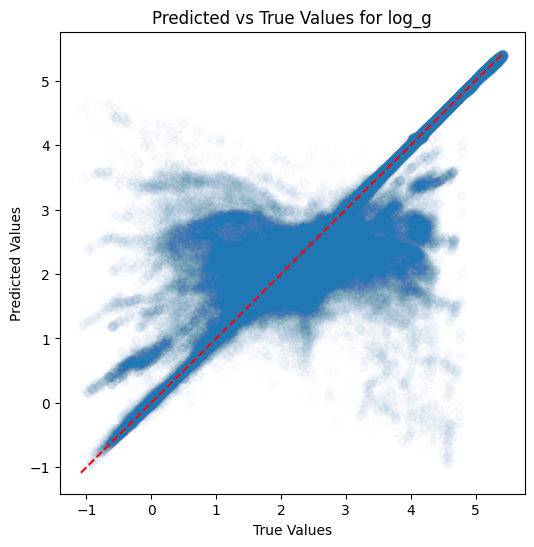

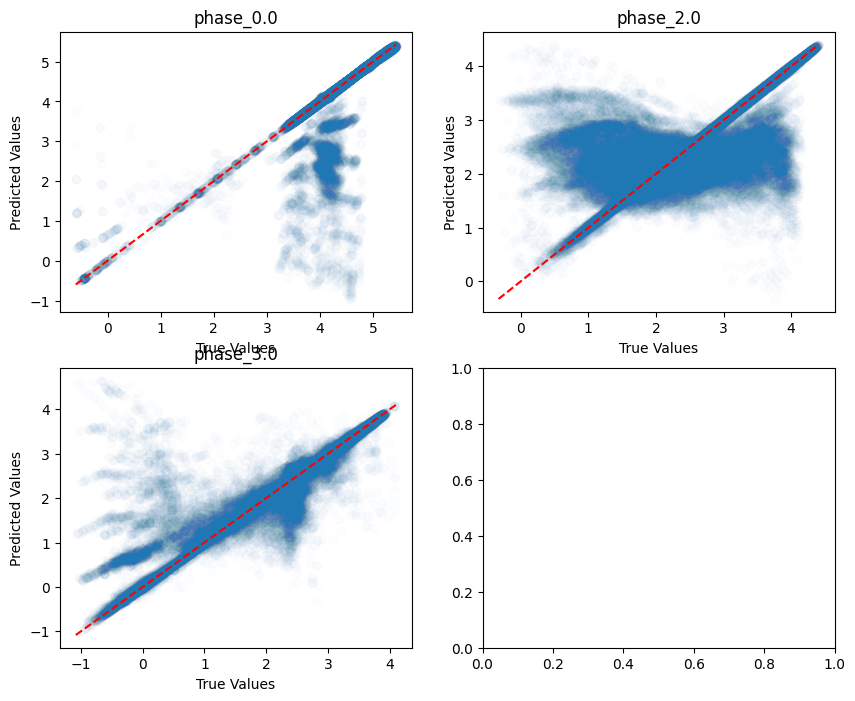

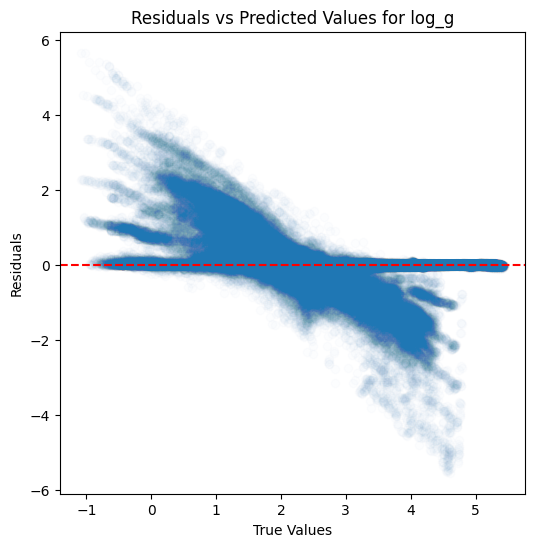

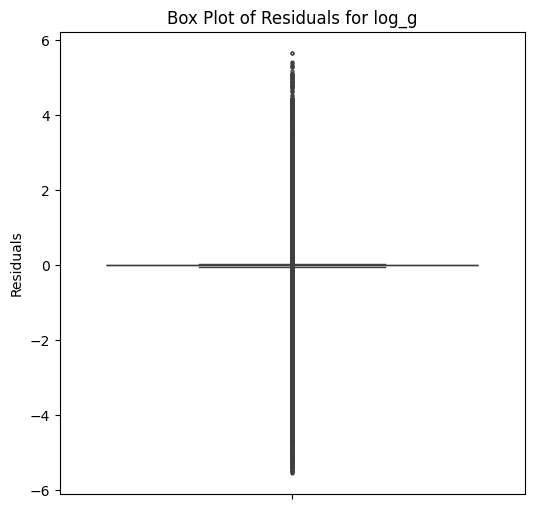

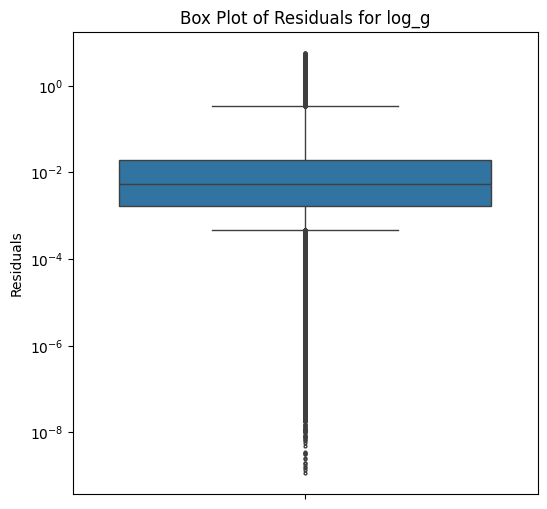

...

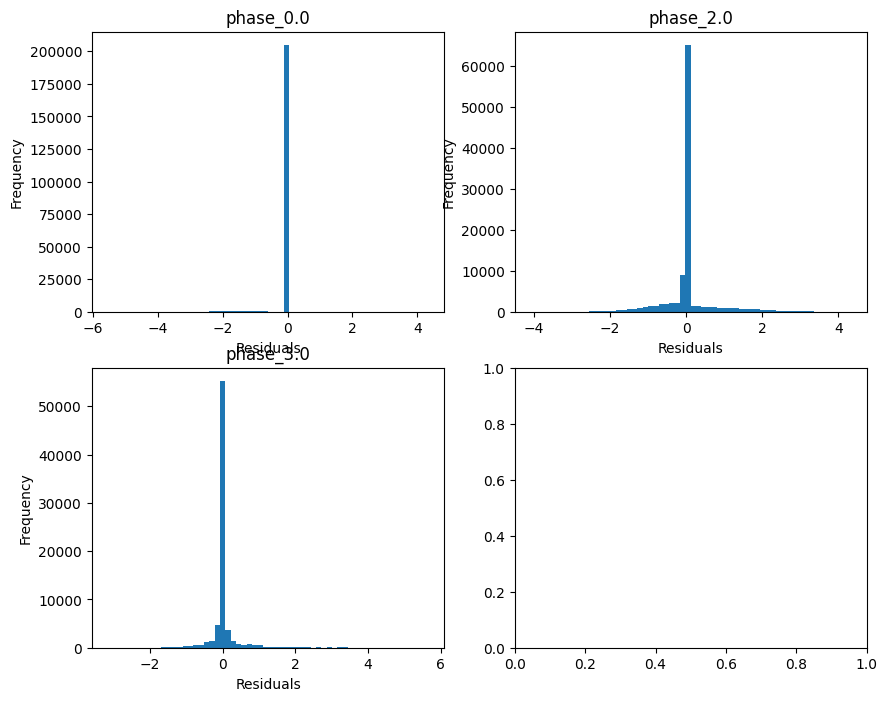

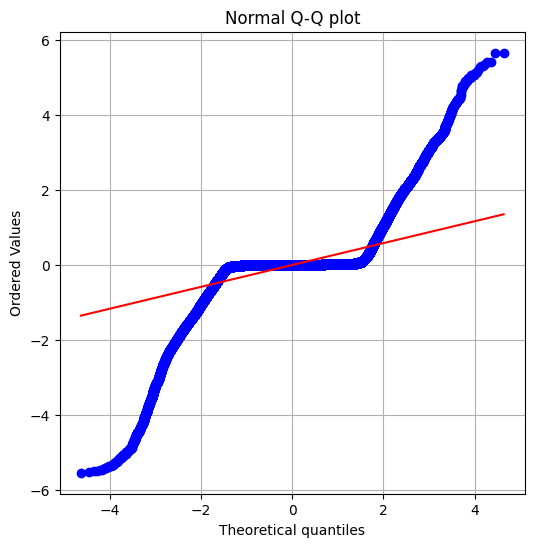

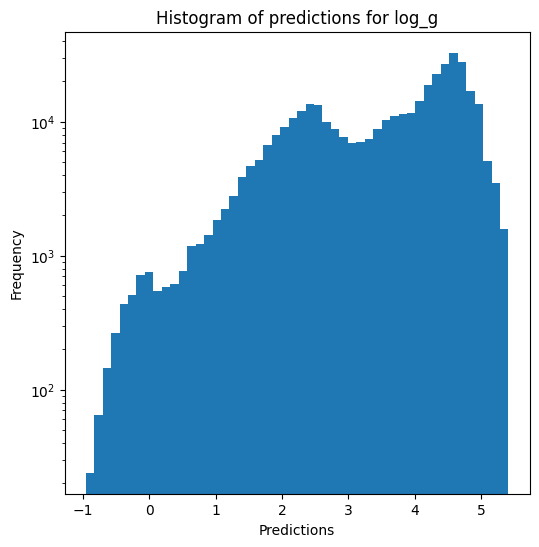

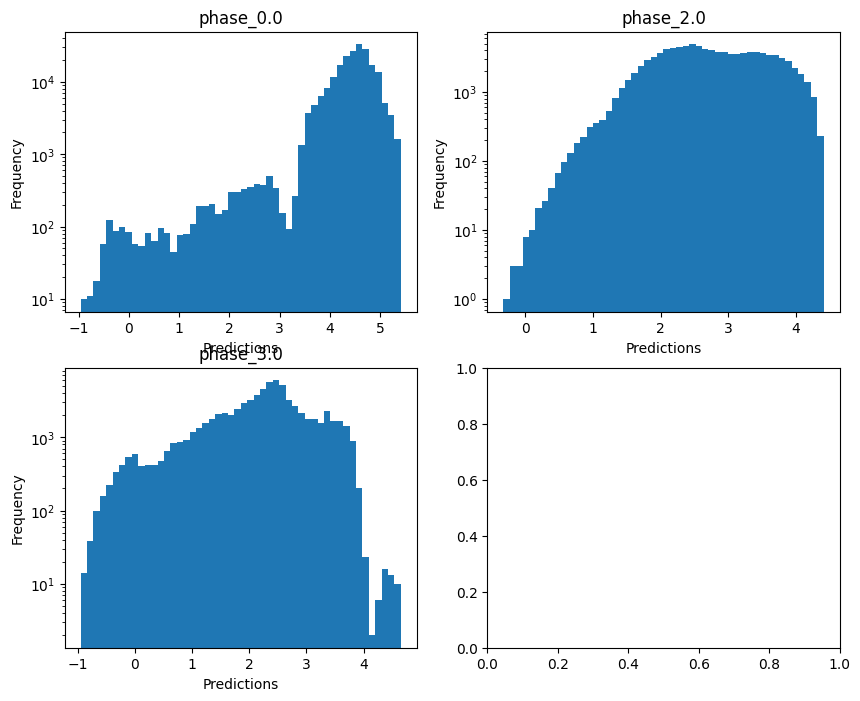

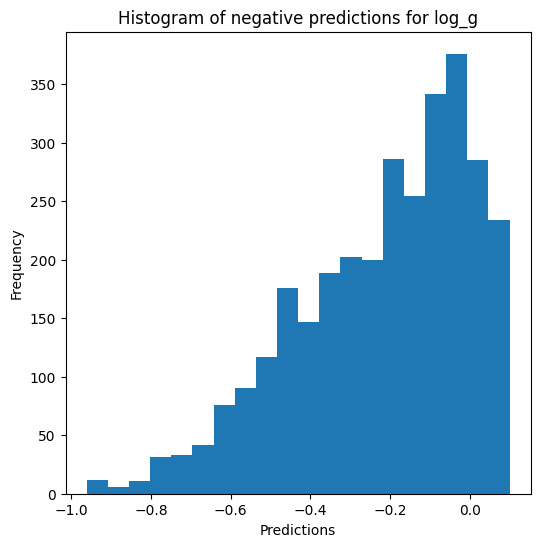


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8600006075700658
  RMSE :  0.15895590390904094
  MAE :  0.02497409885075361
  MedAE :  0.002160323950113119
  CORR :  0.9374996835334473
  MAX_ER :  2.774405485576776
  Percentiles : 
    75th percentile :  0.004706367571592707
    90th percentile :  0.009825316198206483
    95th percentile :  0.017618470155200593
    99th percentile :  0.8652321683067176

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.5348114775081061
  RMSE :  0.31759671298442754
  MAE :  0.146879377622816
  MedAE :  0.00679480520566228
  CORR :  0.7414613019494652
  MAX_ER :  2.16546836611197
  Percentiles : 
    75th percentile :  0.15646983275236662
    90th percentile :  0.5621616115659489
    95th percentile :  0.7942520372365567
    99th percentile :  1.2021457932162363

radius results for the phase category 

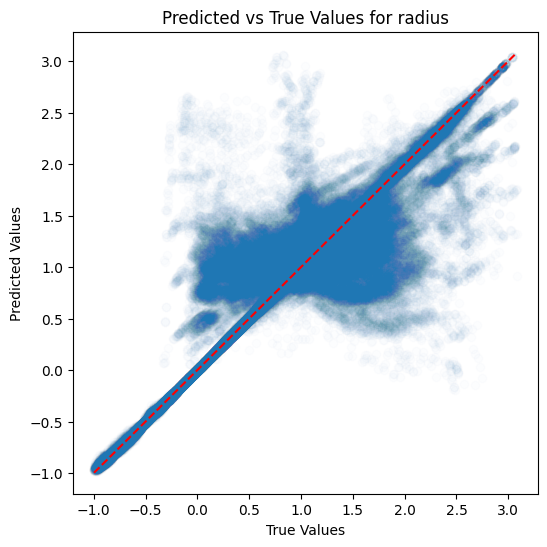

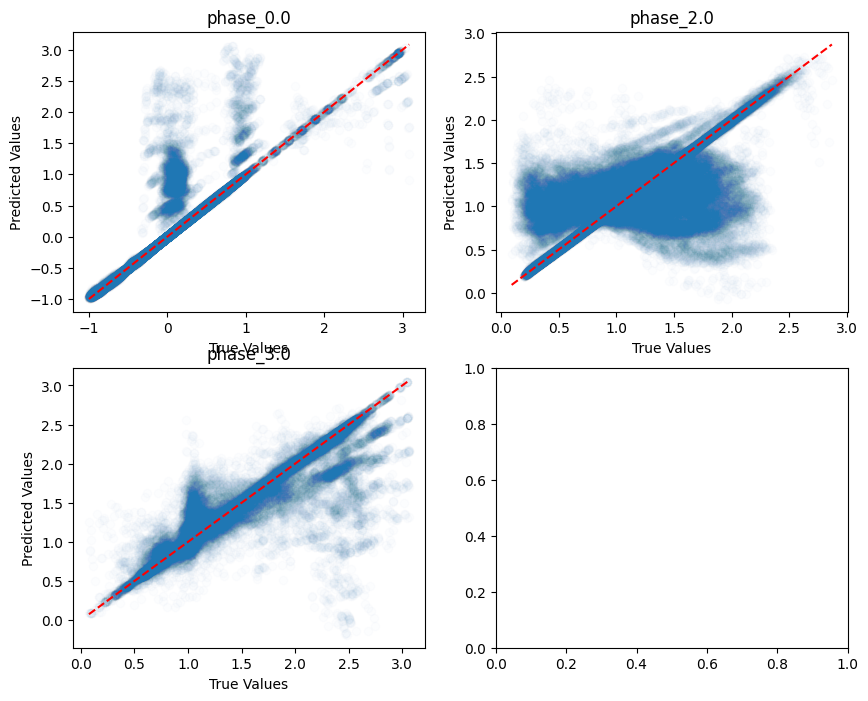

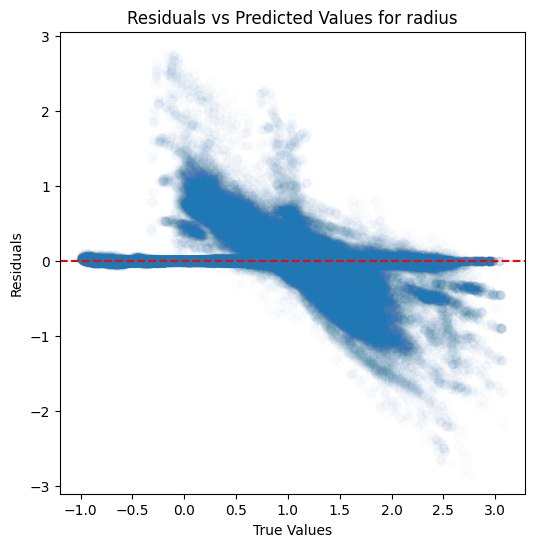

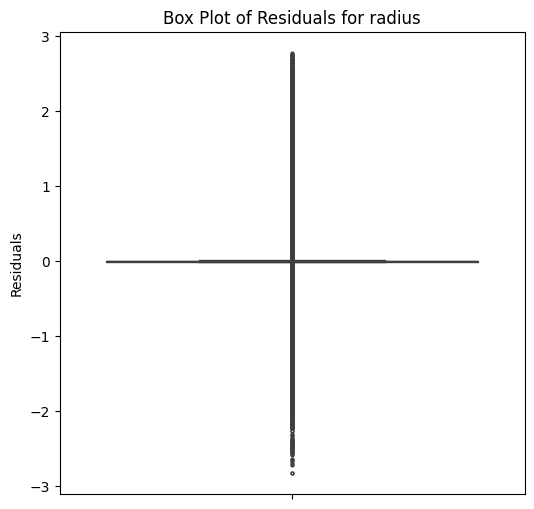

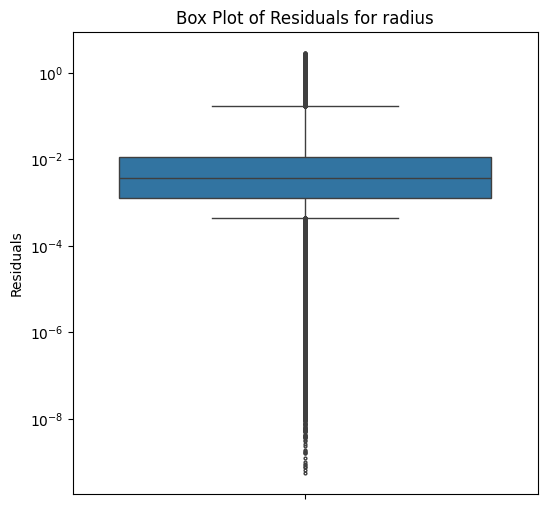

...

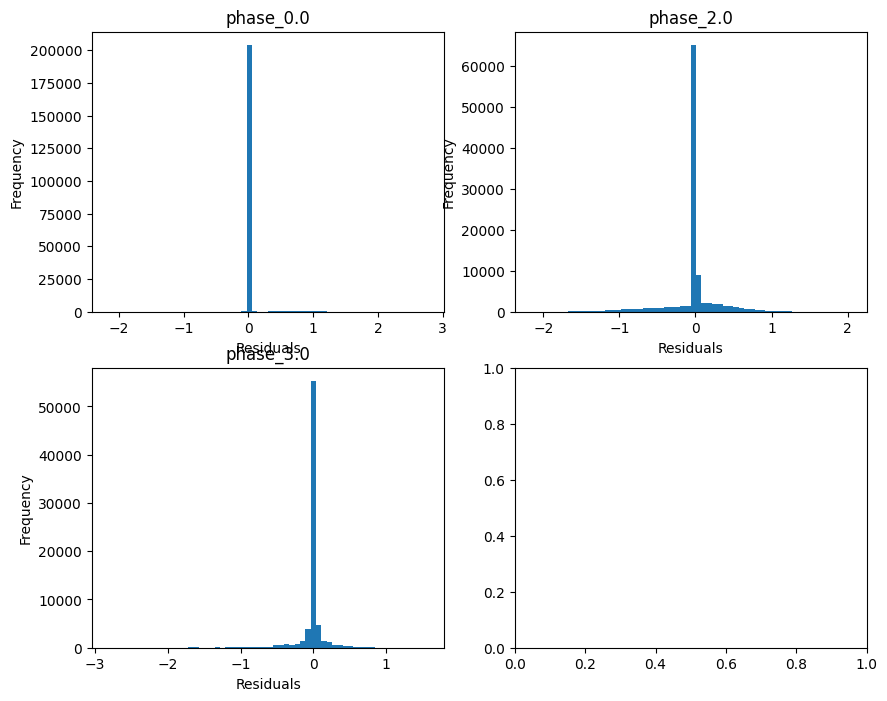

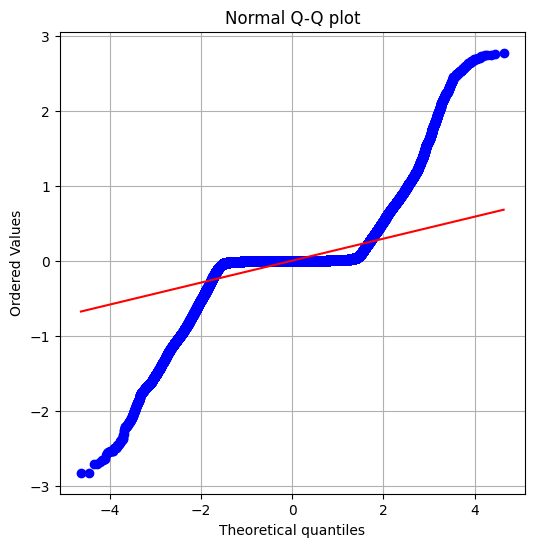

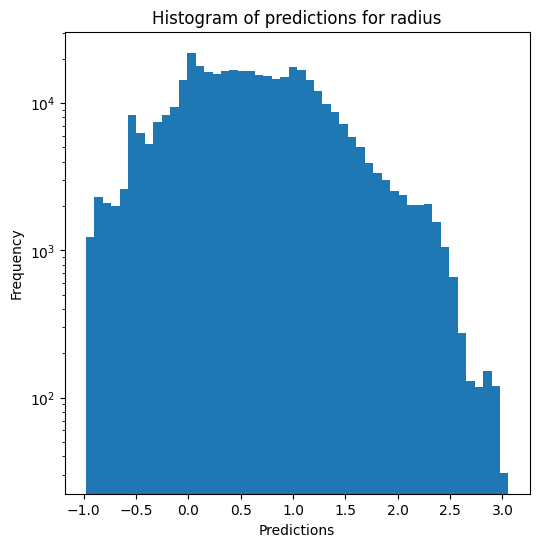

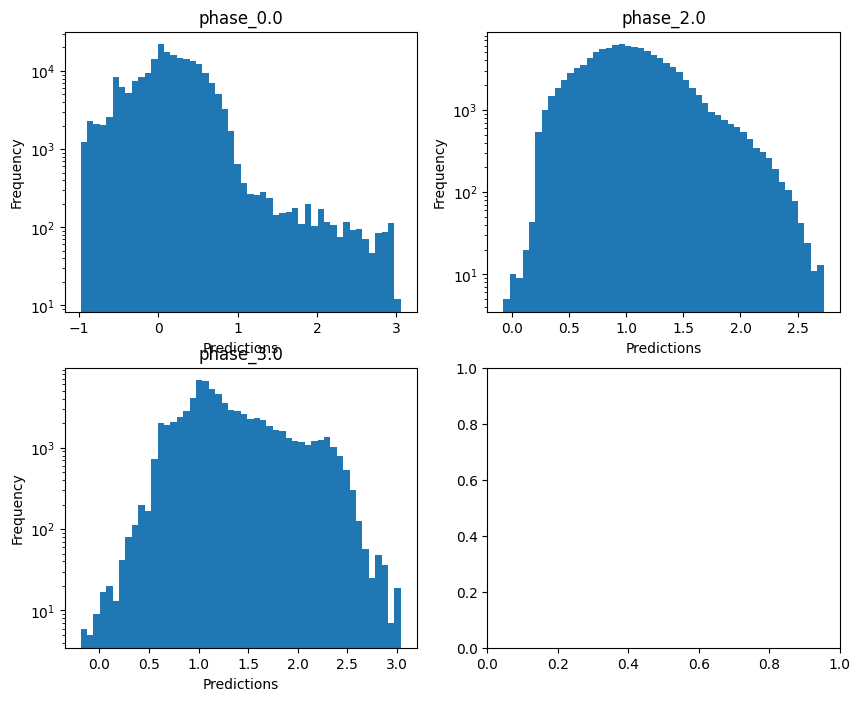

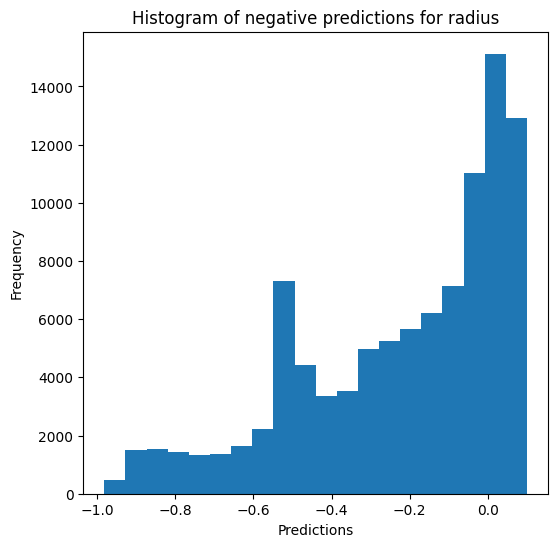

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9813577369759451
  RMSE :  0.040889282455855526
  MAE :  0.005970482313302407
  MedAE :  0.0005490816930451281
  CORR :  0.9907452653073524
  MAX_ER :  0.8872911183715062
  Percentiles : 
    75th percentile :  0.001331953615549164
    90th percentile :  0.0035454664501225266
    95th percentile :  0.00862581678726319
    99th percentile :  0.13927099737694415

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9554939937022018
  RMSE :  0.05182947973093542
  MAE :  0.02223047741543385
  MedAE :  0.002647866911169139
  CORR :  0.977504172160443
  MAX_ER :  0.7394307204422952
  Percentiles : 
    75th percentile :  0.0179597594368488
    90th percentile :  0.07692362418

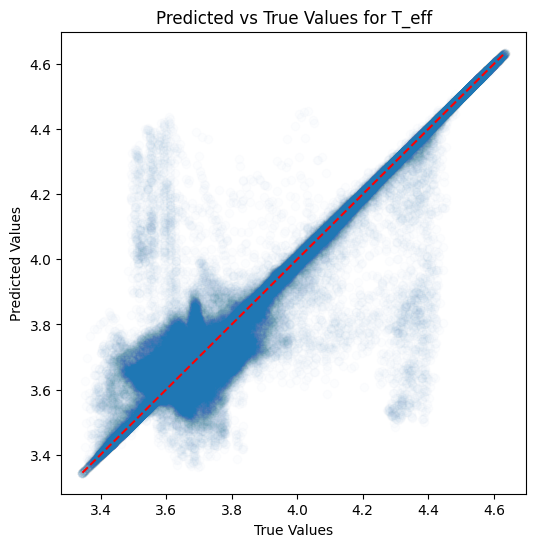

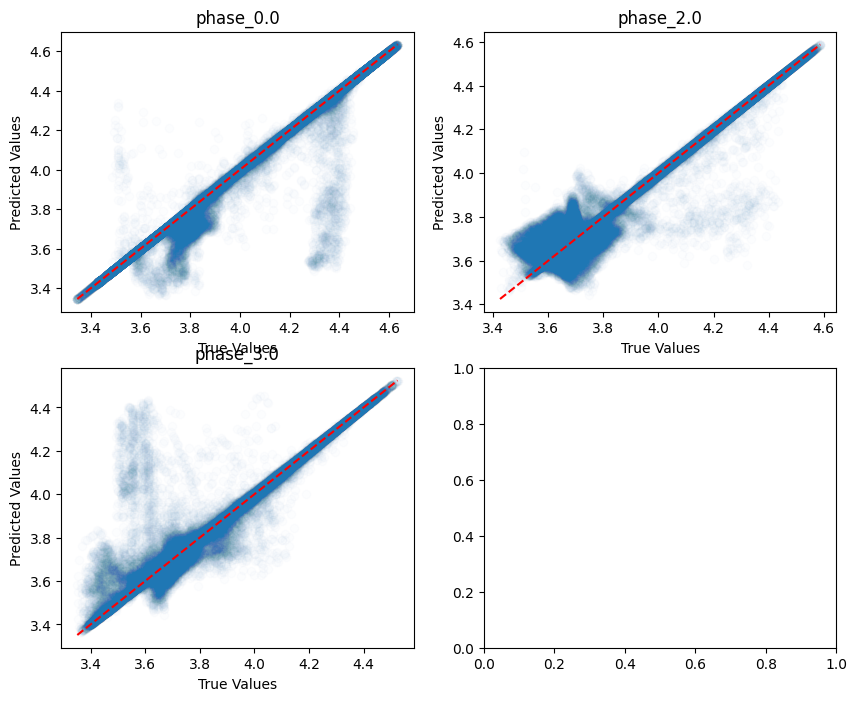

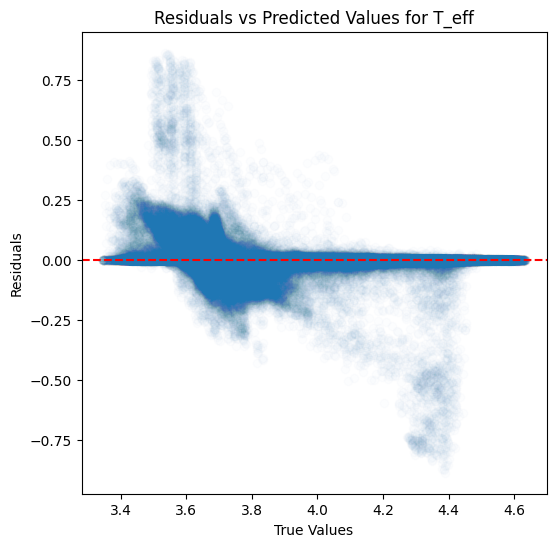

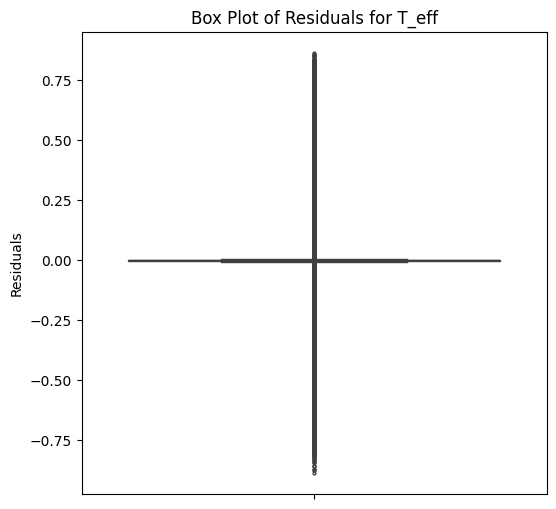

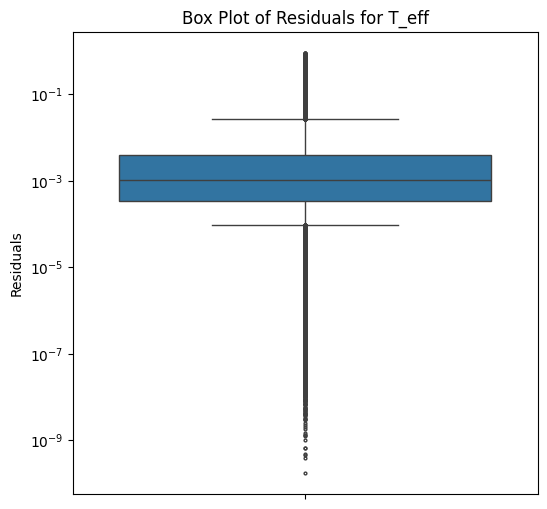

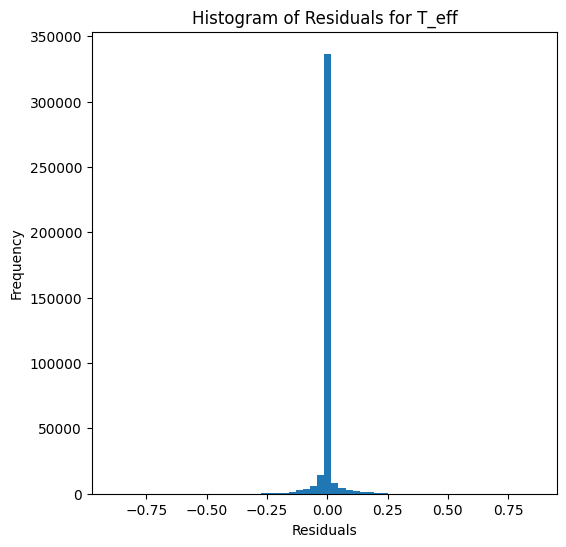

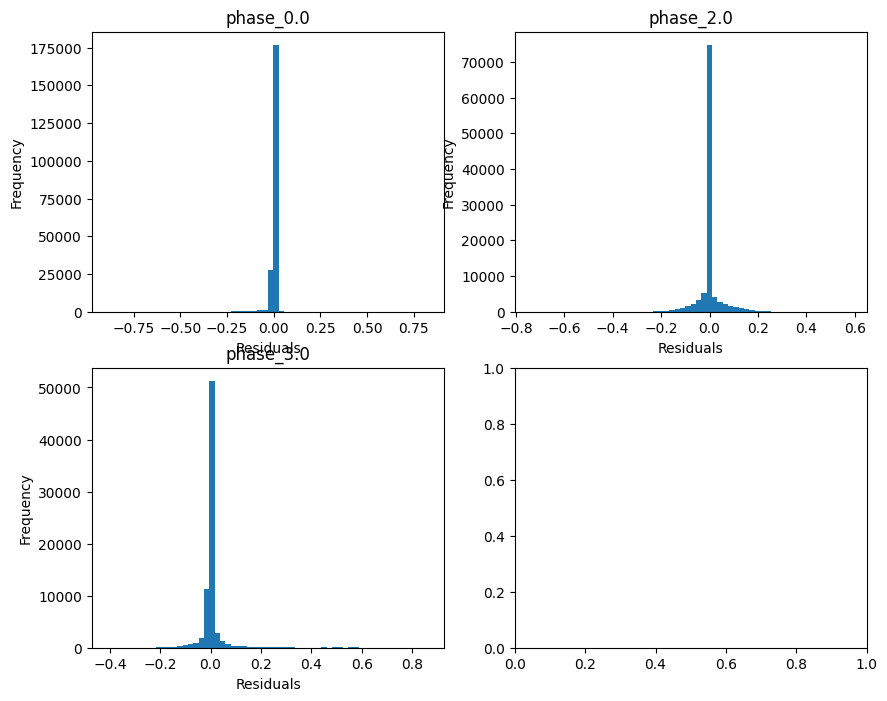

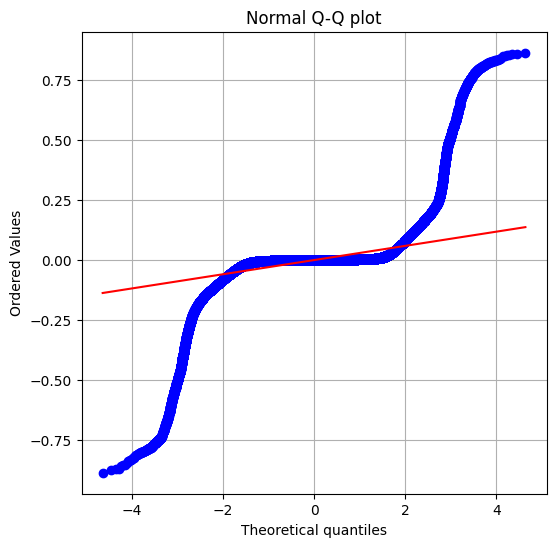

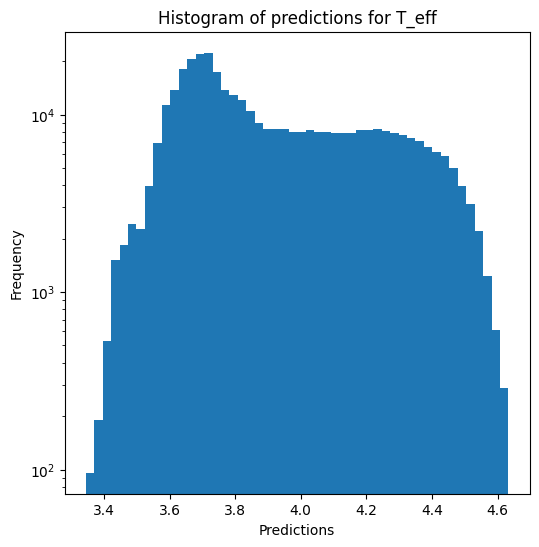

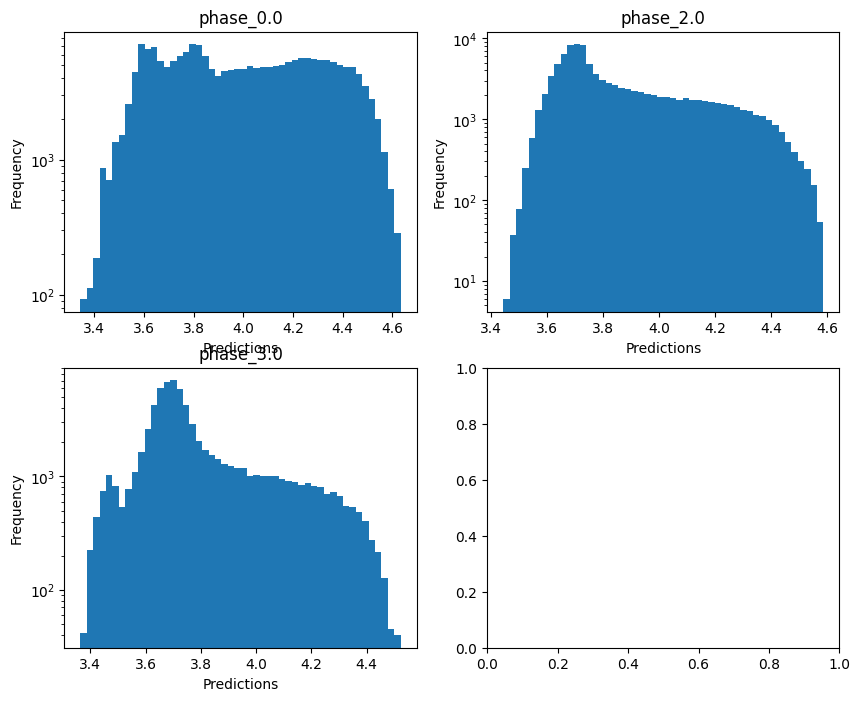


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.4127955331911579
  RMSE :  0.35283242273849663
  MAE :  0.0548625093053549
  MedAE :  0.0015295187159853896
  CORR :  0.8124027927788152
  MAX_ER :  5.570052777422668
  Percentiles : 
    75th percentile :  0.004201486134770782
    90th percentile :  0.012369456194015978
    95th percentile :  0.04548820769698458
    99th percentile :  2.1610669358041177

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.28835925530825324
  RMSE :  0.7830690751323661
  MAE :  0.3591652367997072
  MedAE :  0.013587875125635529
  CORR :  0.6040796753800907
  MAX_ER :  4.497325996238702
  Percentiles : 
    75th percentile :  0.33268542742827745
    90th percentile :  1.428742227603888
    95th percentile :  2.0108357423078824
    99th percentile :  2.9661934943877823

log_g results for the phase category w

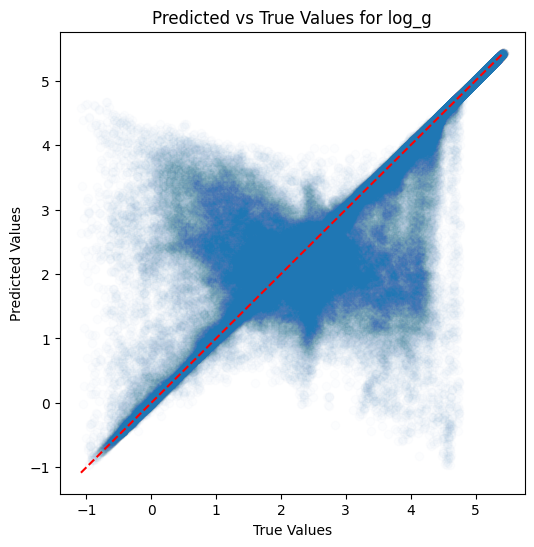

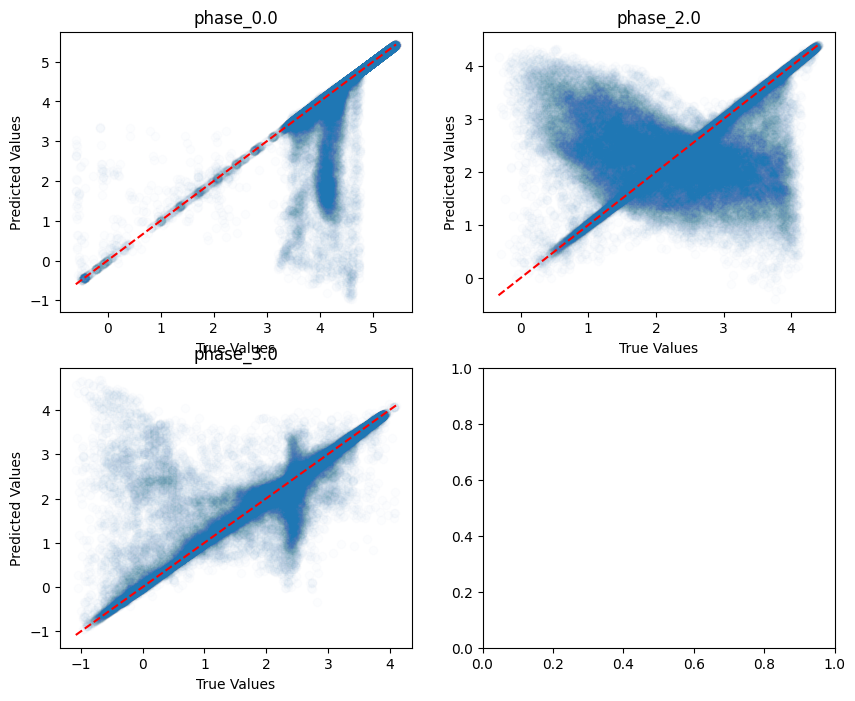

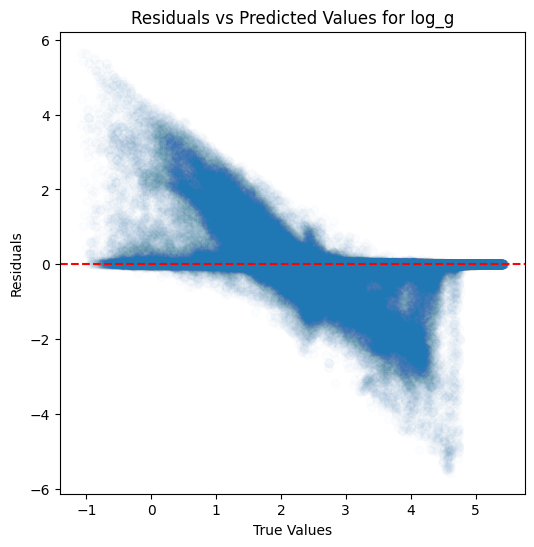

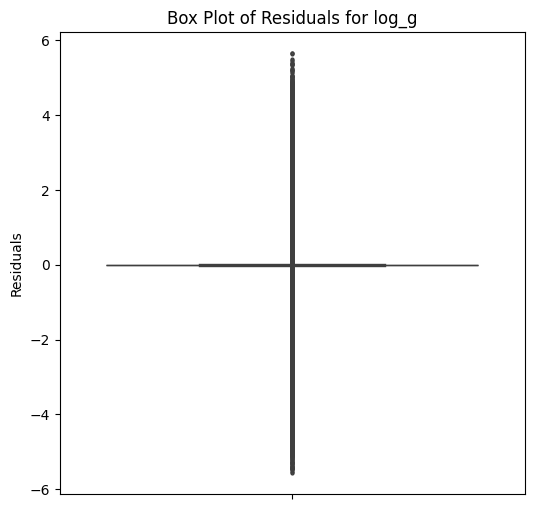

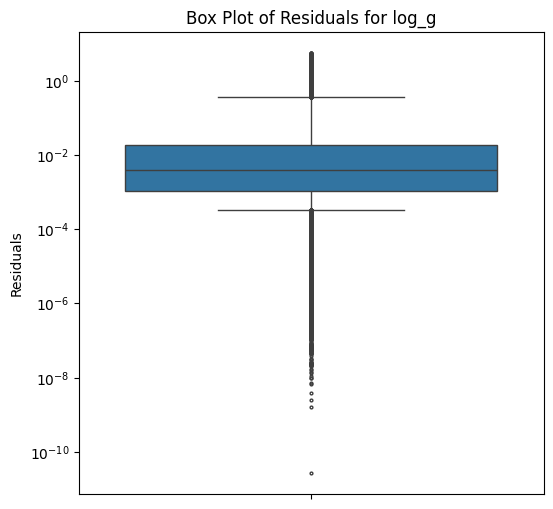

...

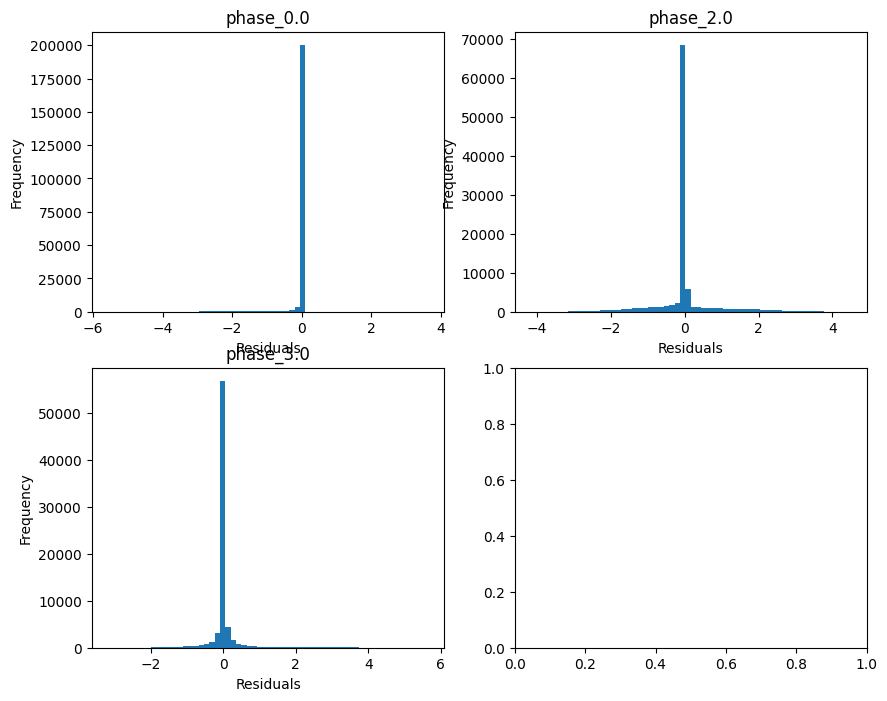

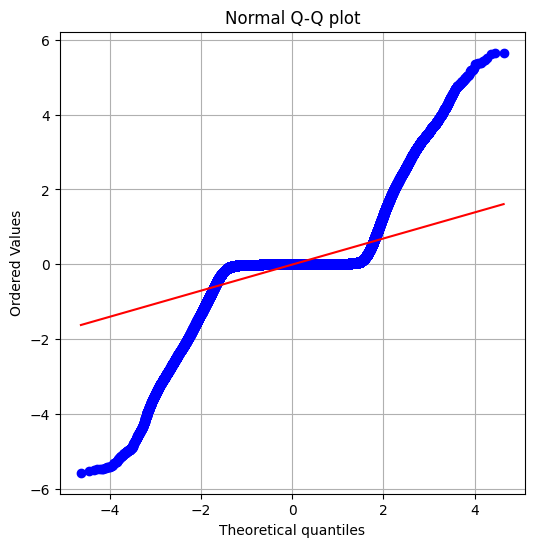

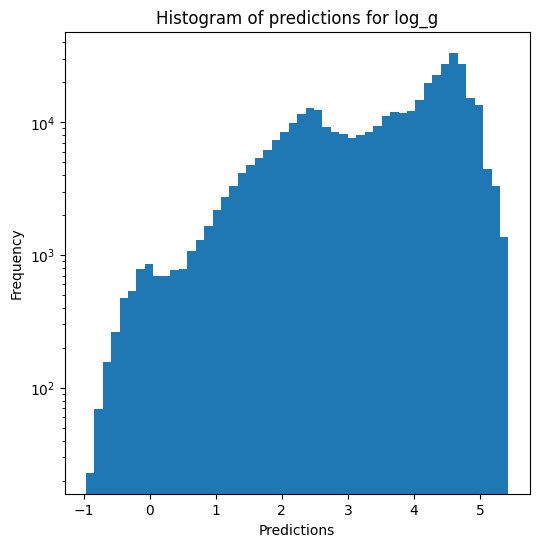

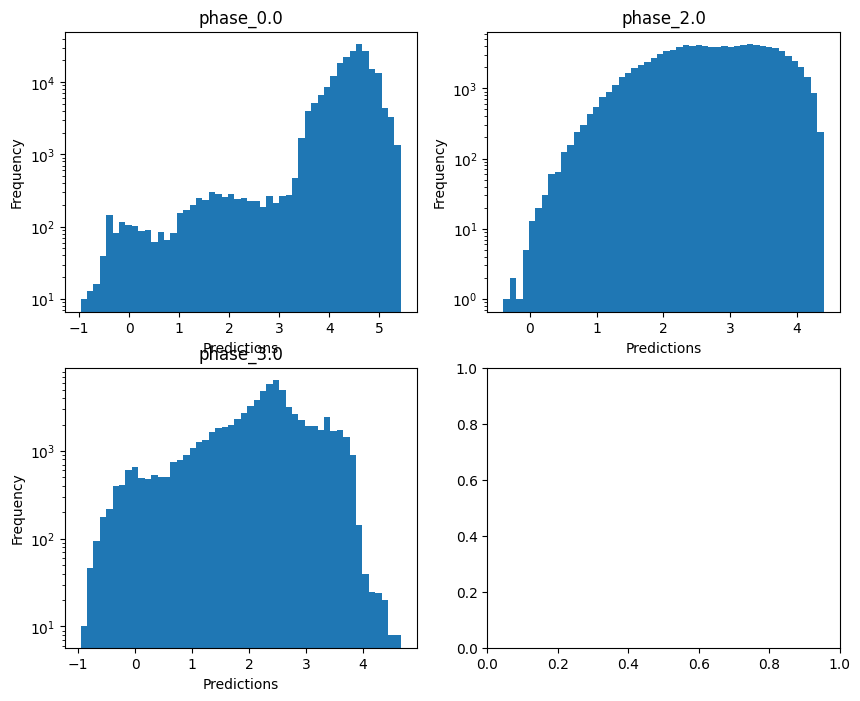

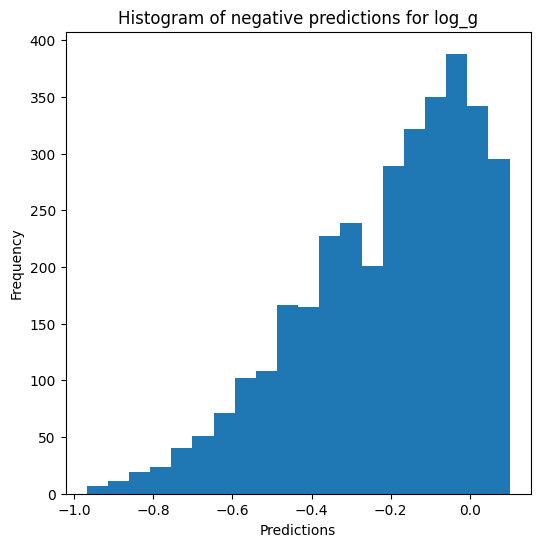


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8281033176751165
  RMSE :  0.17643319728525692
  MAE :  0.027668890498889688
  MedAE :  0.0009859212692997499
  CORR :  0.9252879789192493
  MAX_ER :  2.7867541324431553
  Percentiles : 
    75th percentile :  0.0025194023857822156
    90th percentile :  0.006800658624575902
    95th percentile :  0.02284424184294124
    99th percentile :  1.0803306800045425

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.2928967226437884
  RMSE :  0.391525322393493
  MAE :  0.17958327719574818
  MedAE :  0.006804017801876894
  CORR :  0.6170933416019698
  MAX_ER :  2.2488836321939556
  Percentiles : 
    75th percentile :  0.1663353484082455
    90th percentile :  0.7142857729455601
    95th percentile :  1.0054283949560476
    99th percentile :  1.4830872510061388

radius results for the phase cate

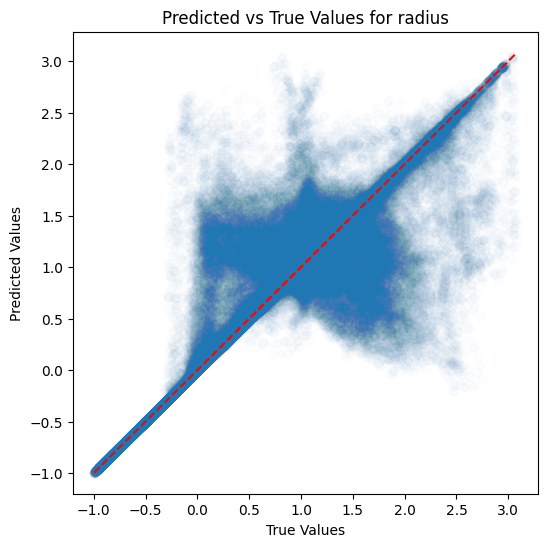

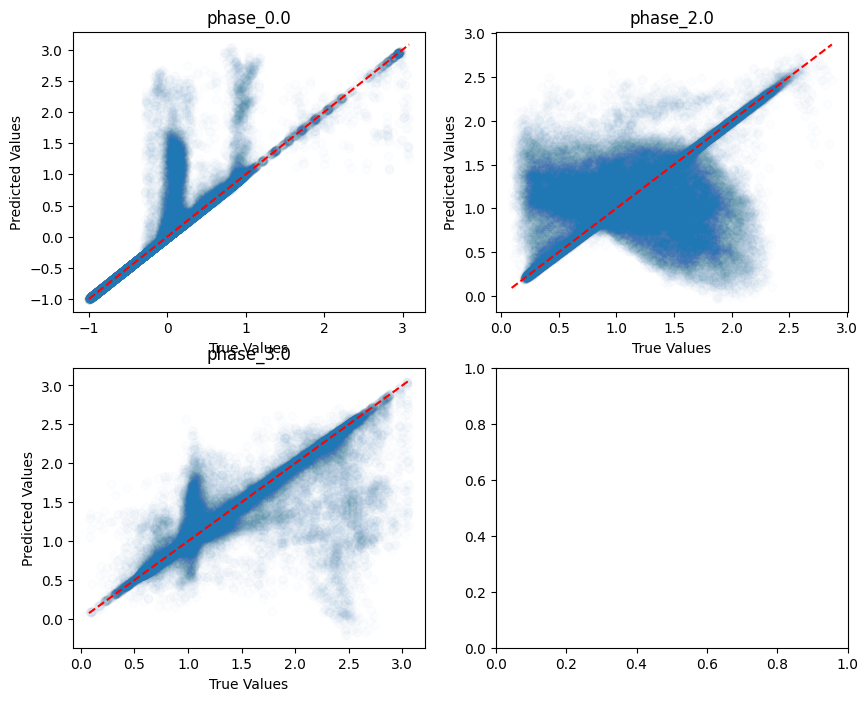

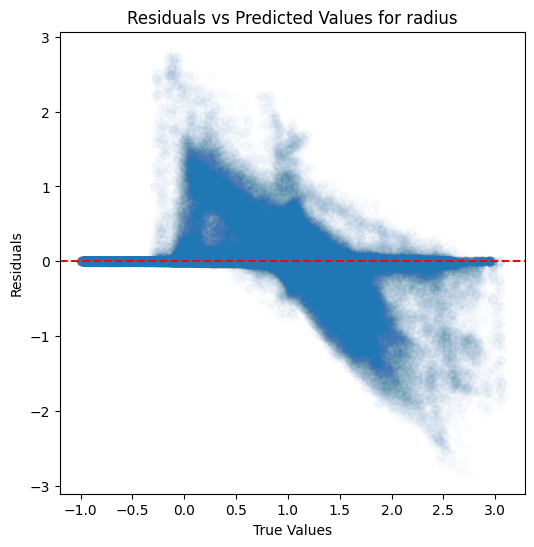

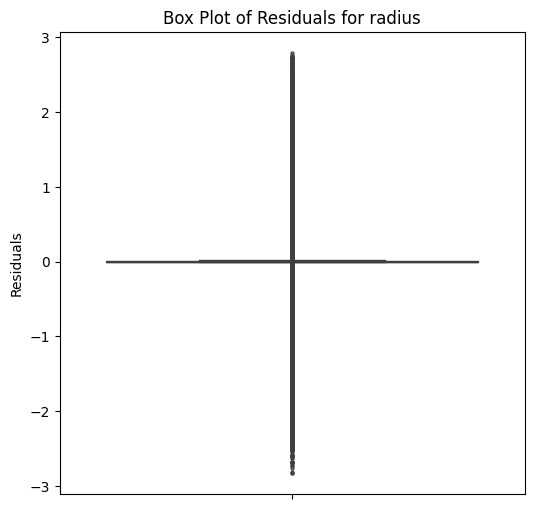

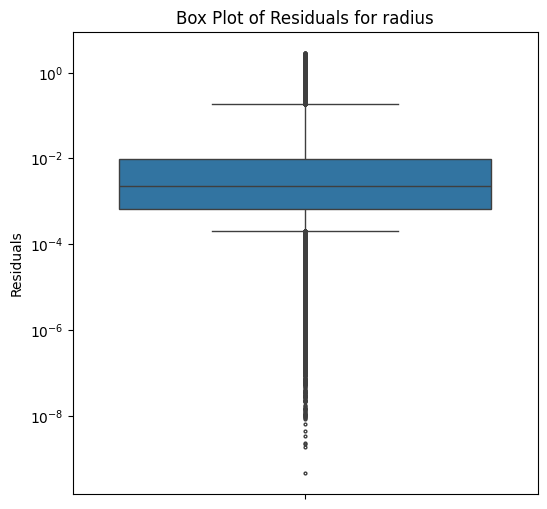

...

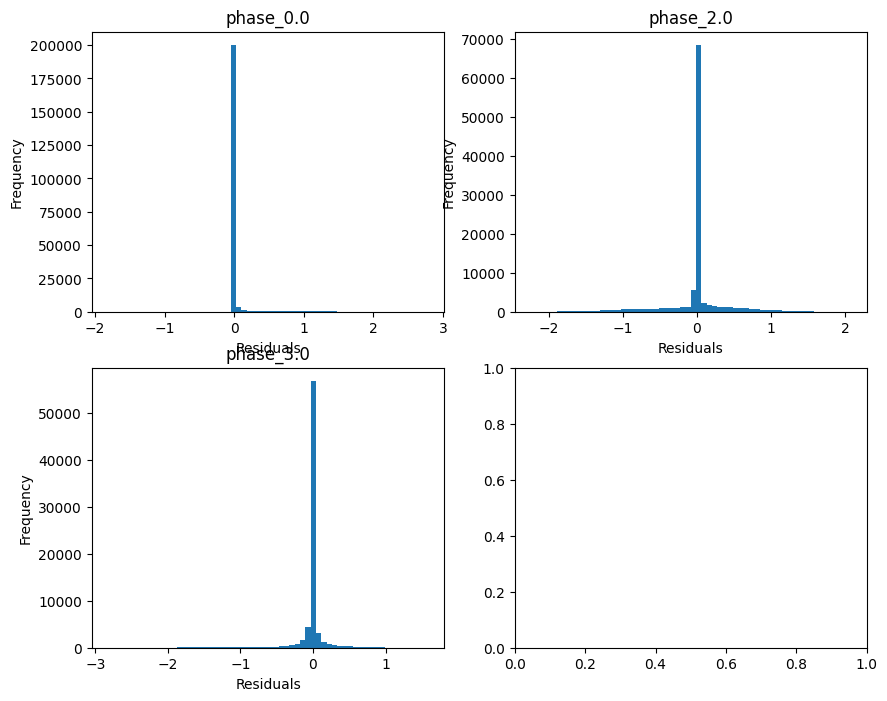

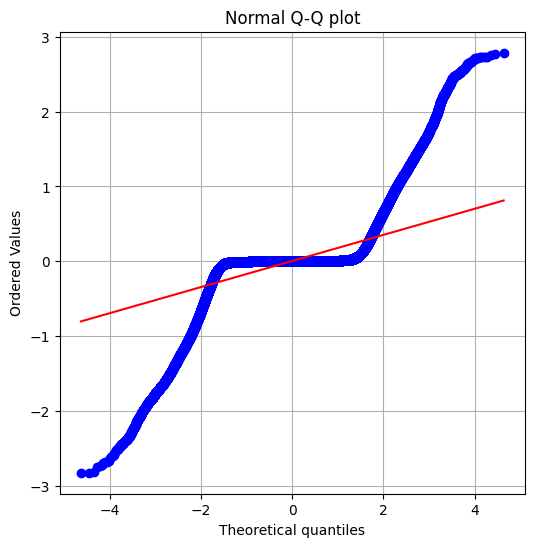

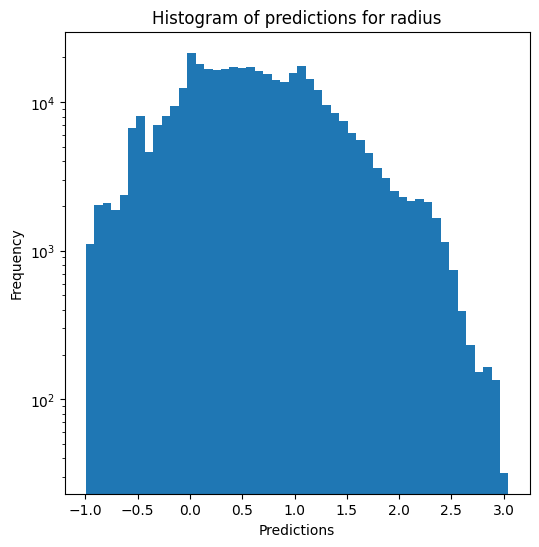

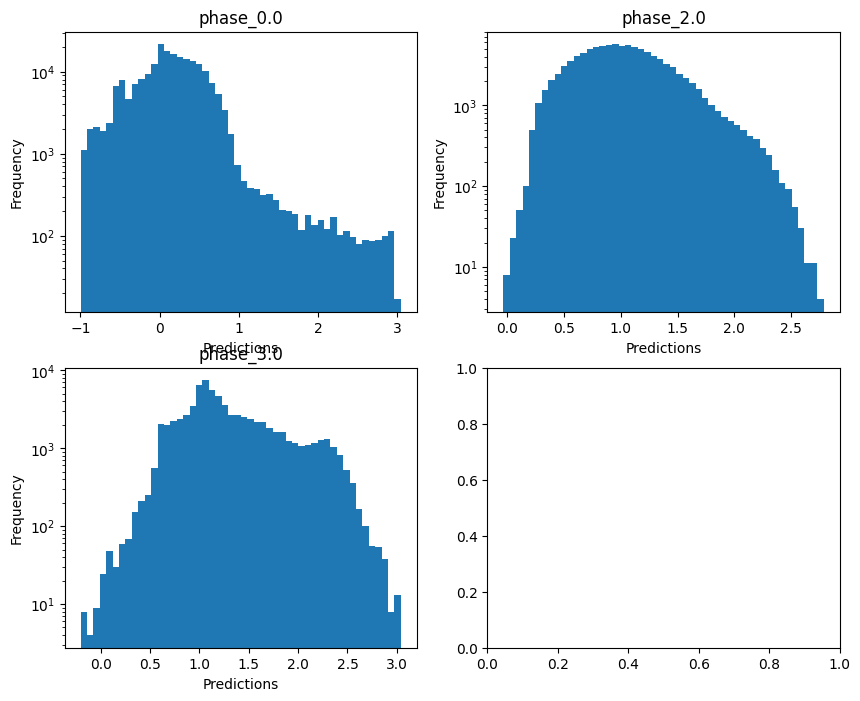

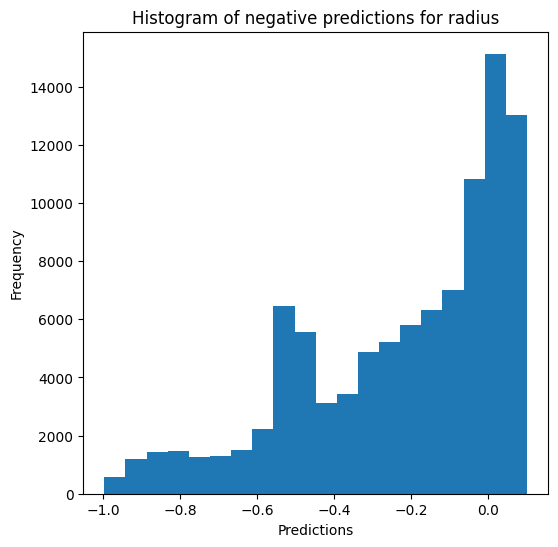

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.933013458780722
  RMSE :  0.08431970287647075
  MAE :  0.04424979078844287
  MedAE :  0.012534692369013278
  CORR :  0.9659838905277033
  MAX_ER :  0.7503400363092769
  Percentiles : 
    75th percentile :  0.049167817842731054
    90th percentile :  0.13675683965992855
    95th percentile :  0.2010609257221268
    99th percentile :  0.3365294062745608

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7798858689355284
  RMSE :  0.11811791658050352
  MAE :  0.08954221114789655
  MedAE :  0.06986249309067771
  CORR :  0.8831732227039992
  MAX_ER :  0.5251987393770499
  Percentiles : 
    75th percentile :  0.12339585190419311
    90th percentile :  0.1960160736920444
 

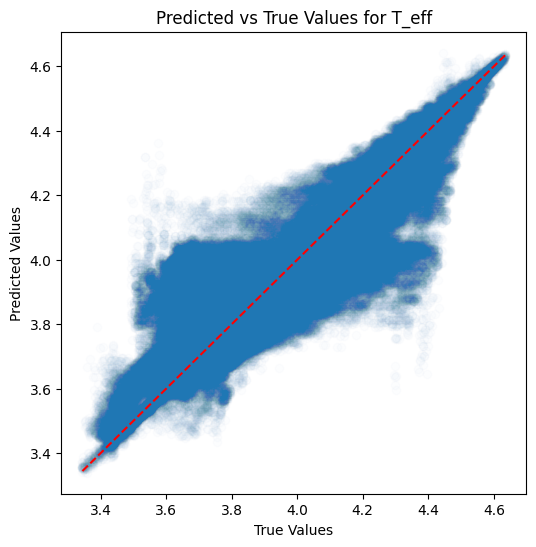

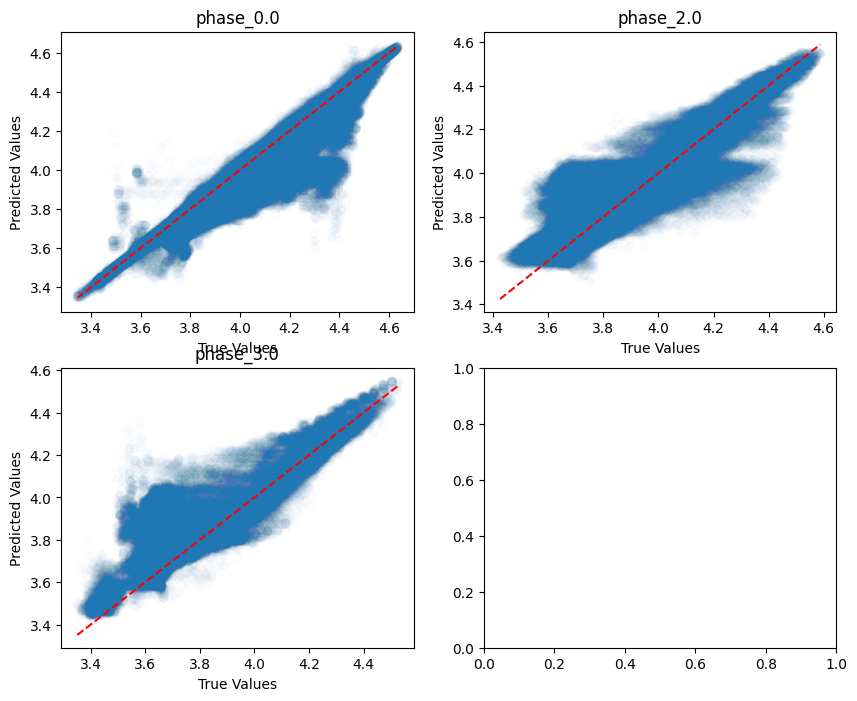

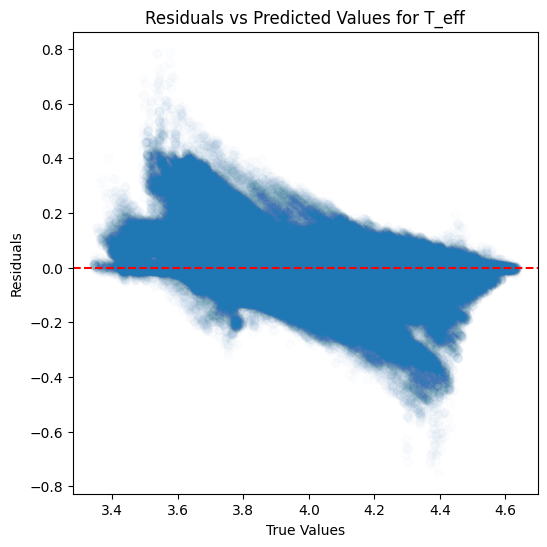

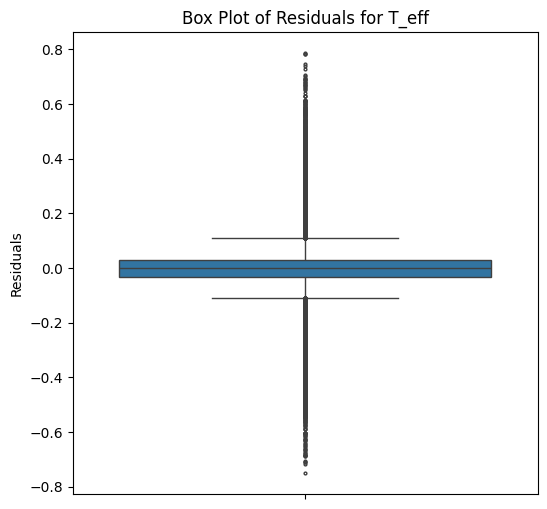

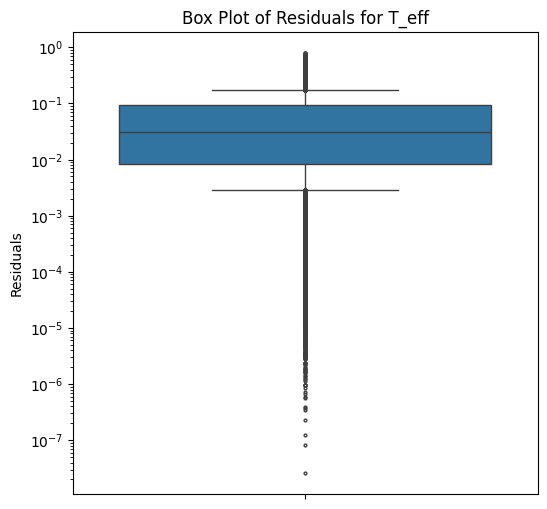

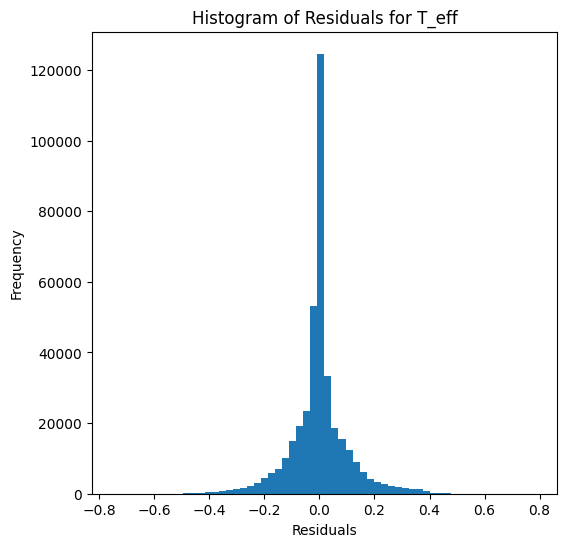

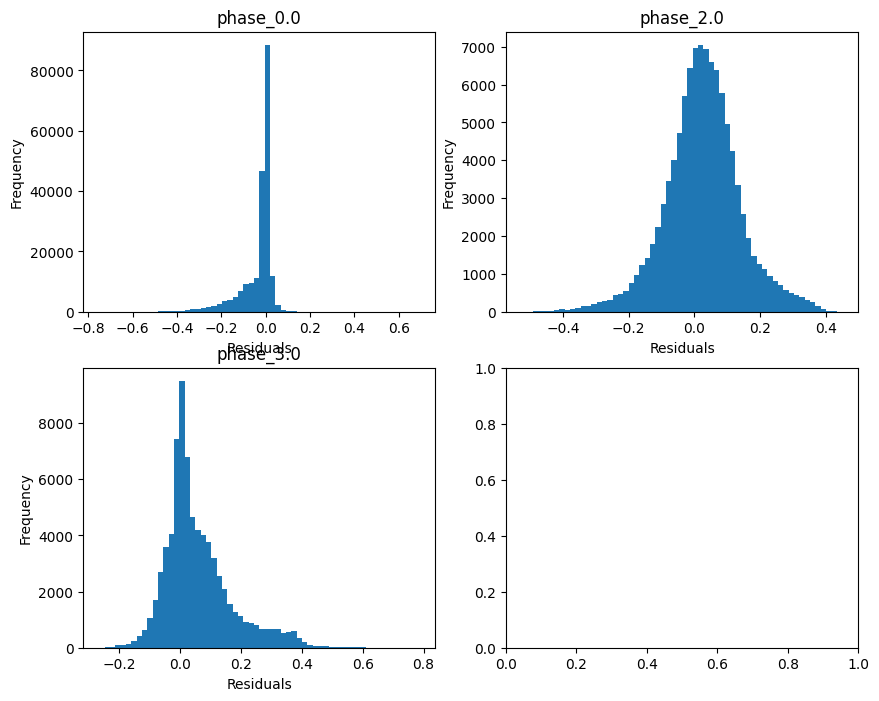

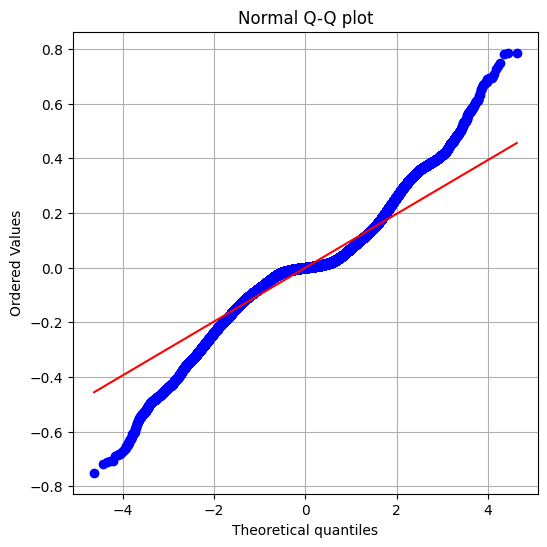

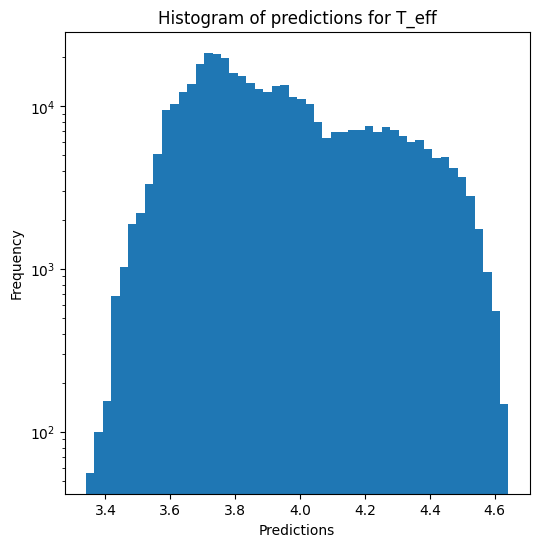

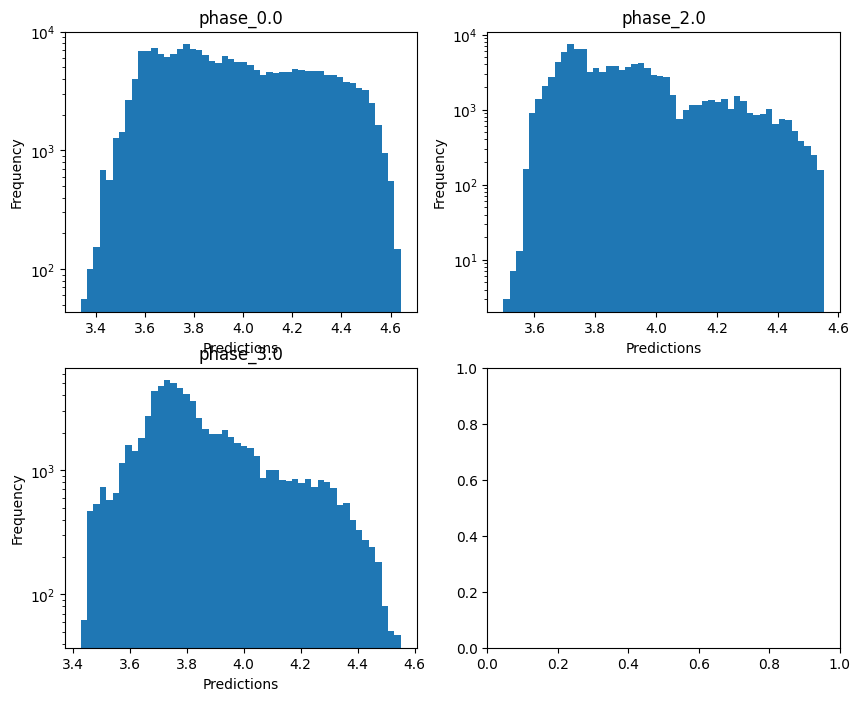


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.018948237648885646
  RMSE :  0.4962858615106038
  MAE :  0.2620423301125916
  MedAE :  0.0637093868708778
  CORR :  0.8397056879238349
  MAX_ER :  4.901284569780921
  Percentiles : 
    75th percentile :  0.31553951786377255
    90th percentile :  0.846558109890059
    95th percentile :  1.16492559693392
    99th percentile :  1.7241026108096045

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.36239756864070616
  RMSE :  0.7500645434533975
  MAE :  0.5828687080526076
  MedAE :  0.4671696717123348
  CORR :  0.6019953266966557
  MAX_ER :  3.752134094927184
  Percentiles : 
    75th percentile :  0.8357411968599012
    90th percentile :  1.239358402062716
    95th percentile :  1.5061814217355696
    99th percentile :  2.08657699740948

log_g results for the phase category with a value of

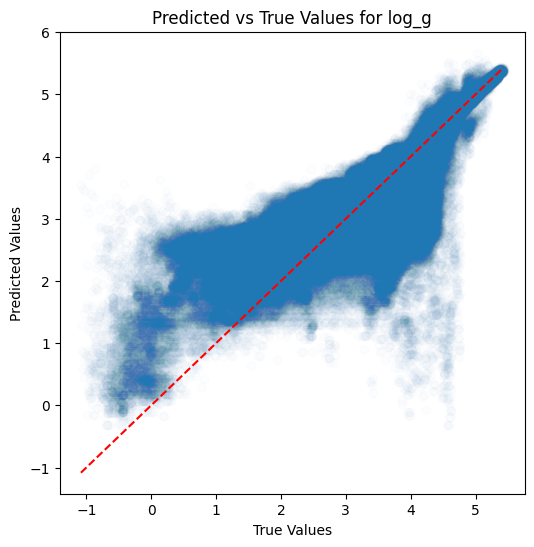

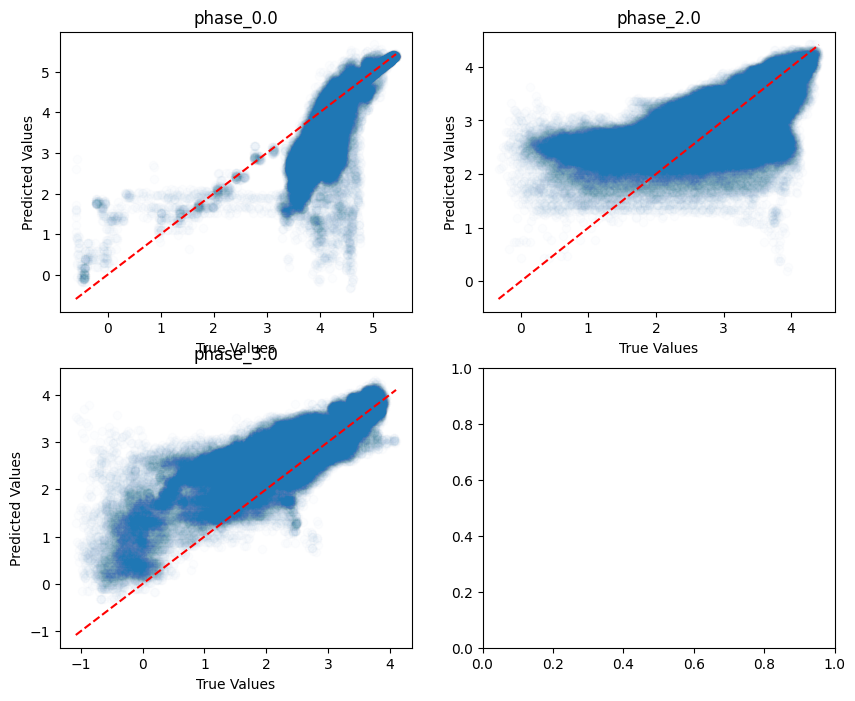

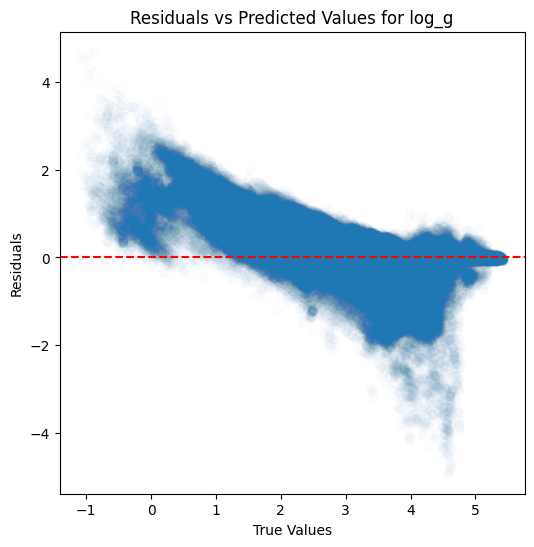

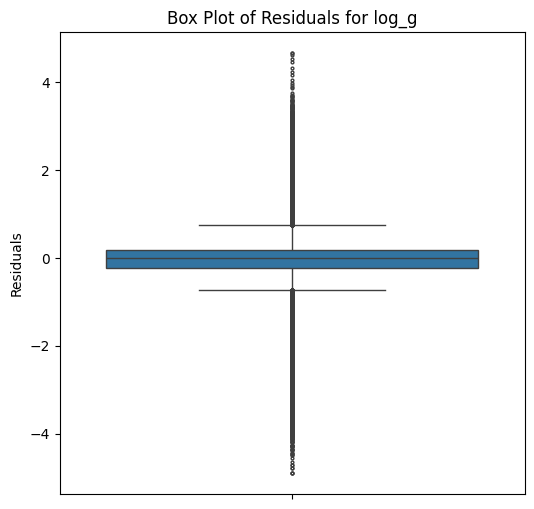

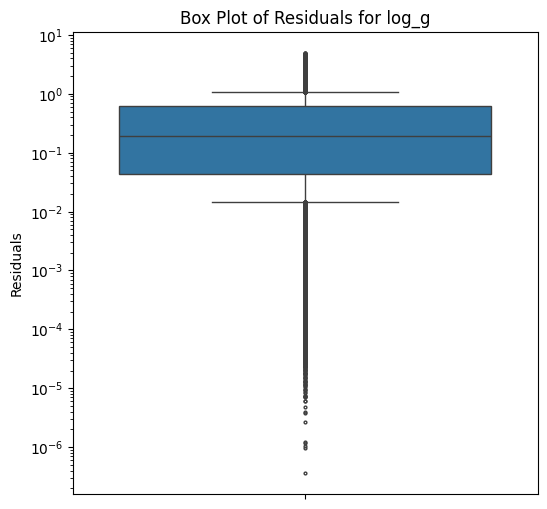

...

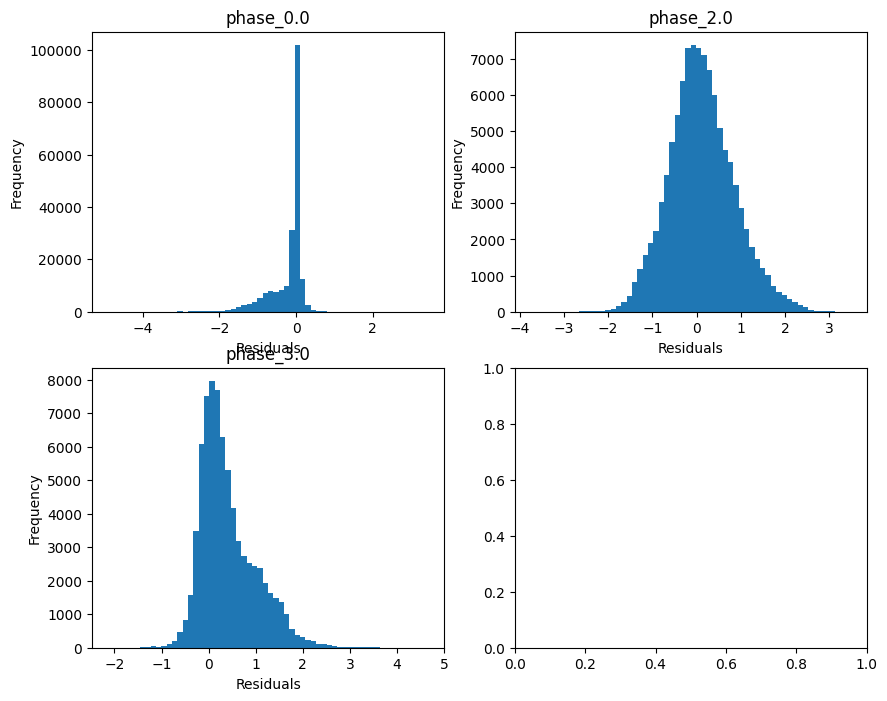

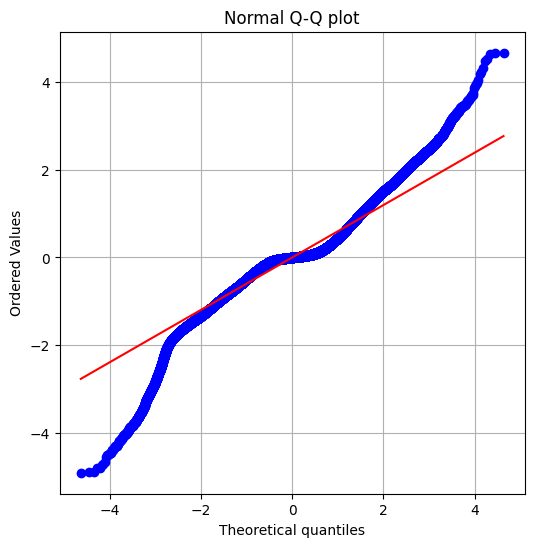

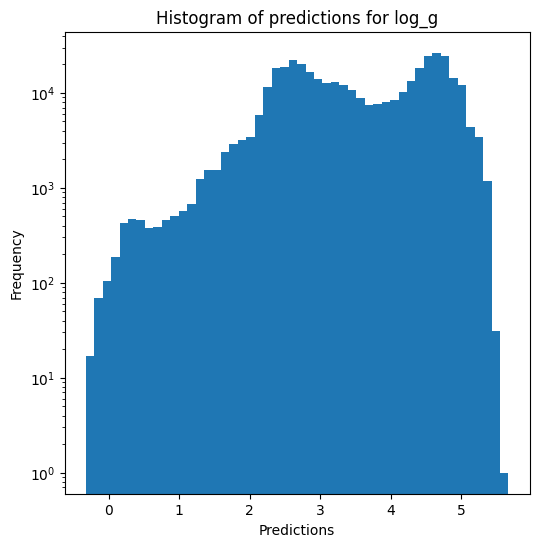

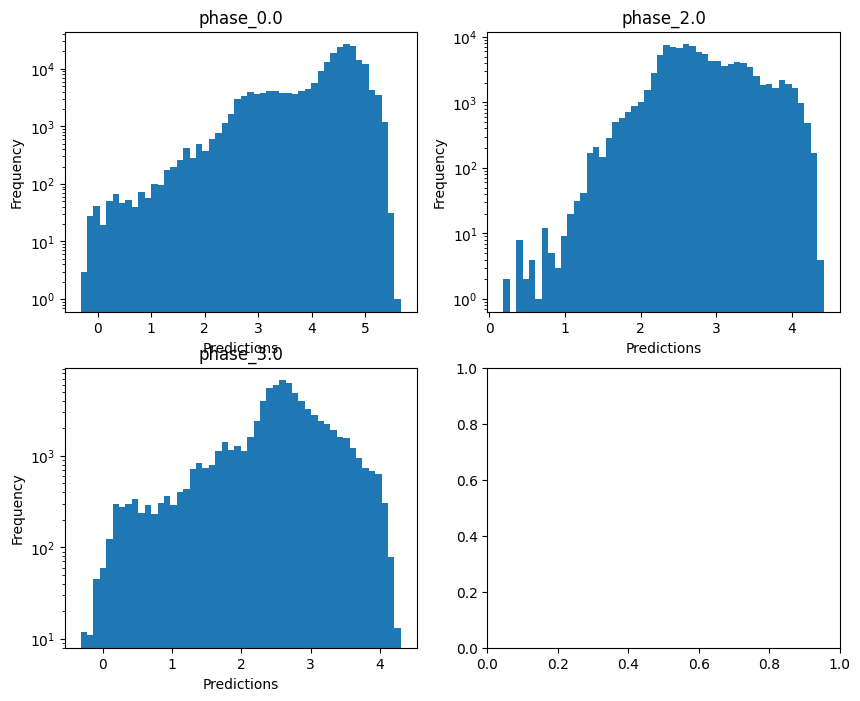

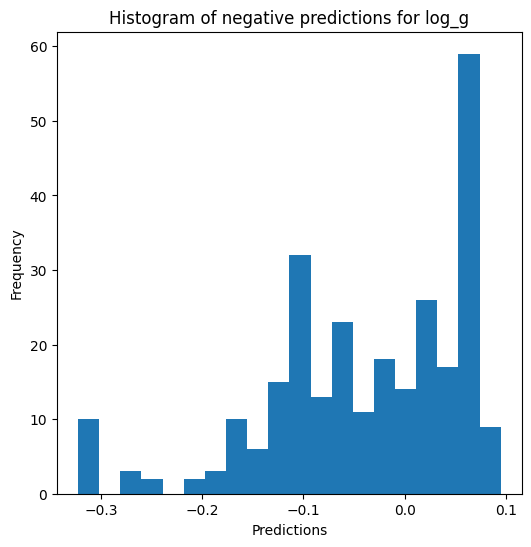


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7103318865725634
  RMSE :  0.2491456321725422
  MAE :  0.13284404028897434
  MedAE :  0.034399368211020645
  CORR :  0.9153940522060119
  MAX_ER :  2.3967227868762815
  Percentiles : 
    75th percentile :  0.16001253673211768
    90th percentile :  0.42864744859865167
    95th percentile :  0.5841995871942373
    99th percentile :  0.8628514107276531

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.36747200248326994
  RMSE :  0.3746517564309173
  MAE :  0.2909320232242085
  MedAE :  0.23317355090614733
  CORR :  0.6069760327641464
  MAX_ER :  1.8294645267025322
  Percentiles : 
    75th percentile :  0.4177466135988253
    90th percentile :  0.618950914786631
    95th percentile :  0.7518630393545026
    99th percentile :  1.0420476442388038

radius results for the phase category wit

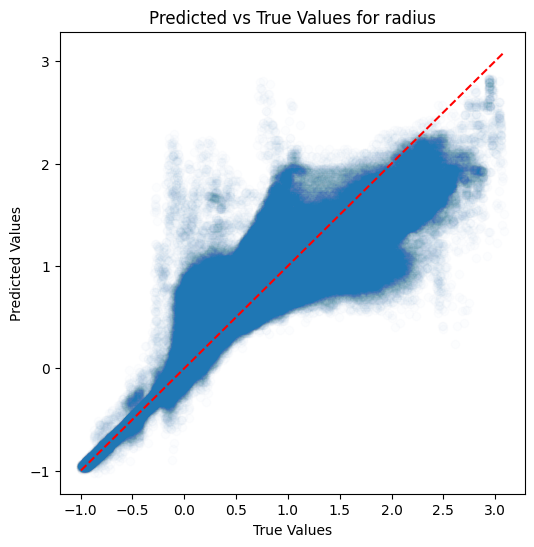

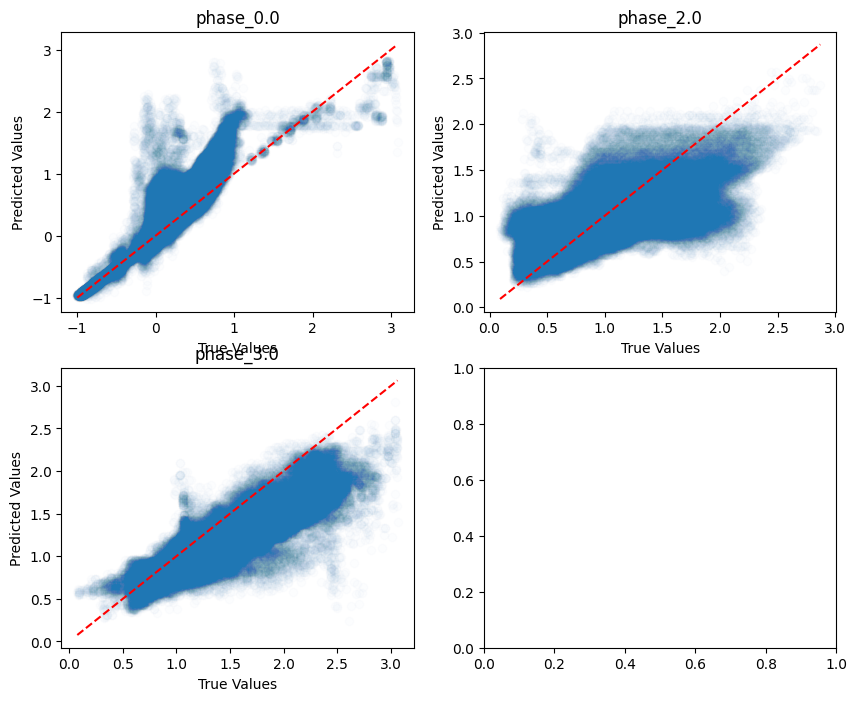

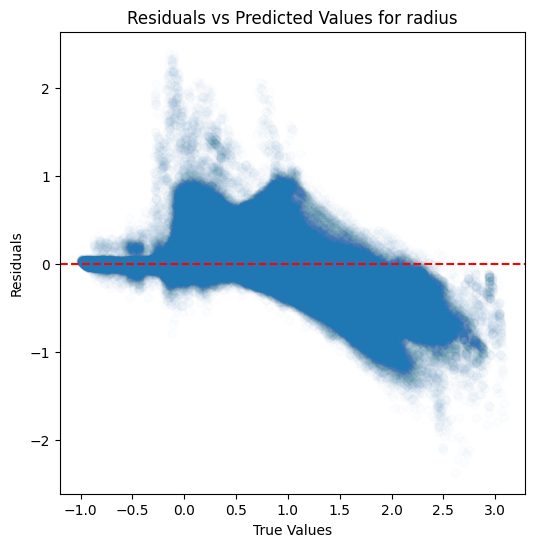

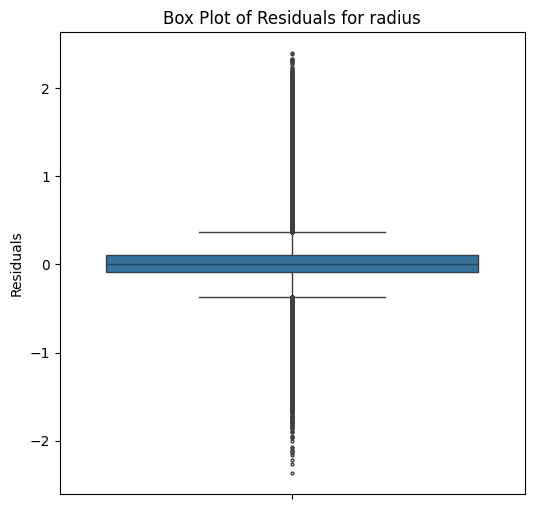

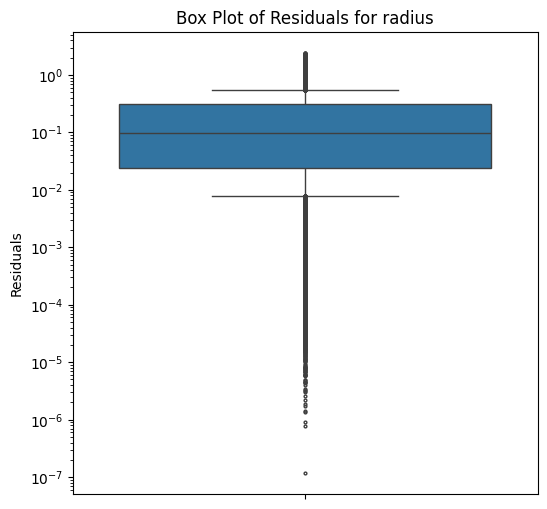

...

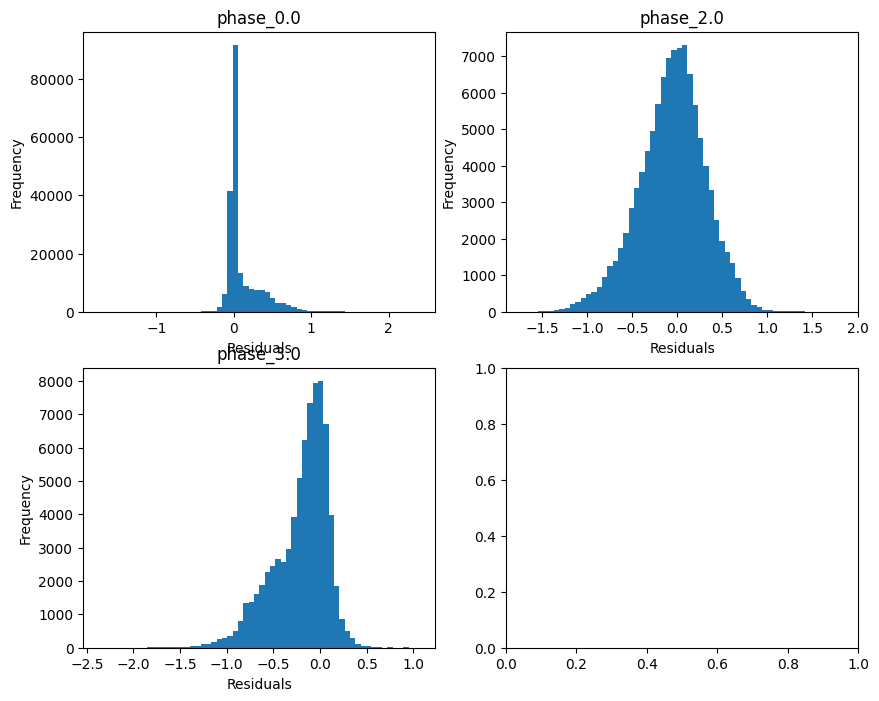

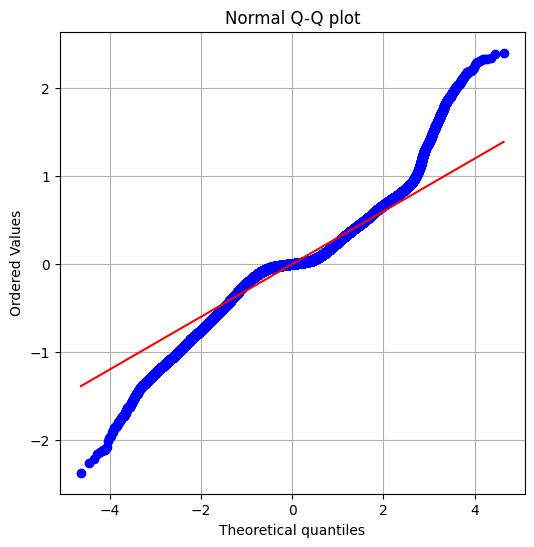

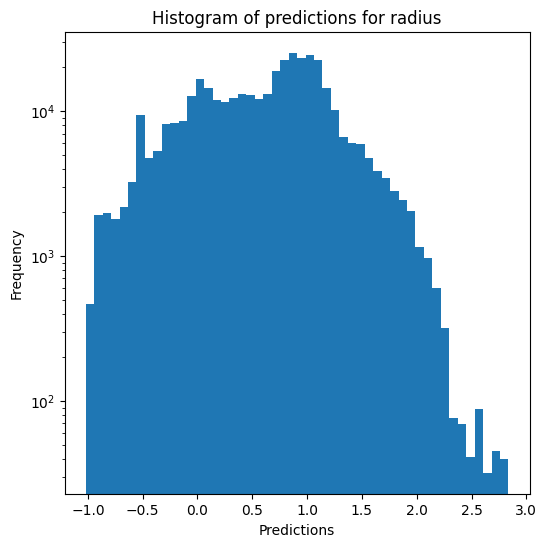

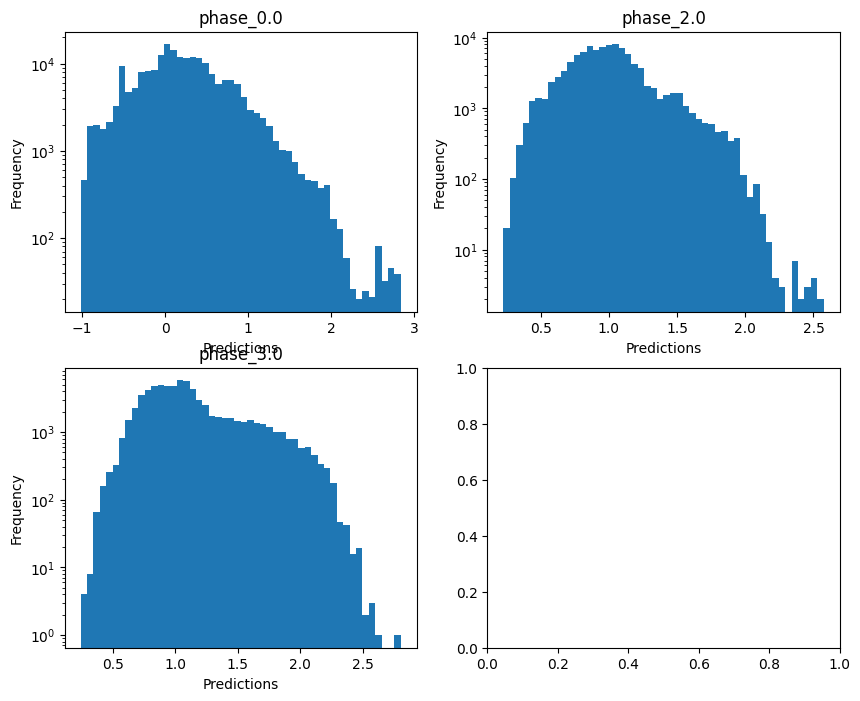

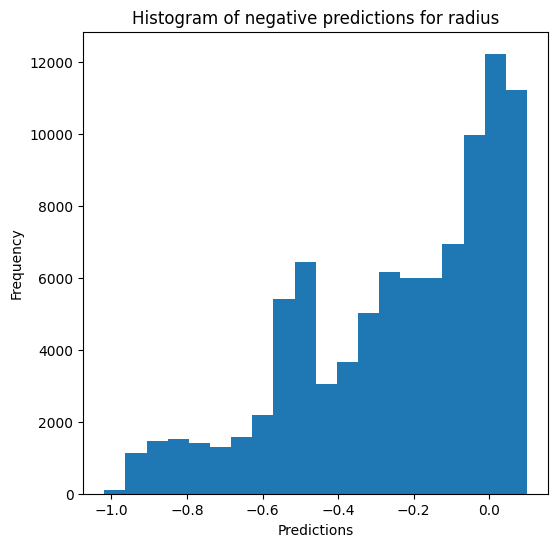

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile_14 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09216880600701874
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09186667702278986
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09423217417482778
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.09409061981605438
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08913081511022086

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9074510025218622
  RMSE :  0.09663847069490081
  MAE :  0.052164308181134225
  MedAE :  0.022651574300139643
  CORR :  0.9528540812347648
  MAX_ER :  0.6026704182313751
  Percentiles : 
    75th percentile :  0.048391495670316864
    90th percentile :  0.14600728215778797
    95th percentile :  0.2419477984957223
    99th percentile :  0.4062329995228624

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7594418547575775
  RMSE :  0.12051922071403898
  MAE :  0.08956655153008282
  MedAE :  0.06666027267803498
  CORR :  0.8717062013750054
  MAX_ER :  0.5223324978623927
  Percentiles : 
    75th percentile :  0.12274887771733833
    90th percentile :  0.20021621795978245
    95th percentile :  0.25872684426891723
    99th percen

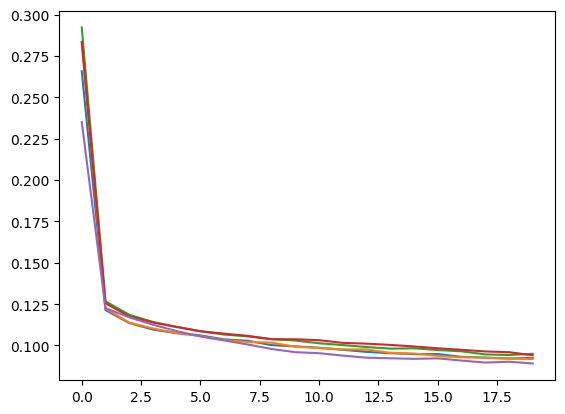

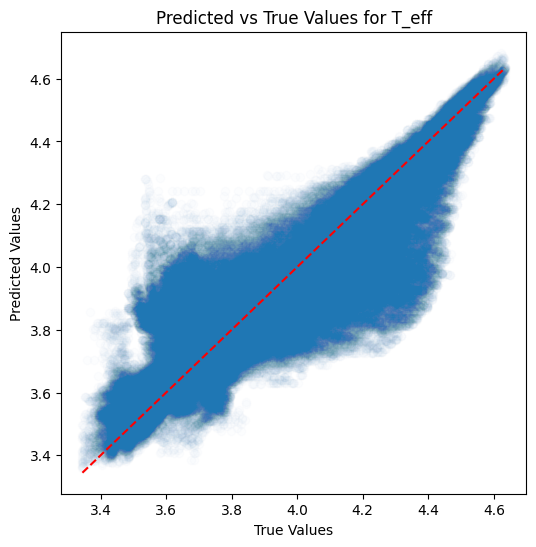

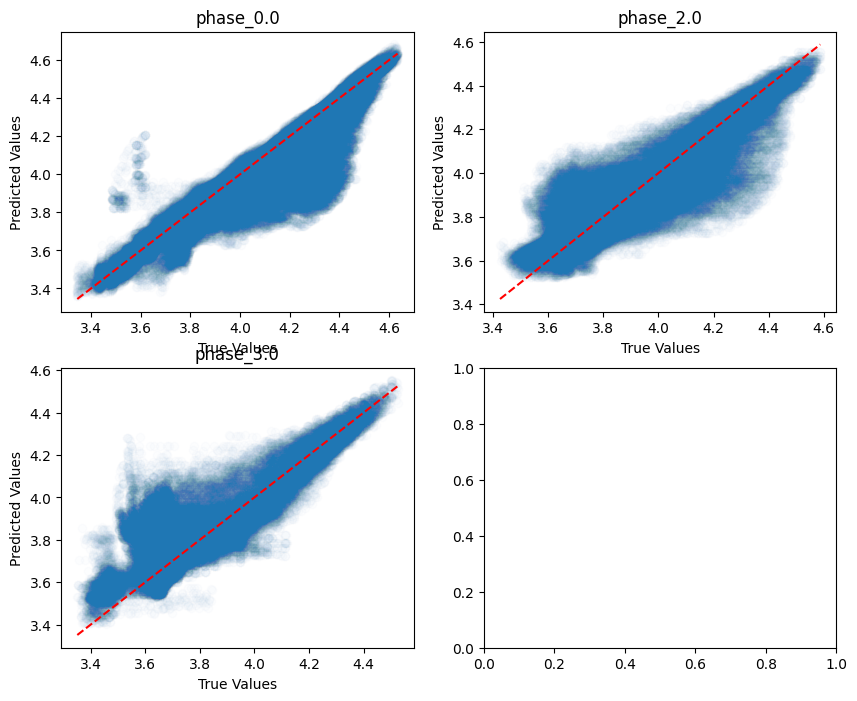

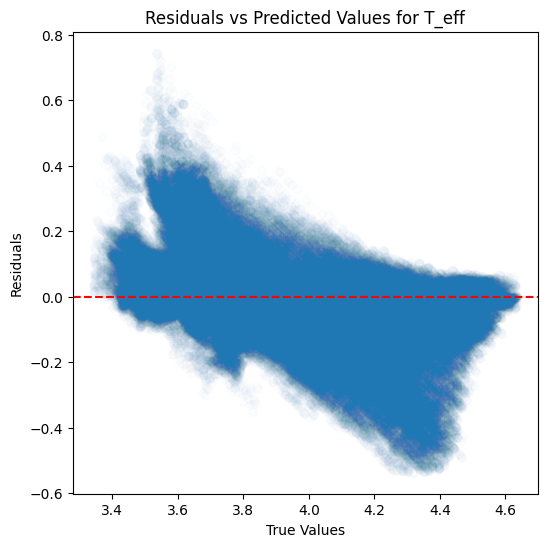

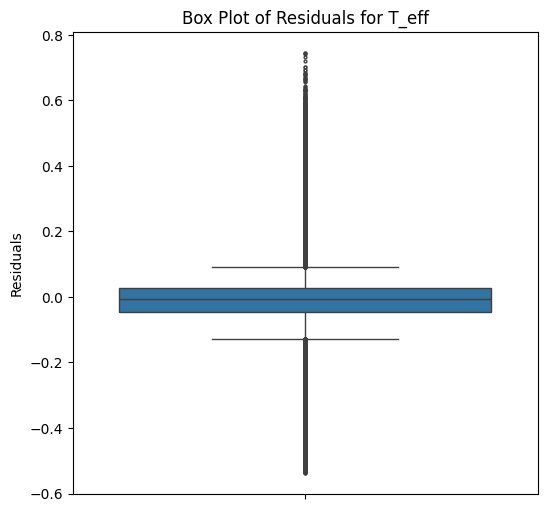

...

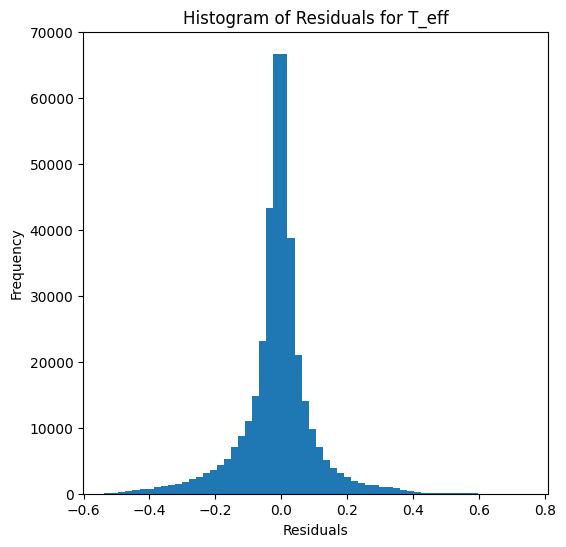

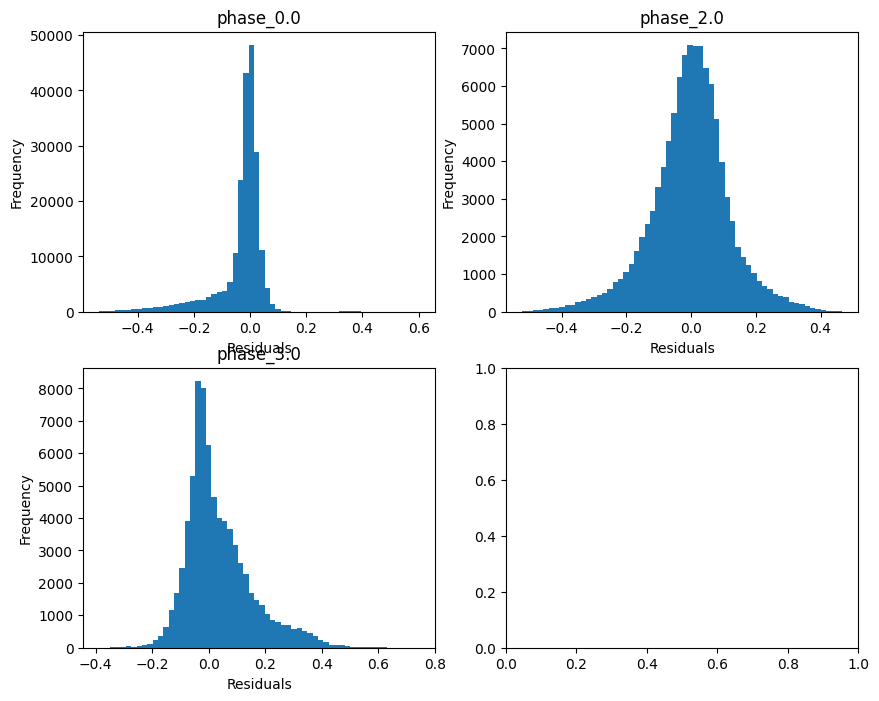

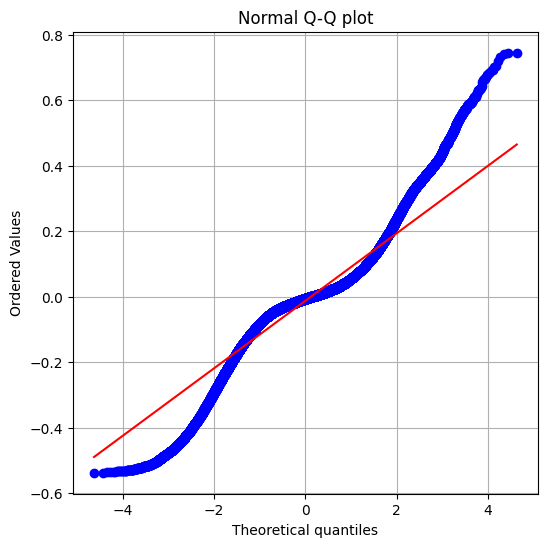

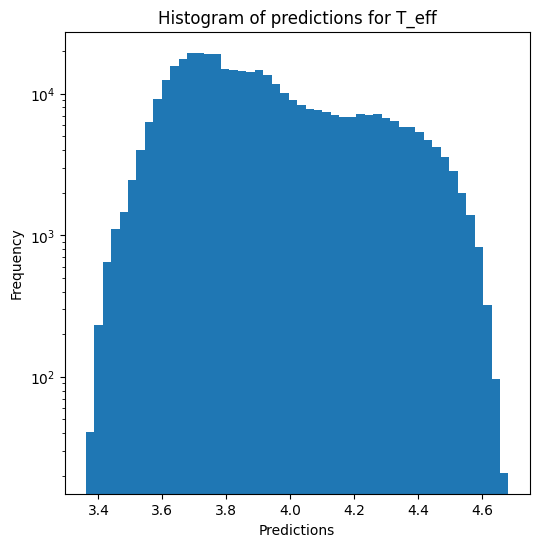

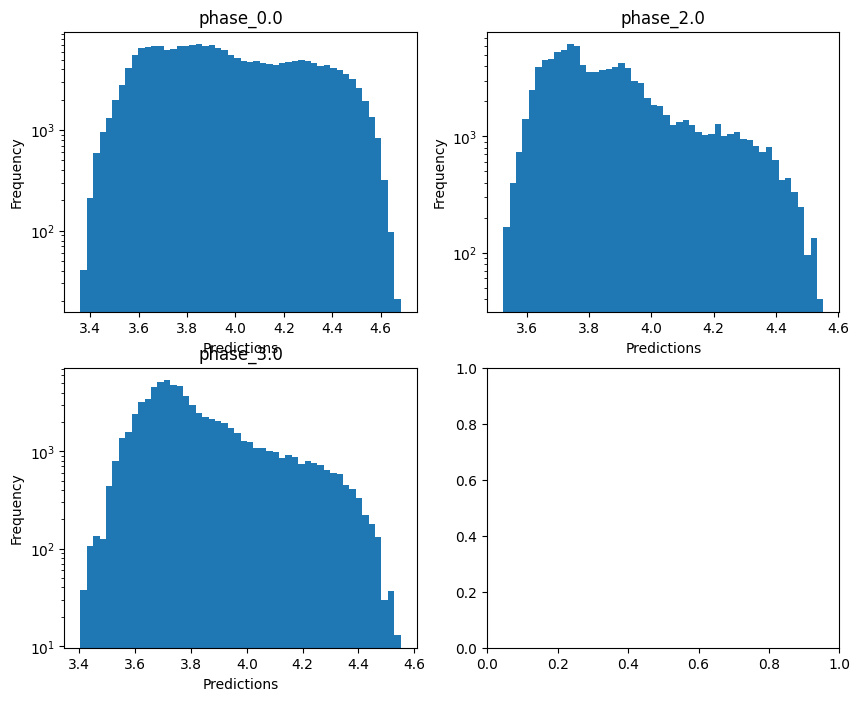

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.1201407107626089
  RMSE :  0.5279816743460098
  MAE :  0.24781964364858
  MedAE :  0.06322879465221032
  CORR :  0.7923012293898206
  MAX_ER :  4.164627781611635
  Percentiles : 
    75th percentile :  0.14100781625159264
    90th percentile :  0.928502399180478
    95th percentile :  1.3613016856801967
    99th percentile :  2.042995970701362

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.34613379328267113
  RMSE :  0.7501158061907882
  MAE :  0.5880906140904205
  MedAE :  0.47750825235859384
  CORR :  0.588914395009335
  MAX_ER :  3.1799777319605234
  Percentiles : 
    75th percentile :  0.8419874494168771
    90th percentile :  1.2612972426484341
    95th percentile :  1.5083060316130878
    99th percentile :  2.008991922279166

log_g results for the phase cat

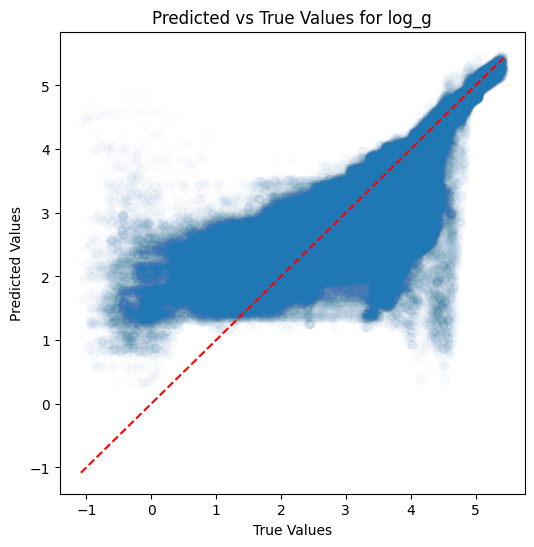

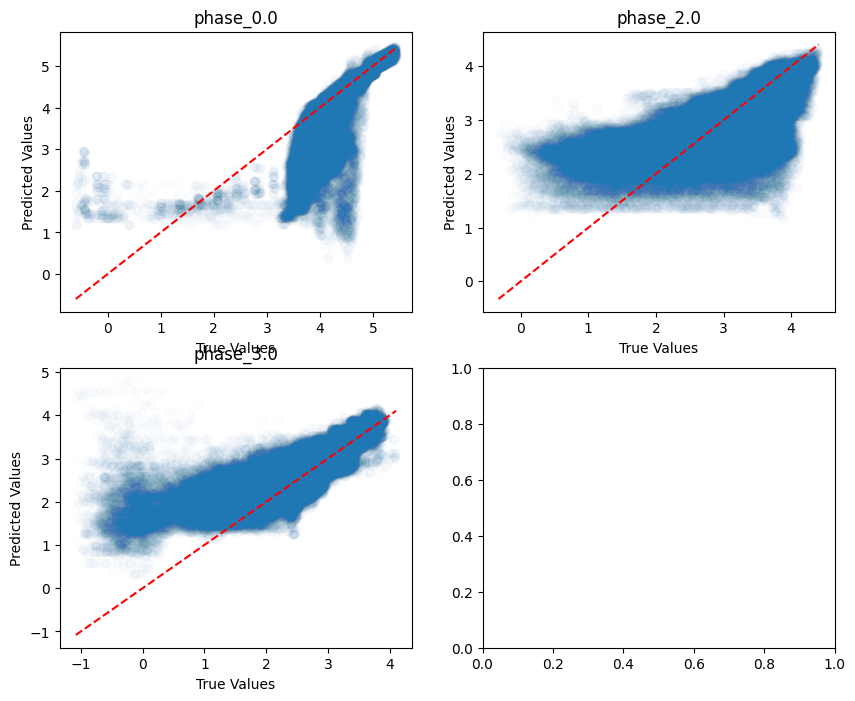

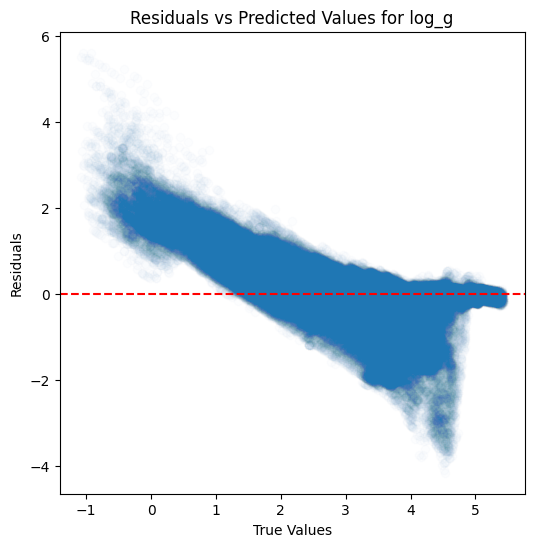

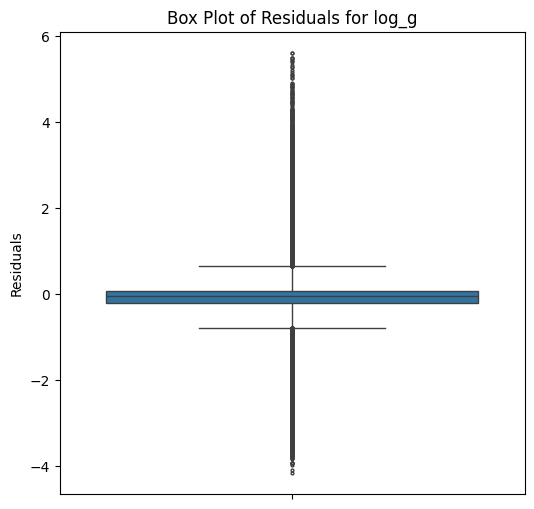

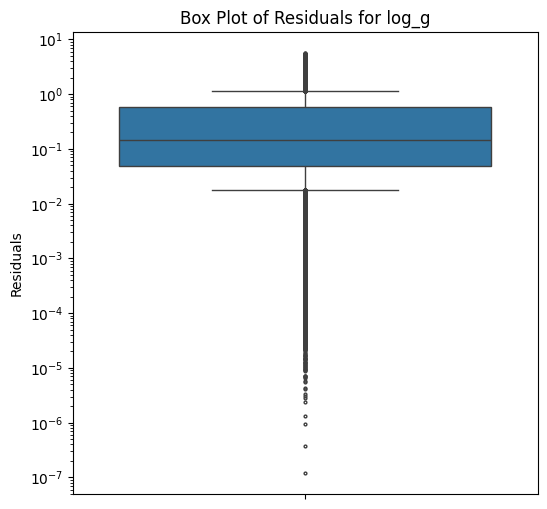

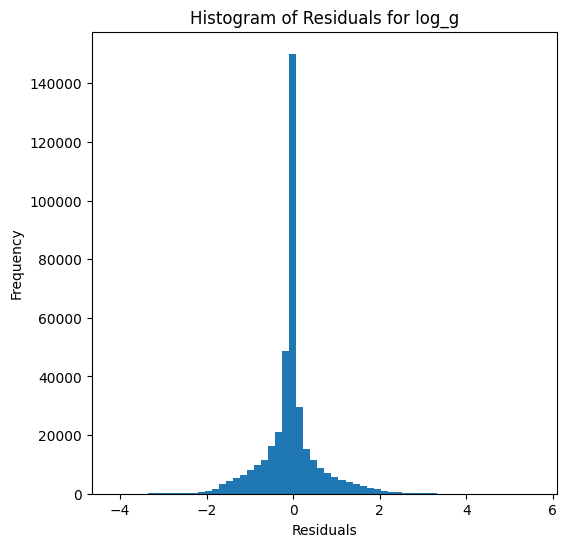

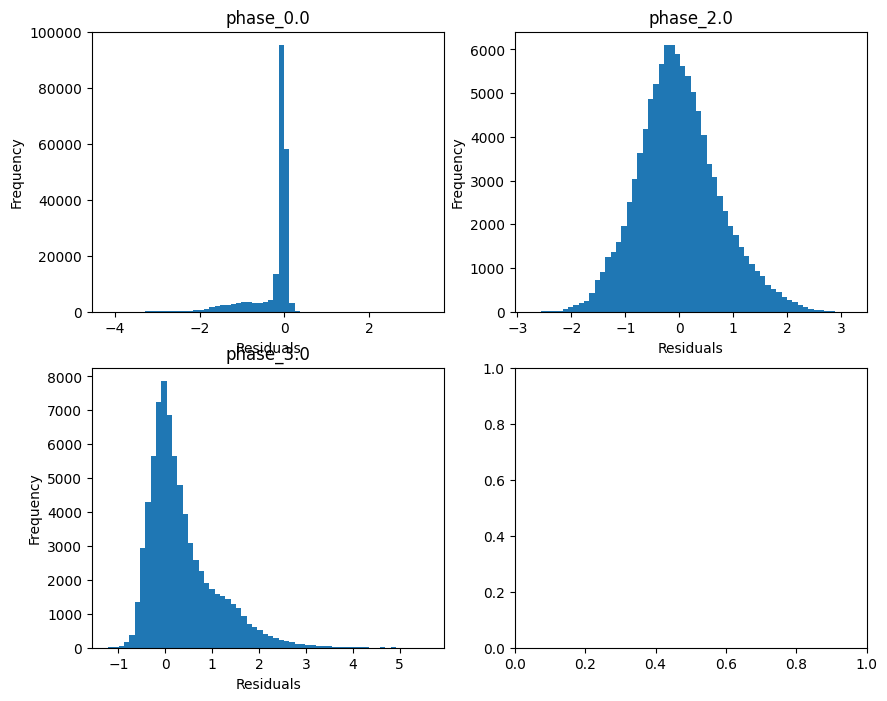

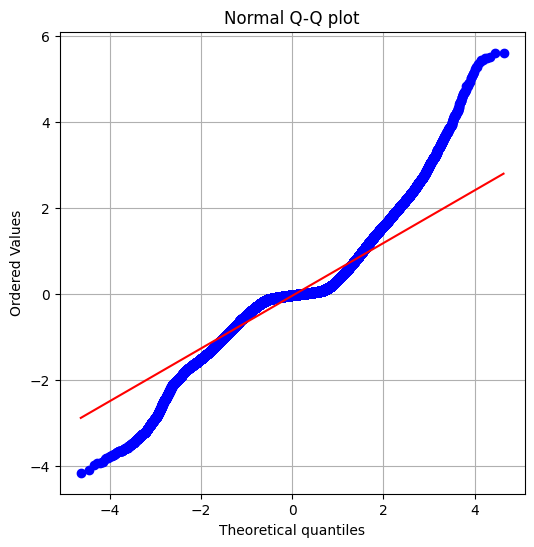

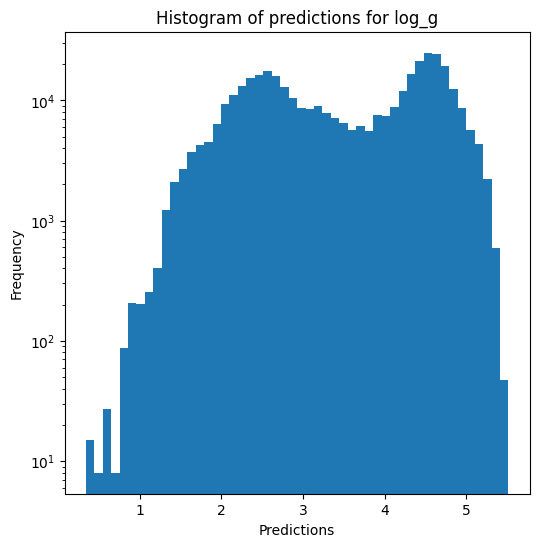

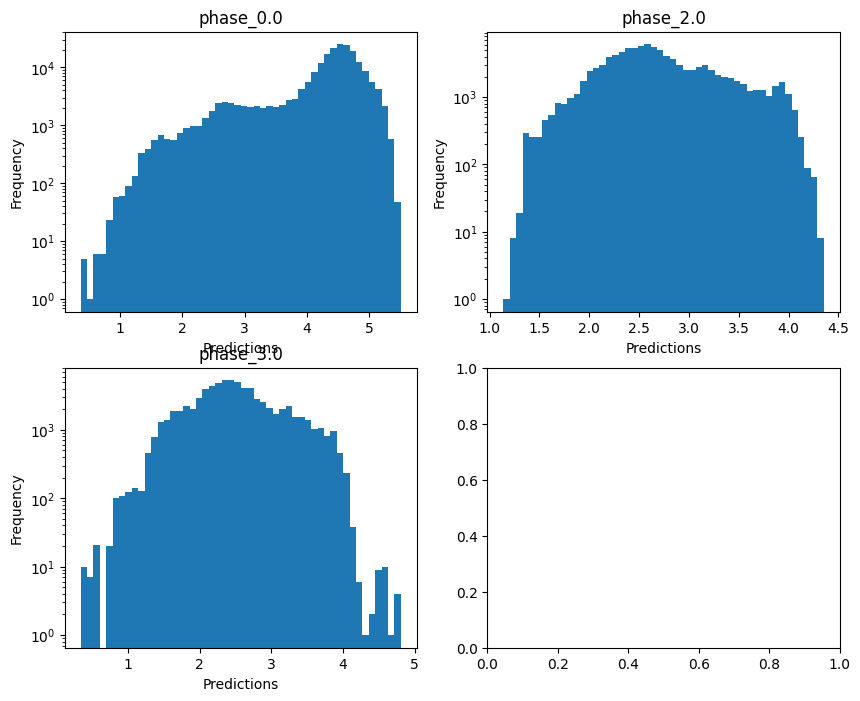


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.6677474613477267
  RMSE :  0.2659802762093696
  MAE :  0.13208600935919343
  MedAE :  0.04307982660109155
  CORR :  0.8944683826803465
  MAX_ER :  2.0605167202121817
  Percentiles : 
    75th percentile :  0.09425183604414511
    90th percentile :  0.4607575601752556
    95th percentile :  0.6834556888425454
    99th percentile :  1.0170904621185763

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.3514178647272045
  RMSE :  0.3747120802420946
  MAE :  0.29374858172490975
  MedAE :  0.2386790400971351
  CORR :  0.5978582819633786
  MAX_ER :  1.5931528330346052
  Percentiles : 
    75th percentile :  0.42096443318157073
    90th percentile :  0.6290370278515688
    95th percentile :  0.7529807876144684
    99th percentile :  1.00198796542708

radius results for the phase category with a

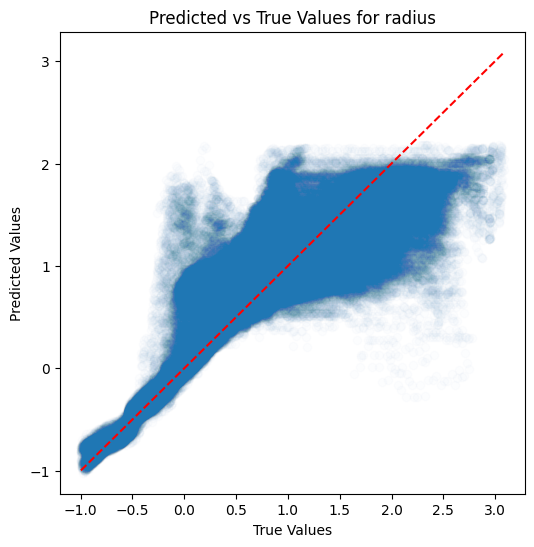

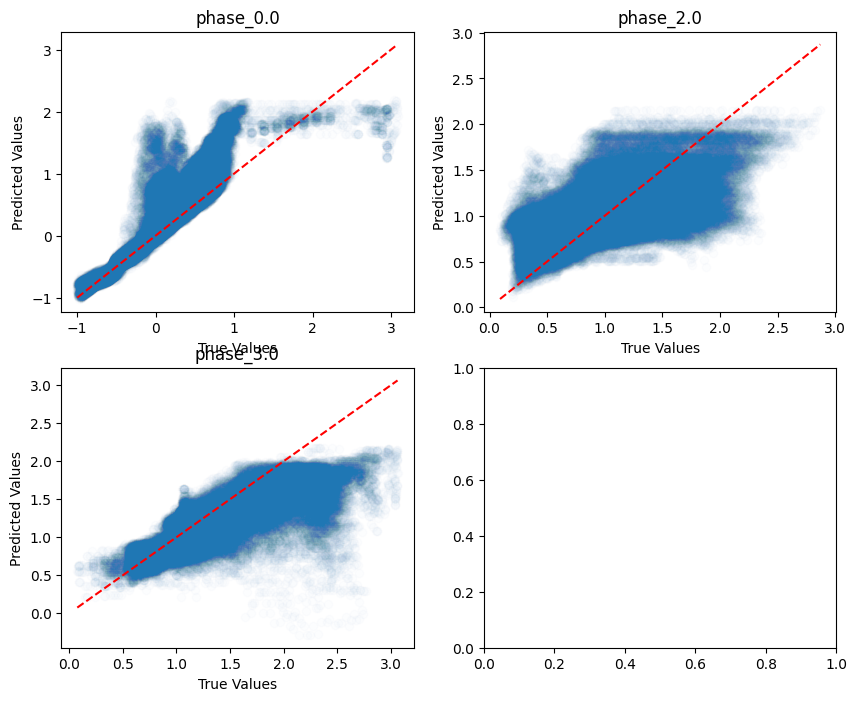

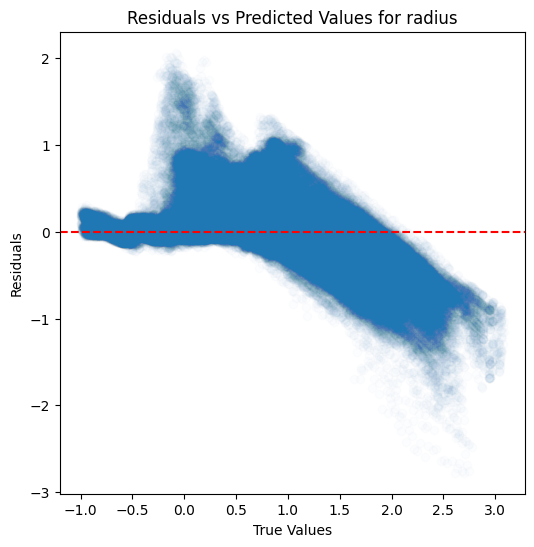

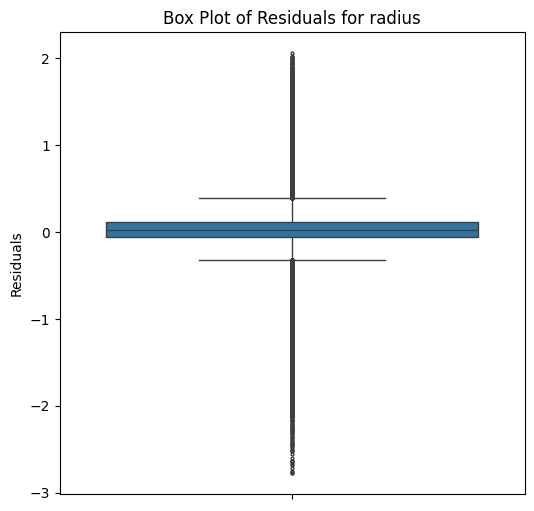

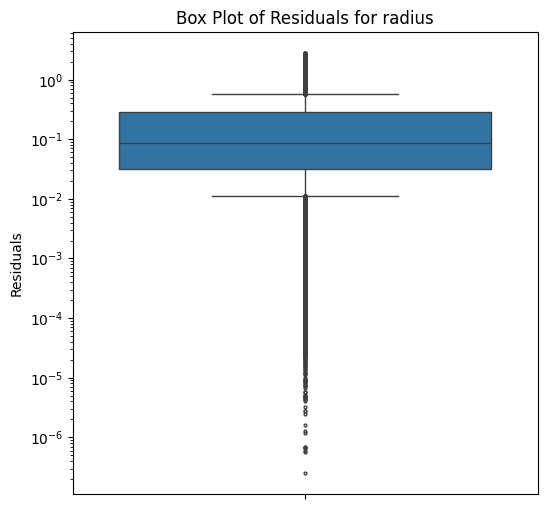

...

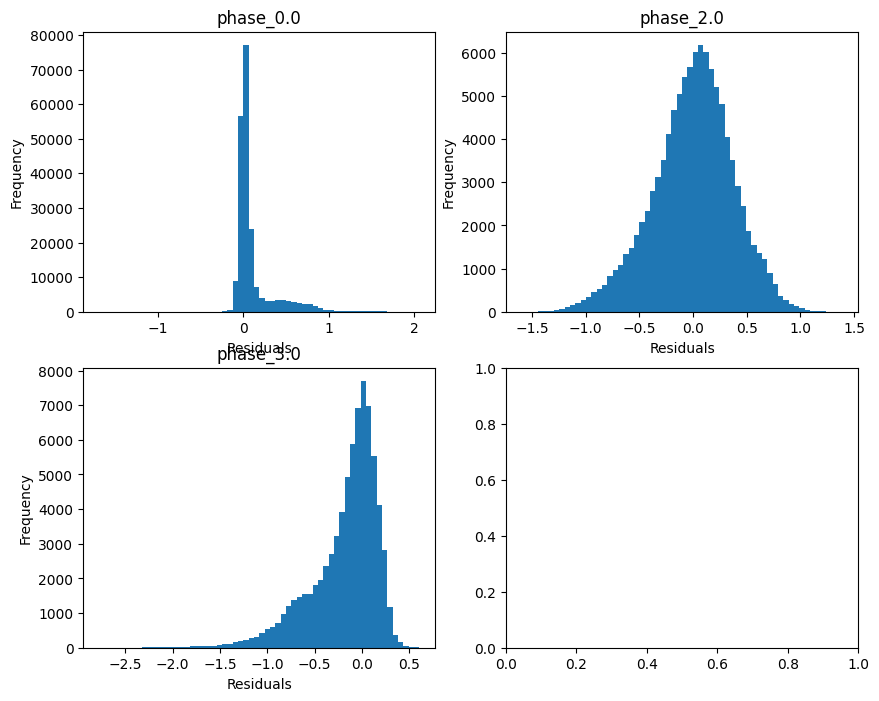

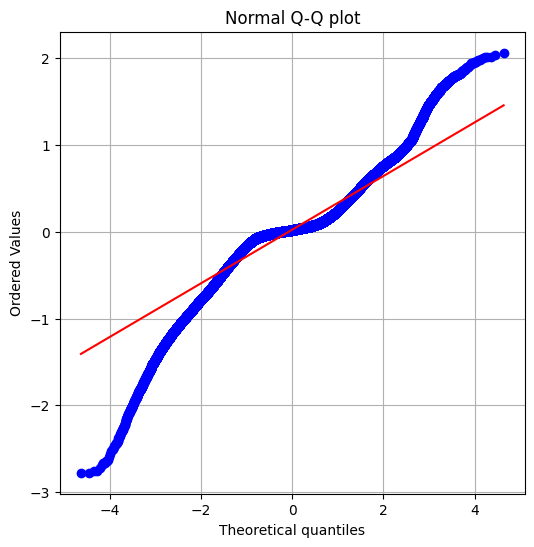

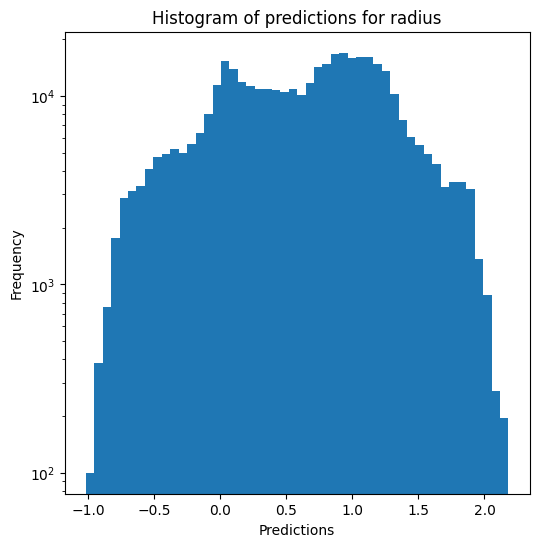

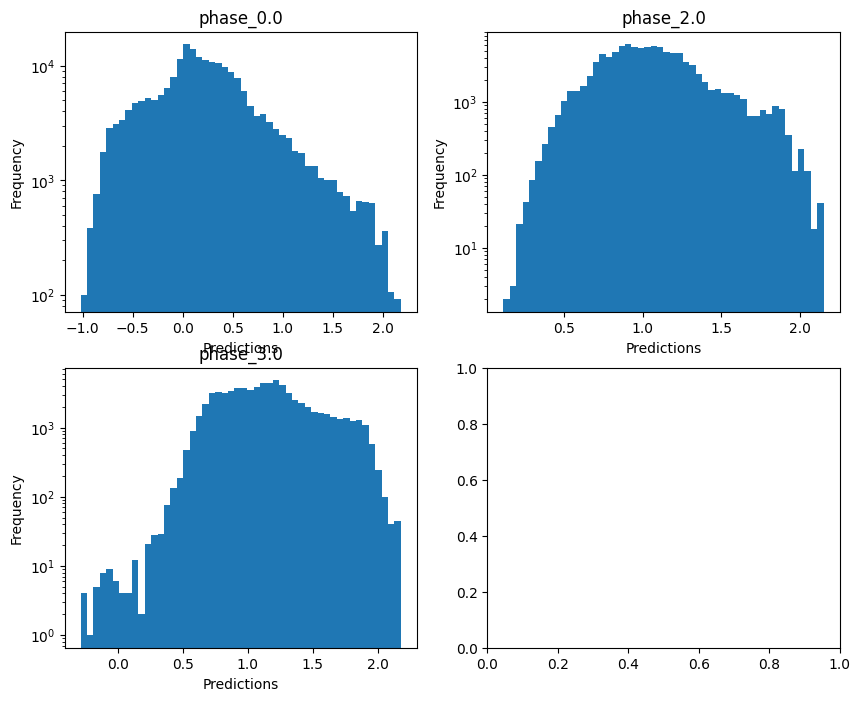

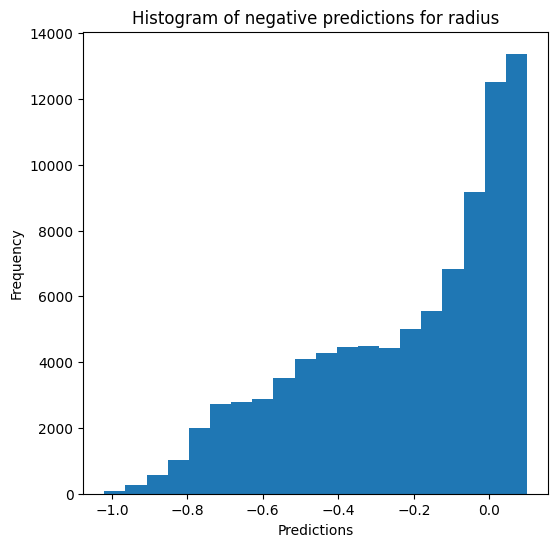

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon